# Estimating Future Projections of Tornado Count Activity in CMIP6 
notebook by Kelsey Malloy<br>
project: Schroder, Z., Fricker, T., Burow, D., Malloy, K.<br>
data needed for running: SPC reports 1980-2014**, CMIP6_historical and CMIP_ssp585 model output<br>
** another notebook/script can bew provided for this

In [1]:
import numpy as np
import pandas as pd
import xarray as xr
import zarr
import gcsfs
import xesmf as xe

from matplotlib import pyplot as plt
%matplotlib inline

In [2]:
import cartopy.crs as ccrs
import cartopy.feature as cfeature
PC = ccrs.PlateCarree()

In [3]:
import statsmodels.api as sm
import xgboost as xgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score

## get CONUS land masks

In [8]:
url = 'http://iridl.ldeo.columbia.edu/expert/SOURCES/.WORLDBATH/.bath/X/230/300/RANGE/Y/25/50/RANGE/SOURCES/.Features/.Climatological/.US_climate_regions/.Regions/.the_geom/rasterize/0/maskle/X/230/0.2/300/GRID/Y/24/0.2/50/GRID/dods'
regions = xr.open_dataset(url)
regions['X'] = regions.X.values - 360 # change to same lons
regions = regions.rename({'X': 'lon','Y': 'lat'})
# regions

In [9]:
regions['region_name'] = regions['region_name'].astype('str')
# regions['region_name'].values

In [10]:
%%time
CONUS_mask = regions.the_geom.sum('region_name')
CONUS_mask.shape

CPU times: user 28.2 ms, sys: 12.6 ms, total: 40.8 ms
Wall time: 241 ms


(131, 351)

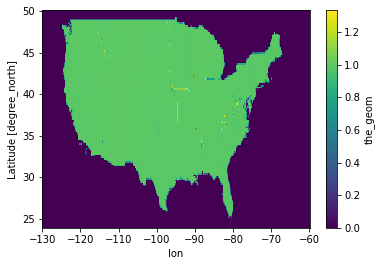

In [11]:
CONUS_mask.plot()

In [12]:
import cartopy#.crs as ccrs
import cartopy.mpl.ticker as cticker
def Map_zoom(row,col,num,londata,latdata):
    extent = [-85, -60, 25, 45]
    cen_lon=(extent[0]+extent[1])/2
    ax = plt.subplot(row,col,num,projection=ccrs.PlateCarree(central_longitude=cen_lon))
    ax.coastlines('50m',color='gray')
    ax.set_extent(extent, ccrs.PlateCarree())
    x,y=np.meshgrid(londata,latdata)
    ax.add_feature(cartopy.feature.STATES,edgecolor='gray')
    return ax,x,y

In [13]:
%%time
ds_out = xr.Dataset({'lat': (['lat'], np.arange(-90,91,1)),
                     'lon': (['lon'], np.arange(0,360,1))}).sel(lat=slice(24,50),lon=slice(-130+360,-60+360)) # US Grid
# ds_out = xr.Dataset({'lat': (['lat'], np.arange(-90,91,1)),
#                      'lon': (['lon'], np.arange(0,360,1))}) # global
ds_out

CPU times: user 4.51 ms, sys: 93 µs, total: 4.6 ms
Wall time: 4.34 ms


<xarray.Dataset>
Dimensions:  (lat: 27, lon: 71)
Coordinates:
  * lat      (lat) int64 24 25 26 27 28 29 30 31 32 ... 43 44 45 46 47 48 49 50
  * lon      (lon) int64 230 231 232 233 234 235 236 ... 295 296 297 298 299 300
Data variables:
    *empty*

In [15]:
# Coarsen factors: 5 x 5 since 1 degree = 5 * 0.2 degree
coarsen_factors = {"lat": 5, "lon": 5}

# Apply coarsening
CONUS_mask_new = (
    CONUS_mask.coarsen(**coarsen_factors, boundary="pad")
    .reduce(np.max)
)

CONUS_mask_new['lon'] = CONUS_mask_new['lon'] + 360

In [16]:
CONUS_mask_new = CONUS_mask_new.interp_like(ds_out,method='linear')#.plot()
CONUS_mask_new = CONUS_mask_new[1:,:]

In [17]:
CONUS_mask = CONUS_mask_new

In [15]:
experiment_names = ['historical']#,'ssp585']
model_names = ['BCC-CSM2-MR','CanESM5','CNRM-ESM2-1','CNRM-CM6-1','MPI-ESM1-2-LR','MRI-ESM2-0','MIROC6']
# model_names = ['MRI-ESM2-0']
# add_ons = ['_p0','','','','','_p0','']
# add_ons = ['_p0']
variables = ['prc']
years=np.arange(1980, 2015)

In [16]:
datetime_array = pd.date_range(start='1980-01-01', end='2014-12-01', freq='MS')
datetime_array

DatetimeIndex(['1980-01-01', '1980-02-01', '1980-03-01', '1980-04-01',
               '1980-05-01', '1980-06-01', '1980-07-01', '1980-08-01',
               '1980-09-01', '1980-10-01',
               ...
               '2014-03-01', '2014-04-01', '2014-05-01', '2014-06-01',
               '2014-07-01', '2014-08-01', '2014-09-01', '2014-10-01',
               '2014-11-01', '2014-12-01'],
              dtype='datetime64[ns]', length=420, freq='MS')

In [19]:
%%time

for ie,experiment in enumerate(experiment_names):
    print(experiment)

    ds_prc_models = []

    for im,model in enumerate(model_names):
        print(model)

        if ('CNRM-CM6-1'==model)|('CNRM-ESM2-1'==model):
            ensmem = 'r1i1p1f2'
        else:
            ensmem = 'r1i1p1f1'

        ist = ["variable_id =='prc' and source_id == '"+
               model+"' and member_id== '"+ensmem+"' and experiment_id=='"+
               experiment+"' and (table_id=='Amon') "]
        # print(ist[0])

        dfsub = df.query(ist[0])
        # print(dfsub)
        zstore = dfsub.zstore.values[[0]][0]
        mapper = gcs.get_mapper(zstore)
        # print(mapper)
        ds_prc = xr.open_zarr(mapper, consolidated=True, 
                             drop_variables=['a_bnds','b_bnds','lat_bnds','time_bnds','lev_bnds','lon_bnds','axis_nbounds'])
        ds_prc_sub = ds_prc.sel(time=(ds_prc['time.year']>1979)&(ds_prc['time.year']<2015)).compute()
        regridder = xe.Regridder(ds_prc_sub, ds_out, 'nearest_s2d', periodic=True, reuse_weights=False)
        ds_prc_sub_regridded = regridder(ds_prc_sub)
        ds_prc_sub_regridded.coords['model'] = model
        ds_prc_sub_regridded=ds_prc_sub_regridded.expand_dims(axis=3, dim='model')
        ds_prc_sub_regridded['time']=datetime_array

        ds_prc_models.append(ds_prc_sub_regridded)

    ds_prc_models_merged_hist = xr.concat(ds_prc_models,dim='model')


historical
BCC-CSM2-MR
CanESM5
CNRM-ESM2-1
CNRM-CM6-1
MPI-ESM1-2-LR
MRI-ESM2-0
MIROC6
CPU times: user 18.8 s, sys: 4.9 s, total: 23.7 s
Wall time: 1min 31s


In [20]:
ds_prc_models_merged_hist = ds_prc_models_merged_hist.drop('time_bounds')
ds_prc_models_merged_hist

<xarray.Dataset>
Dimensions:  (time: 420, lat: 181, lon: 360, model: 7)
Coordinates:
  * time     (time) datetime64[ns] 1980-01-01 1980-02-01 ... 2014-12-01
  * lat      (lat) int64 -90 -89 -88 -87 -86 -85 -84 ... 84 85 86 87 88 89 90
  * lon      (lon) int64 0 1 2 3 4 5 6 7 8 ... 352 353 354 355 356 357 358 359
  * model    (model) <U13 'BCC-CSM2-MR' 'CanESM5' ... 'MRI-ESM2-0' 'MIROC6'
Data variables:
    prc      (time, lat, lon, model) float32 4.169e-07 7.558e-08 ... 0.0 0.0
Attributes:
    regrid_method:  nearest_s2d

In [21]:
ds_prc_models_merged_hist.to_netcdf('CMIP6_NCDP/CP_monthly_global_'+experiment+'.nc')

In [22]:
experiment_names = ['ssp585']
model_names = ['BCC-CSM2-MR','CanESM5','CNRM-ESM2-1','CNRM-CM6-1','MPI-ESM1-2-LR','MRI-ESM2-0','MIROC6']

variables = ['prc']
years=np.arange(2015, 2100)

In [23]:
datetime_array = pd.date_range(start='2015-01-01', end='2100-12-01', freq='MS')
datetime_array

DatetimeIndex(['2015-01-01', '2015-02-01', '2015-03-01', '2015-04-01',
               '2015-05-01', '2015-06-01', '2015-07-01', '2015-08-01',
               '2015-09-01', '2015-10-01',
               ...
               '2100-03-01', '2100-04-01', '2100-05-01', '2100-06-01',
               '2100-07-01', '2100-08-01', '2100-09-01', '2100-10-01',
               '2100-11-01', '2100-12-01'],
              dtype='datetime64[ns]', length=1032, freq='MS')

In [24]:
%%time

for ie,experiment in enumerate(experiment_names):
    print(experiment)

    ds_prc_models = []

    for im,model in enumerate(model_names):
        print(model)

        if ('CNRM-CM6-1'==model)|('CNRM-ESM2-1'==model):
            ensmem = 'r1i1p1f2'
        else:
            ensmem = 'r1i1p1f1'

        ist = ["variable_id =='prc' and source_id == '"+
               model+"' and member_id== '"+ensmem+"' and experiment_id=='"+
               experiment+"' and (table_id=='Amon') "]
        ist = ["variable_id =='prc' and source_id == '"+
               model+"' and member_id== '"+ensmem+"' and experiment_id=='"+
               experiment+"' and (table_id=='Amon') "]
        # print(ist[0])

        dfsub = df.query(ist[0])
        # print(dfsub)
        zstore = dfsub.zstore.values[[0]][0]
        mapper = gcs.get_mapper(zstore)
        # print(mapper)
        ds_prc = xr.open_zarr(mapper, consolidated=True, 
                             drop_variables=['a_bnds','b_bnds','lat_bnds','time_bnds','lev_bnds','lon_bnds'])
        # print(ds_prc)
        ds_prc_sub = ds_prc.sel(time=(ds_prc['time.year']>2014)&(ds_prc['time.year']<2101)).compute()
        regridder = xe.Regridder(ds_prc_sub, ds_out, 'nearest_s2d', periodic=True, reuse_weights=False)
        ds_prc_sub_regridded = regridder(ds_prc_sub)
        ds_prc_sub_regridded.coords['model'] = model
        ds_prc_sub_regridded=ds_prc_sub_regridded.expand_dims(axis=3, dim='model')
        # ds_prc_sub_regridded = ds_prc_sub_regridded.transpose('model', 'time', 'lat', 'lon')
        # if ds_prc_sub_regridded['time'].dtype == object:
        #     ds_prc_sub_regridded['time']=pd.to_datetime(ds_prc_sub_regridded.indexes['time'].to_datetimeindex())
        ds_prc_sub_regridded['time']=datetime_array

        ds_prc_models.append(ds_prc_sub_regridded)

    ds_prc_models_merged_future = xr.concat(ds_prc_models,dim='model')


ssp585
BCC-CSM2-MR
CanESM5
CNRM-ESM2-1
CNRM-CM6-1
MPI-ESM1-2-LR
MRI-ESM2-0


/Users/kelseymalloy/miniconda3/envs/cmip_env/lib/python3.9/site-packages/xarray/coding/times.py:724: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)
/Users/kelseymalloy/miniconda3/envs/cmip_env/lib/python3.9/site-packages/xarray/core/indexing.py:557: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  array = array.get_duck_array()


MIROC6
CPU times: user 12.3 s, sys: 4.96 s, total: 17.3 s
Wall time: 43 s


In [25]:
ds_prc_models_merged_future = ds_prc_models_merged_future.drop('time_bounds')
ds_prc_models_merged_future

<xarray.Dataset>
Dimensions:  (time: 1032, lat: 181, lon: 360, model: 7)
Coordinates:
  * time     (time) datetime64[ns] 2015-01-01 2015-02-01 ... 2100-12-01
  * lat      (lat) int64 -90 -89 -88 -87 -86 -85 -84 ... 84 85 86 87 88 89 90
  * lon      (lon) int64 0 1 2 3 4 5 6 7 8 ... 352 353 354 355 356 357 358 359
  * model    (model) <U13 'BCC-CSM2-MR' 'CanESM5' ... 'MRI-ESM2-0' 'MIROC6'
Data variables:
    prc      (time, lat, lon, model) float32 1.549e-08 1.994e-09 ... 2.731e-06
Attributes:
    regrid_method:  nearest_s2d

In [26]:
ds_prc_models_merged_future.to_netcdf('CMIP6_NCDP/CP_monthly_global_'+experiment+'.nc')

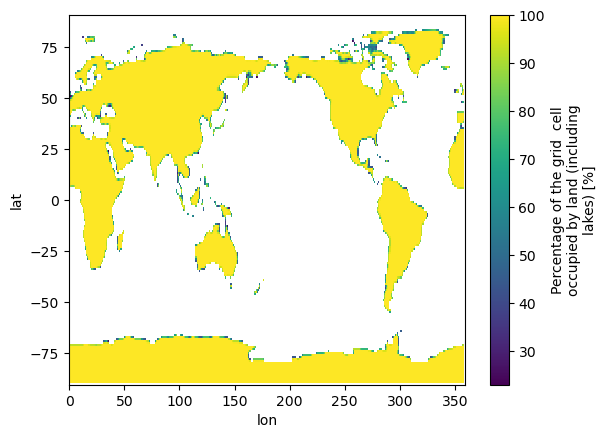

In [204]:
land_mask = querymask('MRI-ESM2-0').interp_like(ds_srh_hist.isel(model=0,time=0))
land_mask.sftlf.plot()

In [17]:
ds_prc_models_merged_hist = xr.open_dataset('CMIP6_NCDP/CP_monthly_global_historical.nc')
ds_prc_models_merged_future = xr.open_dataset('CMIP6_NCDP/CP_monthly_global_ssp585.nc')

In [18]:
ds_prc_models_merged_hist = ds_prc_models_merged_hist.transpose('time','model','lat','lon')
ds_prc_models_merged_future = ds_prc_models_merged_future.transpose('time','model','lat','lon')
# ds_prc_models_merged_hist

In [19]:
ds_convective_models_merged_hist = xr.open_dataset('CMIP6_NCDP/Convective_monthly_global_historical.nc')
ds_convective_models_merged_future = xr.open_dataset('CMIP6_NCDP/Convective_monthly_global_ssp585.nc')

In [20]:
ds_convective_models_merged_hist['srh_3km'] = xr.where(np.abs(ds_convective_models_merged_hist.srh_lm3km)>np.abs(ds_convective_models_merged_hist.srh_rm3km),
                                                       ds_convective_models_merged_hist.srh_lm3km,ds_convective_models_merged_hist.srh_rm3km)
# ds_convective_models_merged_hist

In [21]:
ds_convective_models_merged_future['srh_3km'] = xr.where(np.abs(ds_convective_models_merged_future.srh_lm3km)>np.abs(ds_convective_models_merged_future.srh_rm3km),
                                                       ds_convective_models_merged_future.srh_lm3km,ds_convective_models_merged_future.srh_rm3km)
# ds_convective_models_merged_future

In [22]:
ds_srh_hist = ds_convective_models_merged_hist.srh_3km
ds_srh_future = ds_convective_models_merged_future.srh_3km

In [23]:
ds_cp_hist = ds_prc_models_merged_hist.prc
ds_cp_future = ds_prc_models_merged_future.prc

In [24]:
ds_cp_hist

<xarray.DataArray 'prc' (time: 420, model: 7, lat: 181, lon: 360)>
[191570400 values with dtype=float32]
Coordinates:
  * time     (time) datetime64[ns] 1980-01-01 1980-02-01 ... 2014-12-01
  * lat      (lat) int64 -90 -89 -88 -87 -86 -85 -84 ... 84 85 86 87 88 89 90
  * lon      (lon) int64 0 1 2 3 4 5 6 7 8 ... 352 353 354 355 356 357 358 359
  * model    (model) object 'BCC-CSM2-MR' 'CanESM5' ... 'MRI-ESM2-0' 'MIROC6'

In [25]:
def ds_calc_TEI(CP_data, SRH_data):# Conditional variables ALL of them

    # print(CP_data, SRH_data)
    
    dx = np.mean(CP_data.lon.diff(dim='lon'))
    dy = np.mean(CP_data.lat.diff(dim='lat'))
    dt = 1
    dtDAY = 30
    weights = np.cos(np.deg2rad(CP_data.lat))

    # print(weights)

    offset = dx*dy*dtDAY*weights

    # print(offset)

    TEI = np.exp(-14+1.89*np.log(np.abs(SRH_data)) 
                              + 1.36*np.log(CP_data*86400))*offset
    
    # ds = ds.astype('float32')
    
    return(TEI)


In [26]:
ds_srh_hist.shape,ds_cp_hist.shape

((420, 7, 181, 360), (420, 7, 181, 360))

In [27]:
ds_srh_hist['time'] = ds_cp_hist.time.values
ds_srh_hist['model'] = ds_cp_hist.model.values

In [28]:
TEI_hist = ds_srh_hist.copy()

In [29]:
%%time
TEI_hist = ds_calc_TEI(ds_cp_hist, ds_srh_hist)

/Users/kelseymalloy/miniconda3/envs/cmip_env/lib/python3.9/site-packages/xarray/core/computation.py:761: RuntimeWarning: divide by zero encountered in log
  result_data = func(*input_data)
/Users/kelseymalloy/miniconda3/envs/cmip_env/lib/python3.9/site-packages/xarray/core/computation.py:761: RuntimeWarning: invalid value encountered in log
  result_data = func(*input_data)


CPU times: user 2.79 s, sys: 1.88 s, total: 4.67 s
Wall time: 5.3 s


In [38]:
ds_srh_future.shape,ds_cp_future.shape

((7, 1032, 181, 360), (1032, 7, 181, 360))

In [39]:
ds_srh_future['time'] = ds_cp_future.time.values
ds_srh_future['model'] = ds_cp_future.model.values

In [154]:
%%time
TEI_future = ds_calc_TEI(ds_cp_future, ds_srh_future)

/Users/kelseymalloy/miniconda3/envs/cmip_env/lib/python3.9/site-packages/xarray/core/computation.py:761: RuntimeWarning: divide by zero encountered in log
  result_data = func(*input_data)
/Users/kelseymalloy/miniconda3/envs/cmip_env/lib/python3.9/site-packages/xarray/core/computation.py:761: RuntimeWarning: invalid value encountered in log
  result_data = func(*input_data)


CPU times: user 6.71 s, sys: 6.8 s, total: 13.5 s
Wall time: 15.6 s


In [155]:
TEI_future

<xarray.DataArray (model: 7, time: 1032, lat: 181, lon: 360)>
array([[[[           nan,            nan,            nan, ...,
                     nan,            nan,            nan],
         [           nan,            nan,            nan, ...,
                     nan,            nan,            nan],
         [           nan,            nan,            nan, ...,
                     nan,            nan,            nan],
         ...,
         [           nan,            nan,            nan, ...,
                     nan,            nan,            nan],
         [           nan,            nan,            nan, ...,
                     nan,            nan,            nan],
         [           nan,            nan,            nan, ...,
                     nan,            nan,            nan]],

        [[           nan,            nan,            nan, ...,
                     nan,            nan,            nan],
         [           nan,            nan,            nan, ...,
                     nan,            nan,            nan],
         [           nan,            nan,            nan, ...,
                     nan,            nan,            nan],
...
         [1.00917536e-04, 1.02500682e-04, 1.02500682e-04, ...,
          9.72647670e-05, 9.98452286e-05, 9.98452286e-05],
         [8.78529132e-05, 8.91372375e-05, 8.91372375e-05, ...,
          8.50334617e-05, 8.69860596e-05, 8.69860596e-05],
         [4.45954999e-19, 4.45954999e-19, 4.45954999e-19, ...,
          4.45954999e-19, 4.45954999e-19, 4.45954999e-19]],

        [[1.07465788e-20, 1.07465788e-20, 1.07465788e-20, ...,
          1.07465788e-20, 1.07465788e-20, 1.07465788e-20],
         [2.96814700e-06, 3.01565979e-06, 3.01565979e-06, ...,
          2.92523737e-06, 2.92074379e-06, 2.92074379e-06],
         [1.26660159e-05, 1.28450397e-05, 1.28450397e-05, ...,
          1.21715218e-05, 1.23222267e-05, 1.23222267e-05],
         ...,
         [1.23430853e-05, 1.30532855e-05, 1.30532855e-05, ...,
          1.14150107e-05, 1.17748923e-05, 1.17748923e-05],
         [1.38929181e-05, 1.40649594e-05, 1.40649594e-05, ...,
          1.33592575e-05, 1.36641792e-05, 1.36641792e-05],
         [8.23298450e-20, 8.23298450e-20, 8.23298450e-20, ...,
          8.23298450e-20, 8.23298450e-20, 8.23298450e-20]]]])
Coordinates:
  * time     (time) datetime64[ns] 2015-01-01 2015-02-01 ... 2100-12-01
  * lat      (lat) int64 -90 -89 -88 -87 -86 -85 -84 ... 84 85 86 87 88 89 90
  * lon      (lon) int64 0 1 2 3 4 5 6 7 8 ... 352 353 354 355 356 357 358 359
  * model    (model) object 'BCC-CSM2-MR' 'CanESM5' ... 'MRI-ESM2-0' 'MIROC6'

In [68]:
TEI_all = xr.concat([TEI_hist,TEI_future],dim='time')
TEI_all.shape

<xarray.DataArray (time: 1452, model: 7, lat: 181, lon: 360)>
array([[[[           nan,            nan,            nan, ...,
                     nan,            nan,            nan],
         [           nan,            nan,            nan, ...,
                     nan,            nan,            nan],
         [           nan,            nan,            nan, ...,
                     nan,            nan,            nan],
         ...,
         [           nan,            nan,            nan, ...,
                     nan,            nan,            nan],
         [           nan,            nan,            nan, ...,
                     nan,            nan,            nan],
         [           nan,            nan,            nan, ...,
                     nan,            nan,            nan]],

        [[2.26439193e-21, 2.26439193e-21, 2.26439193e-21, ...,
          2.26439193e-21, 2.26439193e-21, 2.26439193e-21],
         [6.29179596e-07, 6.29179596e-07, 6.62596308e-07, ...,
          5.31612675e-07, 5.31612675e-07, 6.29179596e-07],
         [1.25816754e-06, 1.25816754e-06, 1.32499078e-06, ...,
          1.06306342e-06, 1.06306342e-06, 1.25816754e-06],
...
         [7.27456317e-05, 6.86722759e-05, 6.51685142e-05, ...,
          7.91785298e-05, 7.56518402e-05, 7.31169482e-05],
         [3.39468175e-05, 3.38166679e-05, 3.41331405e-05, ...,
          3.28310179e-05, 3.30369983e-05, 3.36324228e-05],
         [1.26493601e-19, 1.26493601e-19, 1.26493601e-19, ...,
          1.26493601e-19, 1.26493601e-19, 1.26493601e-19]],

        [[1.07465788e-20, 1.07465788e-20, 1.07465788e-20, ...,
          1.07465788e-20, 1.07465788e-20, 1.07465788e-20],
         [2.96814700e-06, 3.01565979e-06, 3.01565979e-06, ...,
          2.92523737e-06, 2.92074379e-06, 2.92074379e-06],
         [1.26660159e-05, 1.28450397e-05, 1.28450397e-05, ...,
          1.21715218e-05, 1.23222267e-05, 1.23222267e-05],
         ...,
         [1.23430853e-05, 1.30532855e-05, 1.30532855e-05, ...,
          1.14150107e-05, 1.17748923e-05, 1.17748923e-05],
         [1.38929181e-05, 1.40649594e-05, 1.40649594e-05, ...,
          1.33592575e-05, 1.36641792e-05, 1.36641792e-05],
         [8.23298450e-20, 8.23298450e-20, 8.23298450e-20, ...,
          8.23298450e-20, 8.23298450e-20, 8.23298450e-20]]]])
Coordinates:
  * lat      (lat) int64 -90 -89 -88 -87 -86 -85 -84 ... 84 85 86 87 88 89 90
  * lon      (lon) int64 0 1 2 3 4 5 6 7 8 ... 352 353 354 355 356 357 358 359
  * time     (time) datetime64[ns] 1980-01-01 1980-02-01 ... 2100-12-01
  * model    (model) object 'BCC-CSM2-MR' 'CanESM5' ... 'MRI-ESM2-0' 'MIROC6'

In [26]:
TEI_hist_baseline = TEI_hist.sel(time=TEI_hist['time.year']<2011).groupby('time.year').sum('time').mean('year')#.where(CONUS_mask>0)#.plot()

In [69]:
TEI_hist_baseline = TEI_all.sel(time=(TEI_all['time.year']>=2001)&(TEI_all['time.year']<=2020)).groupby('time.year').sum('time').mean('year')#.where(CONUS_mask>0)#.plot()

In [27]:
# TEI_hist_baseline.mean('model').plot()

In [156]:
TEI_future_2080 = TEI_future.sel(time=(TEI_future['time.year']>=2071)&(TEI_future['time.year']<=2090)).groupby('time.year').sum('time').mean('year')#.where(CONUS_mask>0)#.plot()

In [157]:
TEI_future_2050 = TEI_future.sel(time=(TEI_future['time.year']>=2041)&(TEI_future['time.year']<=2060)).groupby('time.year').sum('time').mean('year')#.where(CONUS_mask>0)#.plot()

In [158]:
TEI_future_2030 = TEI_future.sel(time=(TEI_future['time.year']>=2021)&(TEI_future['time.year']<=2040)).groupby('time.year').sum('time').mean('year')#.where(CONUS_mask>0)#.plot()

In [159]:
# TEI_future_2080.mean('model').plot()

In [160]:
dTEI_2080 = TEI_future_2080 - TEI_hist_baseline

In [161]:
dTEI_2050 = TEI_future_2050 - TEI_hist_baseline

In [162]:
dTEI_2030 = TEI_future_2030 - TEI_hist_baseline

In [163]:
count_2030=np.zeros((len(dTEI_2030.lat), len(dTEI_2030.lon)))
for im in range(0,7):
    count_2030+=((dTEI_2030.mean('model') * dTEI_2030[im]) > 0)*1

In [164]:
count_2050=np.zeros((len(dTEI_2050.lat), len(dTEI_2050.lon)))
for im in range(0,7):
    count_2050+=((dTEI_2050.mean('model') * dTEI_2050[im]) > 0)*1

In [165]:
count_2080=np.zeros((len(dTEI_2080.lat), len(dTEI_2080.lon)))
for im in range(0,7):
    count_2080+=((dTEI_2080.mean('model') * dTEI_2080[im]) > 0)*1

In [44]:
# dTEI_2080.mean('model').plot()

In [80]:
lons,lats = dTEI_2080.lon.values,dTEI_2080.lat.values

In [81]:
from MapDomains import Map_CONUS

In [214]:
from matplotlib.colors import BoundaryNorm
from matplotlib.ticker import MaxNLocator
import numpy.ma as ma

cmap = plt.get_cmap('afmhot_r')
levels = MaxNLocator(nbins=31).tick_values(0, 6)
# levels = MaxNLocator(nbins=41).tick_values(0, 8)
norm = BoundaryNorm(levels, ncolors=cmap.N, clip=True)

cmap2= plt.get_cmap('RdBu_r')
levels2 = MaxNLocator(nbins=41).tick_values(-2, 2)
# levels2 = MaxNLocator(nbins=31).tick_values(-3, 3)
norm2 = BoundaryNorm(levels2, ncolors=cmap.N, clip=True)

In [83]:
def add_sig_symbols(data,ax):
    for i in range(len(data.lat.values)):
        for j in range(len(data.lon.values)):
            if data[i,j] > 4:
                # print(j,i)
                # ax.plot(lons[j], lats[i], marker='\\', color='k',markersize=2,transform=PC)
                ax.add_patch(plt.Rectangle((lons[j]-0.5, lats[i]-0.5), 1, 1, hatch='///', facecolor='none', transform=PC))

In [167]:
year_out = ['2030','2050','2080']
TEI_future = [TEI_future_2030,TEI_future_2050,TEI_future_2080]
dTEI = [dTEI_2030,dTEI_2050,dTEI_2080]
count = [count_2030,count_2050,count_2080]

In [196]:
land_mask, lon_cyclic = add_cyclic_point(land_mask.sftlf, coord = TEI_CMIP.lon)

In [166]:
from cartopy.util import add_cyclic_point
# for idx in range(len(TEI_future)):
#     TEI_future[idx][:], lon_cyclic = add_cyclic_point(TEI_future[idx], coord=count_2030.lon)
#     dTEI[idx], lon_cyclic = add_cyclic_point(dTEI[idx], coord=count_2030.lon)
#     count[idx], lon_cyclic = add_cyclic_point(count[idx], coord=count_2030.lon)

In [181]:
import cartopy
def Map_globe(row,col,num,londata,latdata):
    extent = [-180, 180, -50, 50]
    central_lon,central_lat=0,0
    ax = plt.subplot(row,col,num,projection=ccrs.Robinson(central_lon))
    #ax = plt.subplot(row,col,num,projection=ccrs.PlateCarree(central_longitude=cen_lon))
    ax.coastlines('50m')
    # ax.add_feature(cartopy.feature.STATES,edgecolor='gray')
    ax.set_extent(extent)
    x,y=np.meshgrid(londata,latdata)

    return ax,x,y

2030
2050
2080


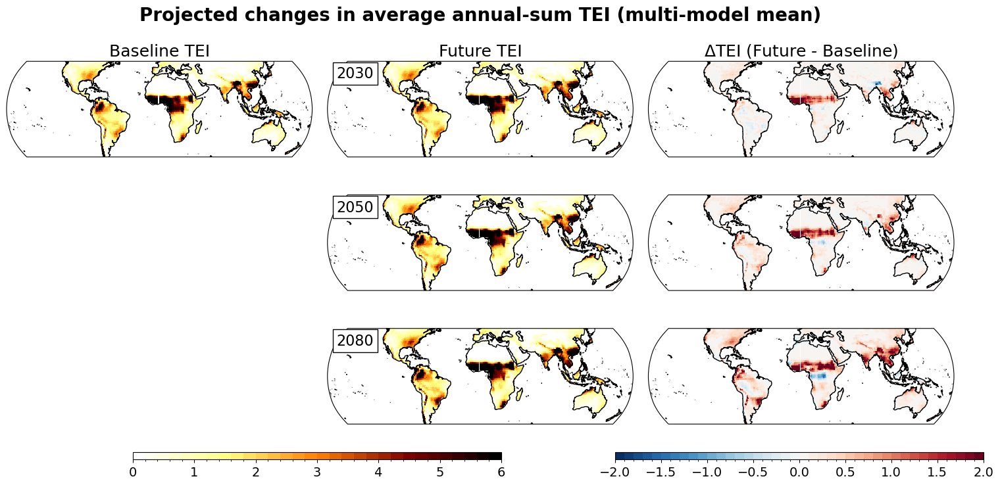

In [217]:
fig = plt.figure(figsize=(16,7.5))
st = fig.suptitle('Projected changes in average annual-sum TEI (multi-model mean)',weight='bold',fontsize=20)

for iy, year in enumerate(year_out):
    print(year)

    plot = TEI_future[iy].mean('model')#.where(land_mask.sftlf.values>0)
    plot,lon_cyclic = add_cyclic_point(plot, coord=count_2030.lon)
    plot_mask,lon_cyclic = add_cyclic_point(land_mask.sftlf.values, coord=count_2030.lon)
    plot = np.where(plot_mask>0, plot, np.nan)
    # plot,lon_cyclic = add_cyclic_point(plot, coord=lon_cyclic)

    ax1,x,y = Map_globe(3,3,iy*3+2,lon_cyclic,lats)
    c1 = ax1.pcolormesh(x,y,plot,cmap=cmap,norm=norm,transform=PC)
    # ax1.pcolormesh(x,y,TEI_future[iy].mean('model').where(land_mask.sftlf.values>0),cmap=cmap,norm=norm,transform=PC)
    ax1.text(
        x=0.03, y=0.95, 
        s=year, 
        transform=plt.gca().transAxes, 
        fontsize=16, 
        verticalalignment='top', 
        bbox=dict(facecolor='white', edgecolor='black')
    )

    plot = dTEI[iy].mean('model').where(land_mask.sftlf.values>0)
    plot,lon_cyclic = add_cyclic_point(plot, coord=count_2030.lon)
    plot_mask,lon_cyclic = add_cyclic_point(land_mask.sftlf.values, coord=count_2030.lon)
    plot = np.where(plot_mask>0, plot, np.nan)
    # plot,lon_cyclic = add_cyclic_point(plot, coord=lon_cyclic)
    
    ax10,x,y = Map_globe(3,3,iy*3+3,lon_cyclic,lats)
    c10 = ax10.pcolormesh(x,y,plot,cmap=cmap2,norm=norm2,transform=PC)
    # add_sig_symbols(count[iy].where(land_mask.sftlf.values>0), ax10)
    
    if iy==0:

        plot = TEI_hist_baseline.mean('model').where(land_mask.sftlf.values>0)
        plot,lon_cyclic = add_cyclic_point(plot, coord=count_2030.lon)
        plot_mask,lon_cyclic = add_cyclic_point(land_mask.sftlf.values, coord=count_2030.lon)
        plot = np.where(plot_mask>0, plot, np.nan)
        # plot,lon_cyclic = add_cyclic_point(plot, coord=lon_cyclic)
        
        ax,x,y = Map_globe(3,3,iy*3+1,lon_cyclic,lats)
        c = ax.pcolormesh(x,y,plot,cmap=cmap,norm=norm,transform=PC)
        ax.set_title('Baseline TEI', fontsize=18)
        ax1.set_title('Future TEI', fontsize=18)
        ax10.set_title('$\Delta$TEI (Future - Baseline)', fontsize=18)

cbaxes = plt.axes([0.17, .06, 0.35, 0.015])
cb = plt.colorbar(c, orientation='horizontal', cax = cbaxes, ticks=np.arange(0,12+1,1))
cb.ax.tick_params(labelsize=14)
cb.ax.set_xlabel('',fontsize=16)

cbaxes = plt.axes([1-0.022-0.35, .06, 0.35, 0.015])
cb = plt.colorbar(c10, orientation='horizontal', cax = cbaxes,ticks=np.arange(-12,12+.5,.5))
cb.ax.tick_params(labelsize=14)
cb.ax.set_xlabel('',fontsize=16)
    
fig.subplots_adjust(wspace=.05, hspace=.05,top=0.9,bottom=0.1, left=0.05,right=0.95)
fig.set_facecolor('white')

plt.savefig('Delta-TEI_annual-sum_2030-vs-2050-vs-2080_global.png')

2030
2050
2080


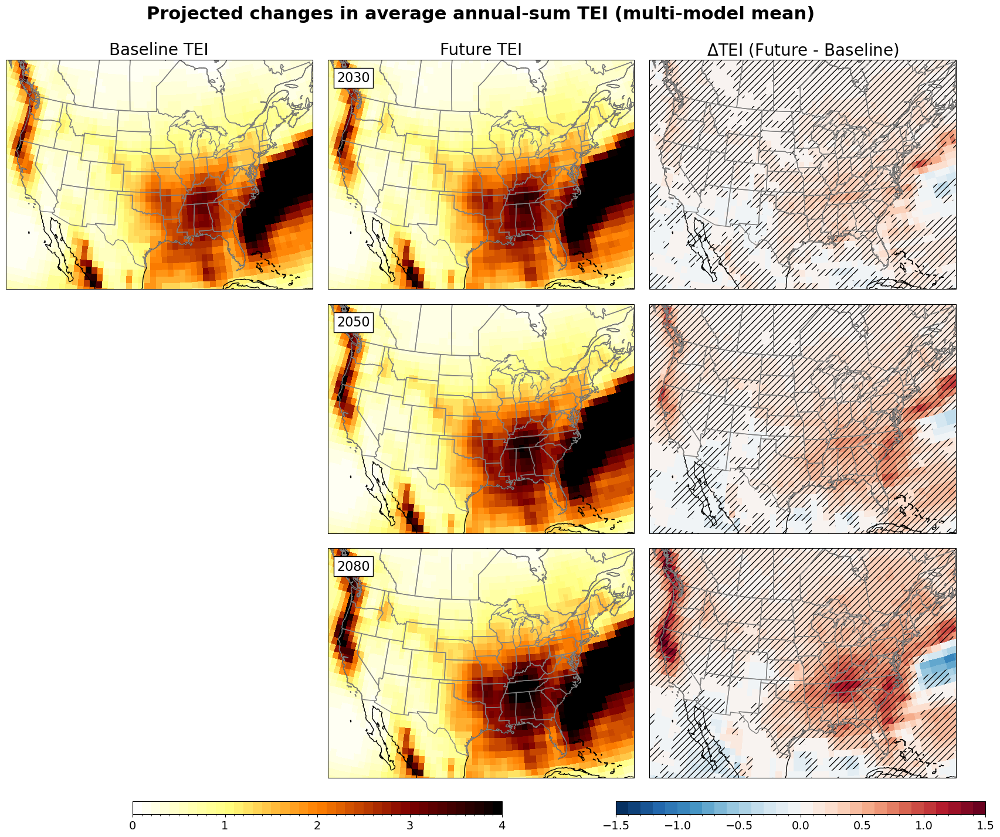

In [86]:
fig = plt.figure(figsize=(18,15))
st = fig.suptitle('Projected changes in average annual-sum TEI (multi-model mean)',weight='bold',fontsize=22)

for iy, year in enumerate(year_out):
    print(year)

    ax1,x,y = Map_CONUS(3,3,iy*3+2,lons,lats)
    c1 = ax1.pcolormesh(x,y,TEI_future[iy].mean('model'),cmap=cmap,norm=norm,transform=PC)
    ax1.pcolormesh(x,y,TEI_future[iy].mean('model'),cmap=cmap,norm=norm,transform=PC)
    ax1.text(
        x=0.03, y=0.95, 
        s=year, 
        transform=plt.gca().transAxes, 
        fontsize=16, 
        verticalalignment='top', 
        bbox=dict(facecolor='white', edgecolor='black')
    )
    
    ax10,x,y = Map_CONUS(3,3,iy*3+3,lons,lats)
    c10 = ax10.pcolormesh(x,y,dTEI[iy].mean('model'),cmap=cmap2,norm=norm2,transform=PC)
    add_sig_symbols(count[iy], ax10)
    
    if iy==0:
        ax,x,y = Map_CONUS(3,3,iy*3+1,lons,lats)
        c = ax.pcolormesh(x,y,TEI_hist_baseline.mean('model'),cmap=cmap,norm=norm,transform=PC)
        ax.set_title('Baseline TEI', fontsize=20)
        ax1.set_title('Future TEI', fontsize=20)
        ax10.set_title('$\Delta$TEI (Future - Baseline)', fontsize=20)

cbaxes = plt.axes([0.17, .06, 0.35, 0.015])
cb = plt.colorbar(c, orientation='horizontal', cax = cbaxes, ticks=np.arange(0,12+1,1))
cb.ax.tick_params(labelsize=14)
cb.ax.set_xlabel('',fontsize=16)

cbaxes = plt.axes([1-0.022-0.35, .06, 0.35, 0.015])
cb = plt.colorbar(c10, orientation='horizontal', cax = cbaxes,ticks=np.arange(-12,12+.5,.5))
cb.ax.tick_params(labelsize=14)
cb.ax.set_xlabel('',fontsize=16)
    
fig.subplots_adjust(wspace=.05, hspace=.05,top=0.92,bottom=0.1, left=0.05,right=0.95)
fig.set_facecolor('white')

# plt.savefig('Delta-TEI_annual-sum_2030-vs-2050-vs-2080.png')

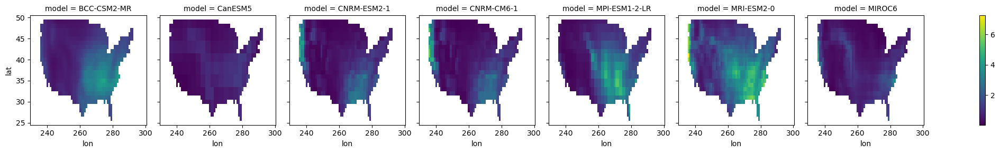

In [52]:
TEI_hist_baseline.plot(col='model')

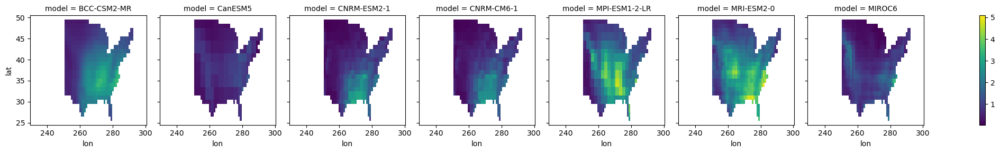

In [237]:
TEI_hist_baseline.where(TEI_hist_baseline.lon>250).plot(col='model')

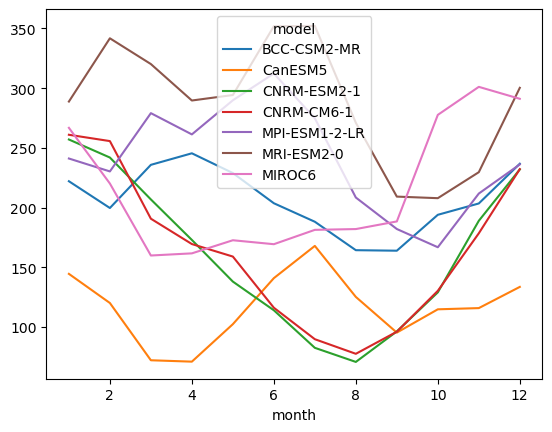

In [238]:
TEI_hist.where(TEI_hist_baseline.lon>250).stack(space=['lat','lon']).sum('space').groupby('time.month').mean('time').plot(hue='model')

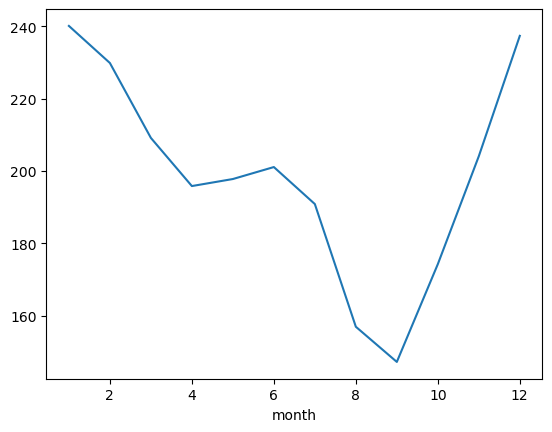

In [239]:
TEI_hist.where(TEI_hist_baseline.lon>250).stack(space=['lat','lon']).sum('space').groupby('time.month').mean('time').mean('model').plot()

##### netcdf creation

In [184]:
TEI_hist_baseline.shape,TEI_future_2030.shape,TEI_future_2050.shape,TEI_future_2080.shape

((7, 181, 360), (7, 181, 360), (7, 181, 360), (7, 181, 360))

In [185]:
TEI_CMIP = TEI_hist_baseline.copy()

In [186]:
TEI_CMIP.coords['period'] = 'historical'
TEI_CMIP=TEI_CMIP.expand_dims(axis=0, dim='period')

In [187]:
TEI_future_2030.coords['period'] = '2021-2040'
TEI_future_2050.coords['period'] = '2041-2060'
TEI_future_2080.coords['period'] = '2071-2090'


In [188]:
TEI_CMIP = xr.concat([TEI_CMIP,TEI_future_2030,TEI_future_2050,TEI_future_2080], dim='period')
TEI_CMIP

<xarray.DataArray (period: 4, model: 7, lat: 181, lon: 360)>
array([[[[3.65180719e-20, 3.65180719e-20, 3.65180719e-20, ...,
          3.65180719e-20, 3.65180719e-20, 3.65180719e-20],
         [3.04080819e-06, 2.96029652e-06, 2.97061868e-06, ...,
          2.69675149e-06, 3.17790667e-06, 3.07428429e-06],
         [5.42967615e-06, 5.05526459e-06, 4.94587405e-06, ...,
          5.49554456e-06, 5.43613929e-06, 5.47219208e-06],
         ...,
         [1.15468707e-04, 1.14019890e-04, 1.14346336e-04, ...,
          1.12467432e-04, 1.12195695e-04, 1.14744548e-04],
         [5.89759122e-05, 6.19132631e-05, 6.77842527e-05, ...,
          5.80135707e-05, 5.81125213e-05, 6.12885248e-05],
         [2.17224713e-19, 2.17224713e-19, 2.17224713e-19, ...,
          2.17224713e-19, 2.17224713e-19, 2.17224713e-19]],

        [[2.93134913e-21, 2.93134913e-21, 2.93134913e-21, ...,
          2.93134913e-21, 2.93134913e-21, 2.93134913e-21],
         [8.38016095e-07, 8.37311901e-07, 8.22671832e-07, ...,
          8.71625780e-07, 8.71271486e-07, 8.38546397e-07],
         [1.66226326e-06, 1.66041954e-06, 1.63090509e-06, ...,
          1.72684082e-06, 1.72457670e-06, 1.66394478e-06],
...
         [4.76893063e-04, 4.79435316e-04, 4.82457023e-04, ...,
          4.61730119e-04, 4.66078615e-04, 4.70904746e-04],
         [2.15818733e-04, 2.16179154e-04, 2.15816475e-04, ...,
          2.13722418e-04, 2.14016961e-04, 2.14899373e-04],
         [7.15776551e-19, 7.15776551e-19, 7.15776551e-19, ...,
          7.15776551e-19, 7.15776551e-19, 7.15776551e-19]],

        [[4.58154365e-20, 4.58154365e-20, 4.58154365e-20, ...,
          4.58154365e-20, 4.58154365e-20, 4.58154365e-20],
         [1.29635965e-05, 1.30320248e-05, 1.30320248e-05, ...,
          1.28254364e-05, 1.28820464e-05, 1.28820464e-05],
         [4.43293901e-05, 4.44544965e-05, 4.44544965e-05, ...,
          4.39403665e-05, 4.41660171e-05, 4.41660171e-05],
         ...,
         [6.71149281e-05, 6.76779456e-05, 6.76779456e-05, ...,
          6.66942765e-05, 6.67470366e-05, 6.67470366e-05],
         [3.79638466e-05, 3.82117097e-05, 3.82117097e-05, ...,
          3.73205121e-05, 3.76382998e-05, 3.76382998e-05],
         [1.93628131e-19, 1.93628131e-19, 1.93628131e-19, ...,
          1.93628131e-19, 1.93628131e-19, 1.93628131e-19]]]])
Coordinates:
  * lat      (lat) int64 -90 -89 -88 -87 -86 -85 -84 ... 84 85 86 87 88 89 90
  * lon      (lon) int64 0 1 2 3 4 5 6 7 8 ... 352 353 354 355 356 357 358 359
  * model    (model) object 'BCC-CSM2-MR' 'CanESM5' ... 'MRI-ESM2-0' 'MIROC6'
  * period   (period) <U10 'historical' '2021-2040' '2041-2060' '2071-2090'

In [209]:
TEI_CMIP = TEI_CMIP.where(land_mask.sftlf.values>0)#.sel(period='2071-2090').plot(col='model',col_wrap=3)

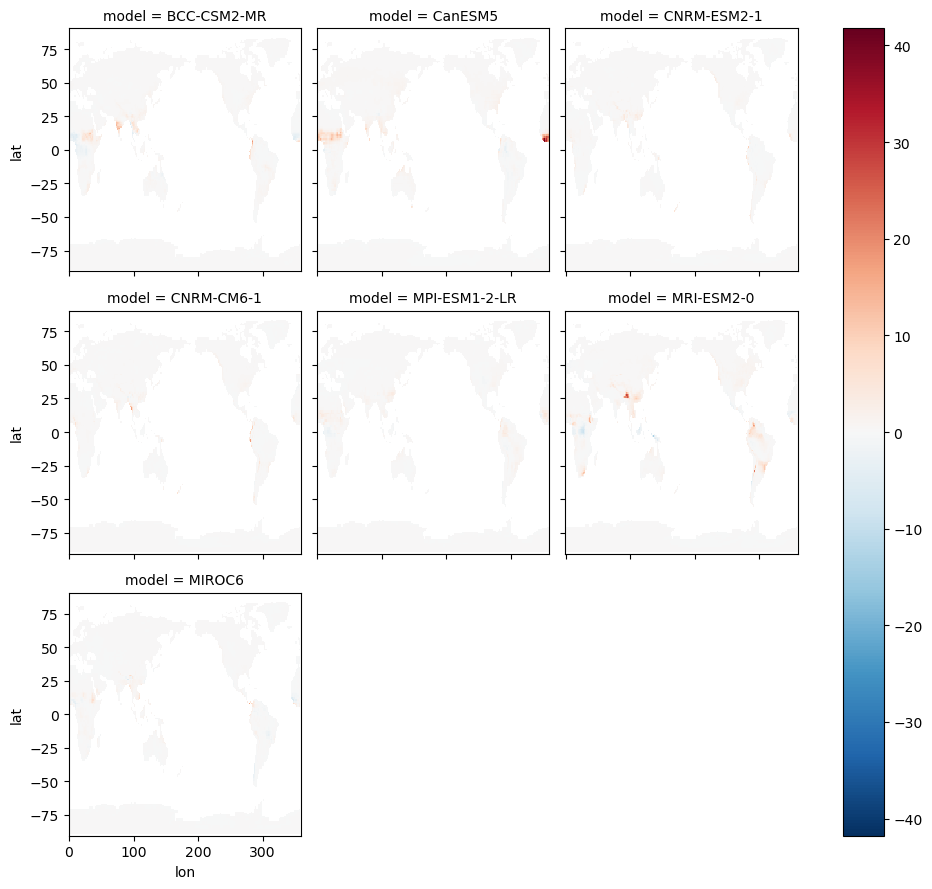

In [210]:
(TEI_CMIP.sel(period='2071-2090') - TEI_CMIP.sel(period='historical')).plot(col='model',col_wrap=3)

In [211]:
TEI_CMIP.to_netcdf('TEI_climatological-annual-sum_CMIP6_global.nc')

In [84]:
cp_hist_baseline = (ds_cp_hist*86400).sel(time=ds_cp_hist['time.year']<2011).groupby('time.year').mean('time').mean('year').where(CONUS_mask>0)#.plot()

In [58]:
srh_hist_baseline = ds_srh_hist.sel(time=ds_srh_hist['time.year']<2011).groupby('time.year').mean('time').mean('year').where(CONUS_mask>0)#.plot()

In [85]:
cp_future_2080 = (ds_cp_future*86400).sel(time=(ds_cp_future['time.year']>=2075)&(ds_cp_future['time.year']<2085)).groupby('time.year').mean('time').mean('year').where(CONUS_mask>0)#.plot()
srh_future_2080 = ds_srh_future.sel(time=(ds_srh_future['time.year']>=2075)&(ds_srh_future['time.year']<2085)).groupby('time.year').mean('time').mean('year').where(CONUS_mask>0)

In [86]:
cp_future_2050 = (ds_cp_future*86400).sel(time=(ds_cp_future['time.year']>=2045)&(ds_cp_future['time.year']<2055)).groupby('time.year').mean('time').mean('year').where(CONUS_mask>0)#.plot()
srh_future_2050 = ds_srh_future.sel(time=(ds_srh_future['time.year']>=2045)&(ds_srh_future['time.year']<2055)).groupby('time.year').mean('time').mean('year').where(CONUS_mask>0)

In [87]:
cp_future_2030 = (ds_cp_future*86400).sel(time=(ds_cp_future['time.year']>=2025)&(ds_cp_future['time.year']<2035)).groupby('time.year').mean('time').mean('year').where(CONUS_mask>0)#.plot()
srh_future_2030 = ds_srh_future.sel(time=(ds_srh_future['time.year']>=2025)&(ds_srh_future['time.year']<2035)).groupby('time.year').mean('time').mean('year').where(CONUS_mask>0)

In [88]:
dcp_2080 = cp_future_2080 - cp_hist_baseline
dsrh_2080 = srh_future_2080 - srh_hist_baseline

In [89]:
dcp_2050 = cp_future_2050 - cp_hist_baseline
dsrh_2050 = srh_future_2050 - srh_hist_baseline

In [90]:
dcp_2030 = cp_future_2030 - cp_hist_baseline
dsrh_2030 = srh_future_2030 - srh_hist_baseline

In [206]:
# dsrh_2080.mean('model').plot()

In [207]:
cp_count_2030=np.zeros((len(dcp_2030.lat), len(dcp_2030.lon)))
for im in range(0,7):
    cp_count_2030+=((dcp_2030.mean('model') * dcp_2030[im]) > 0)*1

In [209]:
cp_count_2050=np.zeros((len(dcp_2050.lat), len(dcp_2050.lon)))
for im in range(0,7):
    cp_count_2050+=((dcp_2050.mean('model') * dcp_2050[im]) > 0)*1

In [210]:
cp_count_2080=np.zeros((len(dcp_2080.lat), len(dcp_2080.lon)))
for im in range(0,7):
    cp_count_2080+=((dcp_2080.mean('model') * dcp_2080[im]) > 0)*1

In [208]:
srh_count_2030=np.zeros((len(dsrh_2030.lat), len(dsrh_2030.lon)))
for im in range(0,7):
    srh_count_2030+=((dsrh_2030.mean('model') * dsrh_2030[im]) > 0)*1

In [211]:
srh_count_2050=np.zeros((len(dsrh_2050.lat), len(dsrh_2050.lon)))
for im in range(0,7):
    srh_count_2050+=((dsrh_2050.mean('model') * dsrh_2050[im]) > 0)*1

In [212]:
srh_count_2080=np.zeros((len(dsrh_2080.lat), len(dsrh_2080.lon)))
for im in range(0,7):
    srh_count_2080+=((dsrh_2080.mean('model') * dsrh_2080[im]) > 0)*1

In [41]:
# dTEI_2080.mean('model').plot()

In [68]:
lons,lats = dcp_2080.lon.values,dcp_2080.lat.values

In [69]:
from MapDomains import Map_CONUS

In [215]:
from matplotlib.colors import BoundaryNorm
from matplotlib.ticker import MaxNLocator
import numpy.ma as ma

cmap = plt.get_cmap('GnBu')
levels = MaxNLocator(nbins=41).tick_values(0, 2.4)
norm = BoundaryNorm(levels, ncolors=cmap.N, clip=True)

cmap2= plt.get_cmap('RdBu_r')
levels2 = MaxNLocator(nbins=41).tick_values(-0.5, 0.5)
norm2 = BoundaryNorm(levels2, ncolors=cmap.N, clip=True)

In [216]:
year_out = ['2030','2050','2080']
cp_future = [cp_future_2030,cp_future_2050,cp_future_2080]
dcp = [dcp_2030,dcp_2050,dcp_2080]
cp_count = [cp_count_2030,cp_count_2050,cp_count_2080]

2030
2050
2080


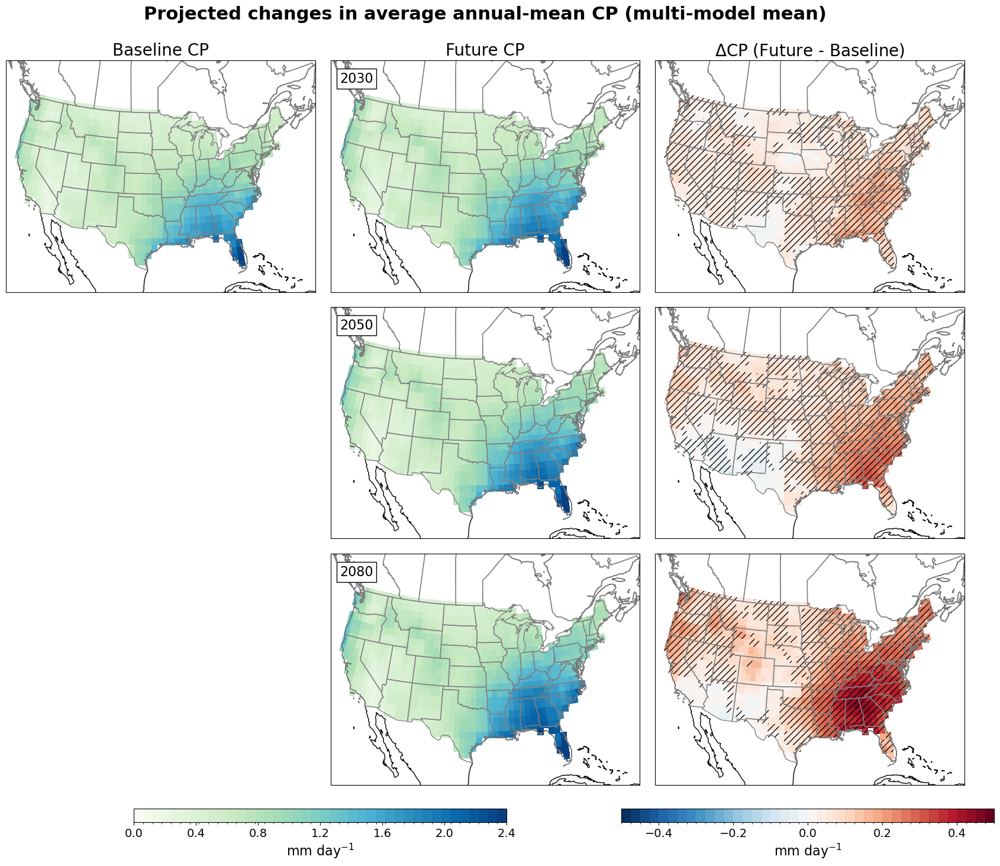

In [217]:
fig = plt.figure(figsize=(18,15))
st = fig.suptitle('Projected changes in average annual-mean CP (multi-model mean)',weight='bold',fontsize=22)

for iy, year in enumerate(year_out):
    print(year)

    ax1,x,y = Map_CONUS(3,3,iy*3+2,lons,lats)
    c1 = ax1.pcolormesh(x,y,cp_future[iy].mean('model') ,cmap=cmap,norm=norm,transform=PC)
    ax1.pcolormesh(x,y,cp_future[iy].mean('model') ,cmap=cmap,norm=norm,transform=PC)
    ax1.text(
        x=0.03, y=0.95, 
        s=year, 
        transform=plt.gca().transAxes, 
        fontsize=16, 
        verticalalignment='top', 
        bbox=dict(facecolor='white', edgecolor='black')
    )
    
    ax10,x,y = Map_CONUS(3,3,iy*3+3,lons,lats)
    c10 = ax10.pcolormesh(x,y,dcp[iy].mean('model'),cmap=cmap2,norm=norm2,transform=PC)
    add_sig_symbols(cp_count[iy], ax10)

    if iy==0:
        ax,x,y = Map_CONUS(3,3,iy*3+1,lons,lats)
        c = ax.pcolormesh(x,y,cp_hist_baseline.mean('model'),cmap=cmap,norm=norm,transform=PC)
        ax.set_title('Baseline CP', fontsize=20)
        ax1.set_title('Future CP', fontsize=20)
        ax10.set_title('$\Delta$CP (Future - Baseline)', fontsize=20)

cbaxes = plt.axes([0.17, .06, 0.35, 0.015])
cb = plt.colorbar(c, orientation='horizontal', cax = cbaxes, ticks=np.arange(0,4+.4,.4))
cb.ax.tick_params(labelsize=14)
cb.ax.set_xlabel('mm day$^{-1}$',fontsize=16)

cbaxes = plt.axes([1-0.022-0.35, .06, 0.35, 0.015])
cb = plt.colorbar(c10, orientation='horizontal', cax = cbaxes,ticks=np.arange(-4,4+.2,.2))
cb.ax.tick_params(labelsize=14)
cb.ax.set_xlabel('mm day$^{-1}$',fontsize=16)
    
fig.subplots_adjust(wspace=.05, hspace=.05,top=0.92,bottom=0.1, left=0.05,right=0.95)
fig.set_facecolor('white')

plt.savefig('Delta-CP_annual-mean_2030-vs-2050-vs-2080.png')

In [218]:
from matplotlib.colors import BoundaryNorm
from matplotlib.ticker import MaxNLocator
import numpy.ma as ma

cmap = plt.get_cmap('magma_r')
levels = MaxNLocator(nbins=41).tick_values(0, 140)
norm = BoundaryNorm(levels, ncolors=cmap.N, clip=True)

cmap2= plt.get_cmap('RdBu_r')
levels2 = MaxNLocator(nbins=41).tick_values(-8, 8)
norm2 = BoundaryNorm(levels2, ncolors=cmap.N, clip=True)

In [219]:
# year_out = ['2030','2050','2080']
srh_future = [srh_future_2030,srh_future_2050,srh_future_2080]
dsrh = [dsrh_2030,dsrh_2050,dsrh_2080]
srh_count = [srh_count_2030,srh_count_2050,srh_count_2080]

2030
2050
2080


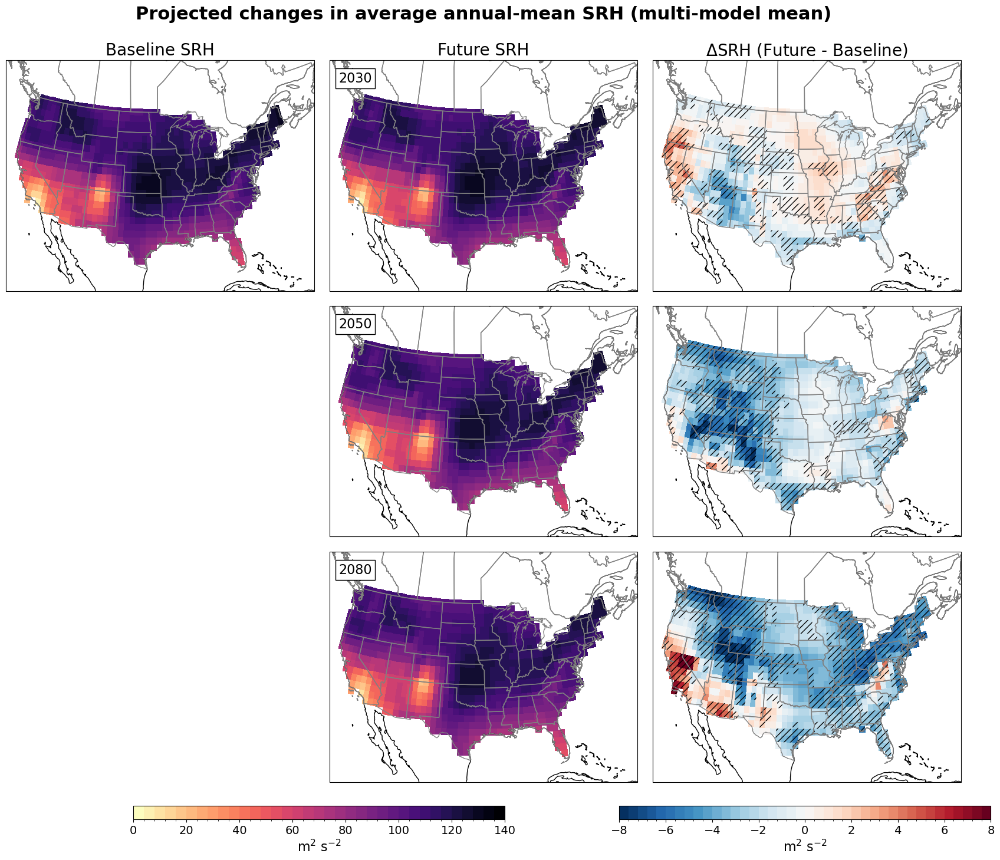

In [220]:
fig = plt.figure(figsize=(18,15))
st = fig.suptitle('Projected changes in average annual-mean SRH (multi-model mean)',weight='bold',fontsize=22)

for iy, year in enumerate(year_out):
    print(year)

    ax1,x,y = Map_CONUS(3,3,iy*3+2,lons,lats)
    c1 = ax1.pcolormesh(x,y,srh_future[iy].mean('model') ,cmap=cmap,norm=norm,transform=PC)
    ax1.pcolormesh(x,y,srh_future[iy].mean('model') ,cmap=cmap,norm=norm,transform=PC)
    ax1.text(
        x=0.03, y=0.95, 
        s=year, 
        transform=plt.gca().transAxes, 
        fontsize=16, 
        verticalalignment='top', 
        bbox=dict(facecolor='white', edgecolor='black')
    )
    
    ax10,x,y = Map_CONUS(3,3,iy*3+3,lons,lats)
    c10 = ax10.pcolormesh(x,y,dsrh[iy].mean('model'),cmap=cmap2,norm=norm2,transform=PC)
    add_sig_symbols(srh_count[iy], ax10)

    
    if iy==0:
        ax,x,y = Map_CONUS(3,3,iy*3+1,lons,lats)
        c = ax.pcolormesh(x,y,srh_hist_baseline.mean('model'),cmap=cmap,norm=norm,transform=PC)
        ax.set_title('Baseline SRH', fontsize=20)
        ax1.set_title('Future SRH', fontsize=20)
        ax10.set_title('$\Delta$SRH (Future - Baseline)', fontsize=20)

cbaxes = plt.axes([0.17, .06, 0.35, 0.015])
cb = plt.colorbar(c, orientation='horizontal', cax = cbaxes, ticks=np.arange(0,200+20,20))
cb.ax.tick_params(labelsize=14)
cb.ax.set_xlabel('m$^{2}$ s$^{-2}$',fontsize=16)

cbaxes = plt.axes([1-0.022-0.35, .06, 0.35, 0.015])
cb = plt.colorbar(c10, orientation='horizontal', cax = cbaxes,ticks=np.arange(-20,20+2,2))
cb.ax.tick_params(labelsize=14)
cb.ax.set_xlabel('m$^{2}$ s$^{-2}$',fontsize=16)
    
fig.subplots_adjust(wspace=.05, hspace=.05,top=0.92,bottom=0.1, left=0.05,right=0.95)
fig.set_facecolor('white')

plt.savefig('Delta-SRH_annual-mean_2030-vs-2050-vs-2080.png')

## creating a modified TEI and finding deltas

### load narr data

In [18]:
cape = xr.open_mfdataset('/crunch/c0/NARR/3_hr_land_1x1/cape/*.nc',combine='by_coords').cape.sel(lat=slice(*[25,50]),lon=slice(*[-130,-60])).values
cape.shape

(131488, 26, 71)

In [19]:
cin = xr.open_mfdataset('/crunch/c0/NARR/3_hr_land_1x1/cin/*.nc',combine='by_coords').cin.sel(lat=slice(*[25,50]),lon=slice(*[-130,-60])).values
cin.shape

(131488, 26, 71)

In [20]:
cprcp = xr.open_mfdataset('/crunch/c0/NARR/3_hr_land_1x1/acpcp/*.nc',combine='by_coords').acpcp.sel(lat=slice(*[25,50]),lon=slice(*[-130,-60])).values
cprcp.shape

(131488, 26, 71)

In [21]:
srh = xr.open_mfdataset('/crunch/c0/NARR/3_hr_land_1x1/hlcy/*.nc',combine='by_coords').hlcy.sel(lat=slice(*[25,50]),lon=slice(*[-130,-60])).values
srh.shape

(131488, 26, 71)

In [22]:
times = xr.open_mfdataset('/crunch/c0/NARR/3_hr_land_1x1/air.2m/*.nc').time.values
lat = xr.open_dataset('/crunch/c0/NARR/3_hr_land_1x1/air.2m/air.2m.1979.nc').lat.sel(lat=slice(*[25,50])).values
lon = xr.open_dataset('/crunch/c0/NARR/3_hr_land_1x1/air.2m/air.2m.1979.nc').lon.sel(lon=slice(*[-130,-60])).values
times.shape,lat.shape,lon.shape

((131488,), (26,), (71,))

In [23]:
ds_narr = xr.Dataset(
    # dictionary for data vars
    {'CAPE': (['time','lat', 'lon'], cape),
     'CIN': (['time','lat', 'lon'], cin),
     'SRH': (['time','lat', 'lon'], srh),
     'cPrcp': (['time','lat', 'lon'], cprcp),
    },
    coords = {
        'time':(['time'],times),
        'lat': (['lat',], lat),
        'lon': (['lon',], lon)
    }
)
ds_narr

<xarray.Dataset>
Dimensions:  (time: 131488, lat: 26, lon: 71)
Coordinates:
  * time     (time) datetime64[ns] 1979-01-01 ... 2023-12-31T21:00:00
  * lat      (lat) float64 25.0 26.0 27.0 28.0 29.0 ... 46.0 47.0 48.0 49.0 50.0
  * lon      (lon) float64 -130.0 -129.0 -128.0 -127.0 ... -62.0 -61.0 -60.0
Data variables:
    CAPE     (time, lat, lon) float32 nan nan nan nan nan ... nan nan nan nan
    CIN      (time, lat, lon) float32 nan nan nan nan nan ... nan nan nan nan
    SRH      (time, lat, lon) float32 nan nan nan nan nan ... nan nan nan nan
    cPrcp    (time, lat, lon) float32 nan nan nan nan nan ... nan nan nan nan

In [24]:
ds_narr_historical = ds_narr.sel(time=(ds_narr['time.year']>1979)&(ds_narr['time.year']<2015)) # have to keep time period same as cmip historical
ds_narr_historical

<xarray.Dataset>
Dimensions:  (time: 102272, lat: 26, lon: 71)
Coordinates:
  * time     (time) datetime64[ns] 1980-01-01 ... 2014-12-31T21:00:00
  * lat      (lat) float64 25.0 26.0 27.0 28.0 29.0 ... 46.0 47.0 48.0 49.0 50.0
  * lon      (lon) float64 -130.0 -129.0 -128.0 -127.0 ... -62.0 -61.0 -60.0
Data variables:
    CAPE     (time, lat, lon) float32 nan nan nan nan nan ... nan nan nan nan
    CIN      (time, lat, lon) float32 nan nan nan nan nan ... nan nan nan nan
    SRH      (time, lat, lon) float32 nan nan nan nan nan ... nan nan nan nan
    cPrcp    (time, lat, lon) float32 nan nan nan nan nan ... nan nan nan nan

In [25]:
CAPE_monthly_narr = ds_narr_historical.CAPE.resample(time='M').mean('time') # avg over month
CIN_monthly_narr = -1 * ds_narr_historical.CIN.resample(time='M').mean('time') # avg over month; to keep consistent with cmip, make CIN positive
SRH_monthly_narr = ds_narr_historical.SRH.resample(time='M').mean('time') # avg over month
CP_daily_narr = ds_narr_historical.cPrcp.resample(time='D').sum('time') # sum over day...
CP_monthly_narr = CP_daily_narr.resample(time='M').mean('time') # ...then avg over month
CAPE_monthly_narr.shape,CP_monthly_narr.shape

((420, 26, 71), (420, 26, 71))

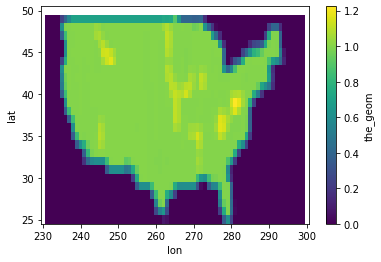

In [26]:
CONUS_mask.plot()

### load cmip historical data

In [27]:
ds_prc_models_hist = xr.open_dataset('/local/BLOB/cmip/CP_monthly_NAmerica_historical.nc')
ds_prc_models_hist = ds_prc_models_hist.transpose('time','model','lat','lon')
ds_prc_models_hist = ds_prc_models_hist.assign_coords(model=ds_prc_models_hist['model'].where(ds_prc_models_hist['model'] != 'MRI-ESM2-0', 'MPI-ESM2-0')) # fixing my mistake of labeling this data 
ds_convective_models_hist = xr.open_dataset('/local/BLOB/cmip/Convective_monthly_NAmerica_historical.nc')
ds_shear_models_hist = xr.open_dataset('/local/BLOB/cmip/Shear_monthly_NAmerica_historical.nc')
ds_prc_models_hist, ds_convective_models_hist, ds_shear_models_hist

(<xarray.Dataset>
 Dimensions:  (time: 420, model: 7, lat: 26, lon: 71)
 Coordinates:
   * time     (time) datetime64[ns] 1980-01-01 1980-02-01 ... 2014-12-01
   * lon      (lon) int32 230 231 232 233 234 235 236 ... 295 296 297 298 299 300
   * lat      (lat) int32 25 26 27 28 29 30 31 32 33 ... 43 44 45 46 47 48 49 50
   * model    (model) object 'BCC-CSM2-MR' 'CanESM5' ... 'MPI-ESM2-0' 'MIROC6'
 Data variables:
     prc      (time, model, lat, lon) float32 ...
 Attributes:
     regrid_method:  nearest_s2d,
 <xarray.Dataset>
 Dimensions:     (time: 420, model: 7, lat: 26, lon: 71)
 Coordinates:
   * time        (time) object 1980-01-01 00:00:00 ... 2014-12-01 00:00:00
   * lon         (lon) int32 230 231 232 233 234 235 ... 295 296 297 298 299 300
   * lat         (lat) int32 25 26 27 28 29 30 31 32 ... 43 44 45 46 47 48 49 50
   * model       (model) object 'BCC-CSM2-MR' 'CanESM5' ... 'MIROC6' 'MPI-ESM2-0'
 Data variables:
     cape_ml500  (time, model, lat, lon) float32 ...
     ca

In [28]:
CAPE_monthly_cmip = ds_convective_models_hist.cape_ml500
CIN_monthly_cmip = ds_convective_models_hist.cin_ml500
SRH_monthly_cmip_lm = ds_convective_models_hist.srh_lm3km
SRH_monthly_cmip_rm = ds_convective_models_hist.srh_rm3km
SRH_monthly_cmip = xr.where(np.abs(SRH_monthly_cmip_lm) > np.abs(SRH_monthly_cmip_rm), SRH_monthly_cmip_lm, SRH_monthly_cmip_rm) # srh definition as Lepore et al 2021
CP_monthly_cmip = ds_prc_models_hist.prc
S06_monthly_cmip = ds_shear_models_hist.S06
CP_monthly_cmip.shape,CIN_monthly_cmip.shape,CAPE_monthly_cmip.shape,SRH_monthly_cmip.shape

((420, 7, 26, 71), (420, 7, 26, 71), (420, 7, 26, 71), (420, 7, 26, 71))

### load tornado count data

#### this pkl file was created from another script that takes SPC reports, subsets, and aggegrates to 6hr res

In [46]:
torData = pd.read_pickle('saved_arrays/torData_environment_6h_1979-2023.pkl') 
torData_historical = torData[(torData.index.year>1979)&(torData.index.year<2015)] 
torData.shape,torData_historical.shape

((22147, 18), (16643, 18))

In [47]:
# make an array same size as narr data that counts where tornadoes occurred
tornadoes_narr = ds_narr_historical.CAPE.copy()
tornadoes_narr[:,:,:] = 0
for report in range(len(torData_historical.values)):
    report_time,report_lat,report_lon=torData_historical.index.values[report],torData_historical.lat.values[report],torData_historical.lon.values[report]
    tornadoes_narr.loc[report_time,report_lat,report_lon] += 1

In [39]:
CONUS_mask['lon'] = CONUS_mask['lon'] + 360
CONUS_mask

<xarray.DataArray 'the_geom' (lat: 26, lon: 71)>
array([[nan,  0.,  0., ...,  0.,  0., nan],
       [nan,  0.,  0., ...,  0.,  0., nan],
       [nan,  0.,  0., ...,  0.,  0., nan],
       ...,
       [nan,  0.,  0., ...,  0.,  0., nan],
       [nan,  0.,  0., ...,  0.,  0., nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Coordinates:
  * lon      (lon) int64 -130 -129 -128 -127 -126 -125 ... -64 -63 -62 -61 -60
  * lat      (lat) int64 25 26 27 28 29 30 31 32 33 ... 43 44 45 46 47 48 49 50

In [33]:
# making a diff mask that accounts for diff lon values, 0 to 360 vs. -180 to 180
CONUS_mask2 = CONUS_mask.copy()
CONUS_mask2['lon'] = CONUS_mask2['lon'] - 360
CONUS_mask2

<xarray.DataArray 'the_geom' (lat: 26, lon: 71)>
array([[nan,  0.,  0., ...,  0.,  0., nan],
       [nan,  0.,  0., ...,  0.,  0., nan],
       [nan,  0.,  0., ...,  0.,  0., nan],
       ...,
       [nan,  0.,  0., ...,  0.,  0., nan],
       [nan,  0.,  0., ...,  0.,  0., nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Coordinates:
  * lon      (lon) int64 230 231 232 233 234 235 236 ... 295 296 297 298 299 300
  * lat      (lat) int64 25 26 27 28 29 30 31 32 33 ... 43 44 45 46 47 48 49 50

In [48]:
tornadoes_daily_narr = tornadoes_narr.resample(time='MS').sum('time',skipna=False).where(CONUS_mask>0)
tornadoes_daily_narr.shape

(420, 26, 71)

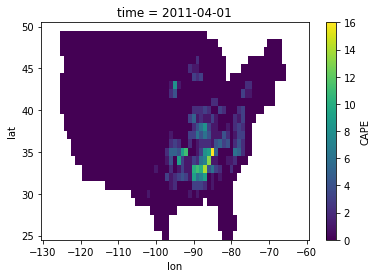

In [49]:
tornadoes_daily_narr.sel(time='2011-04-01').plot()

#### annual-sum mean

In [835]:
from matplotlib.colors import BoundaryNorm
from matplotlib.ticker import MaxNLocator
import numpy.ma as ma

cmap = plt.get_cmap('afmhot_r')
# levels = MaxNLocator(nbins=31).tick_values(0, 2)
levels = MaxNLocator(nbins=31).tick_values(0, 3)
norm = BoundaryNorm(levels, ncolors=cmap.N, clip=True)

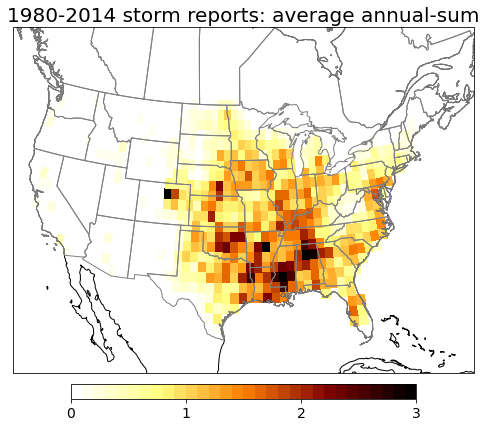

In [843]:
fig = plt.figure(figsize=(8,6))
# st = fig.suptitle('Reports average annual-sum',weight='bold',fontsize=22)

ax,x,y = Map_CONUS(1,1,1,lons,lats)
c = ax.pcolormesh(x,y,tornado_total_ds.tornado_obs.groupby('time.year').sum('time',skipna=False).mean('year'),cmap=cmap,norm=norm,transform=PC)
ax.set_title('1980-2014 storm reports: average annual-sum', fontsize=20)

cbaxes = plt.axes([0.2, .06, 0.6, 0.035])
cb = plt.colorbar(c, orientation='horizontal', cax = cbaxes, ticks=np.arange(0,12+1,1))
cb.ax.tick_params(labelsize=14)
cb.ax.set_xlabel('',fontsize=16)
    
fig.subplots_adjust(wspace=.05, hspace=.05,top=0.92,bottom=0.12, left=0.05,right=0.95)
fig.set_facecolor('white')

# plt.savefig('')

### seasonal cycle check for environments

#### cape

In [27]:
vmin=100;vmax=1200

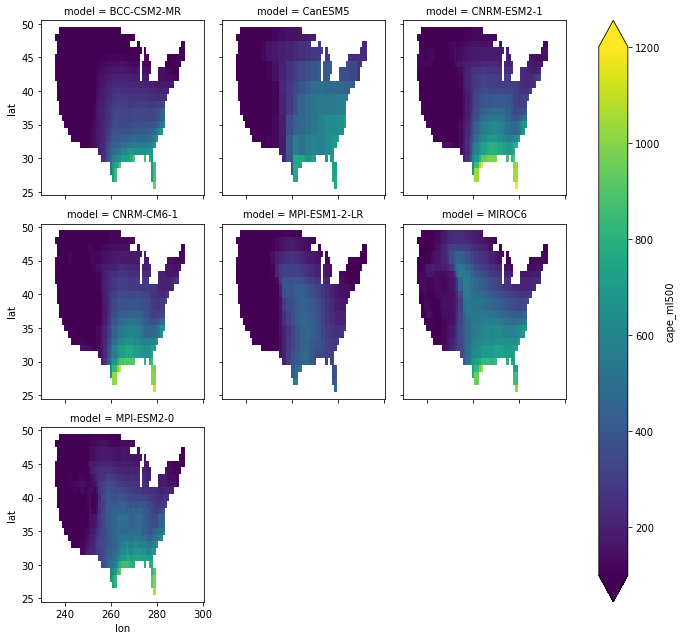

In [28]:
CAPE_monthly_cmip.mean('time').where(CONUS_mask>0).plot(col='model',col_wrap=3,vmin=vmin,vmax=vmax)

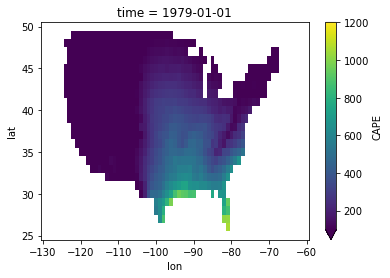

In [29]:
CAPE_monthly_narr.mean('time').where(CONUS_mask2>0).plot(vmin=vmin,vmax=vmax)

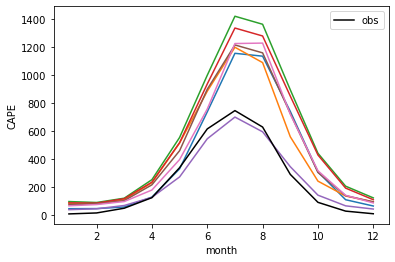

In [36]:
CAPE_monthly_cmip.where(lon>=-105).stack(space=['lat','lon']).mean('space').groupby('time.month').mean('time').plot(hue='model')
CAPE_monthly_narr.where(lon>=-105).stack(space=['lat','lon']).mean('space').groupby('time.month').mean('time').plot(color='k',label='obs')
plt.legend()

#### cp

In [37]:
vmin=0;vmax=4

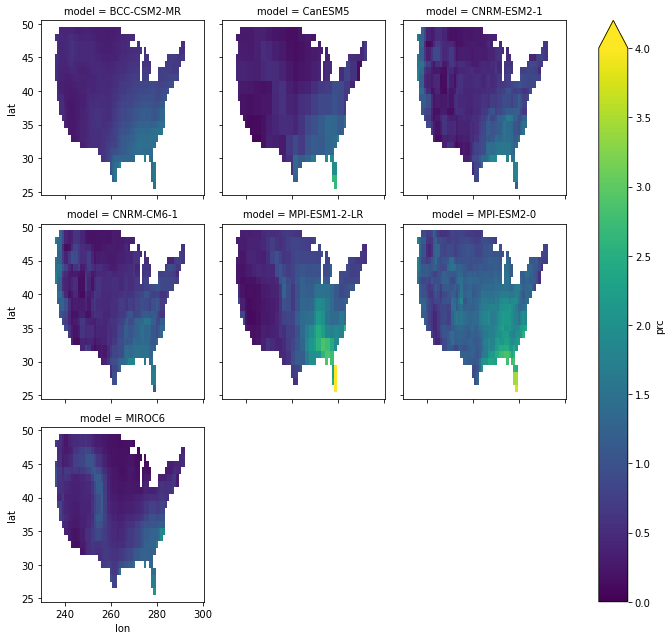

In [38]:
(CP_monthly_cmip*86400).mean('time').where(CONUS_mask>0).plot(col='model',col_wrap=3, vmin=vmin,vmax=vmax)

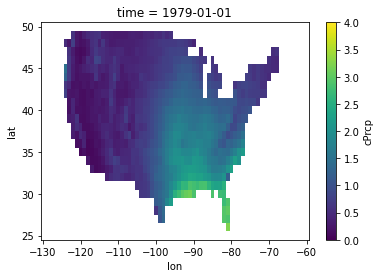

In [39]:
CP_monthly_narr.mean('time').where(CONUS_mask2>0).plot(vmin=vmin,vmax=vmax)

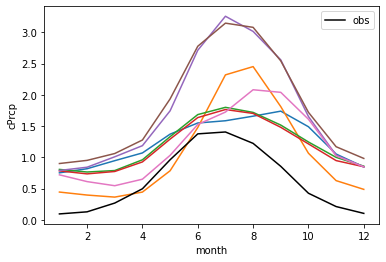

In [42]:
(86400*CP_monthly_cmip).where(lon>=-105).stack(space=['lat','lon']).mean('space').groupby('time.month').mean('time').plot(hue='model')
CP_monthly_narr.where(lon>=-105).stack(space=['lat','lon']).mean('space').groupby('time.month').mean('time').plot(color='k',label='obs')
plt.legend()

#### srh

In [43]:
vmin=50;vmax=150

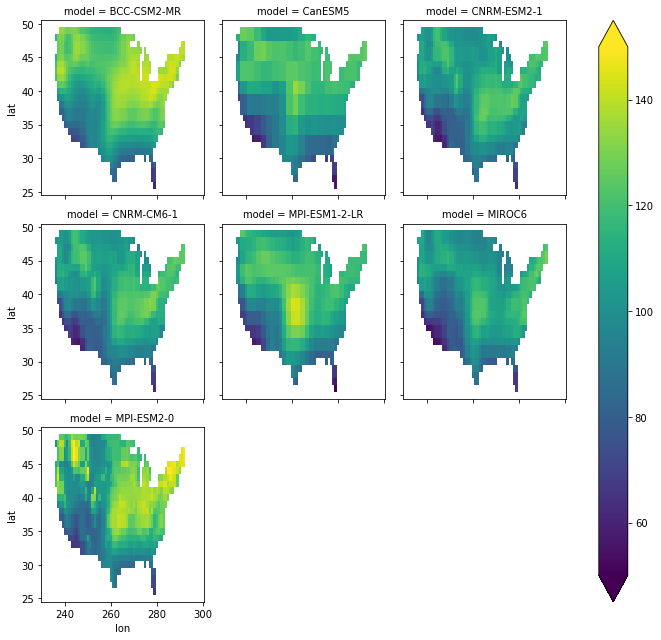

In [44]:
(np.abs(SRH_monthly_cmip)).mean('time').where(CONUS_mask>0).plot(col='model',col_wrap=3, vmin=vmin,vmax=vmax)

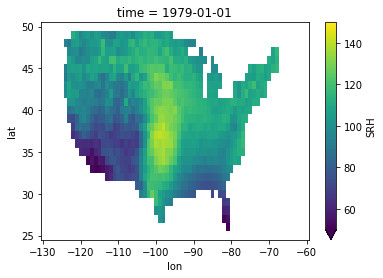

In [45]:
(np.abs(SRH_monthly_narr)).mean('time').where(CONUS_mask2>0).plot(vmin=vmin,vmax=vmax)

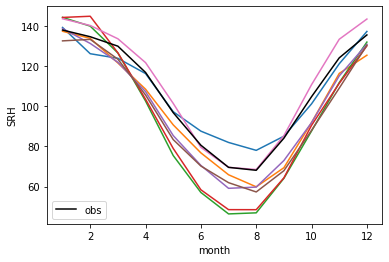

In [46]:
(np.abs(SRH_monthly_cmip)).where(lon>=-105).stack(space=['lat','lon']).mean('space').groupby('time.month').mean('time').plot(hue='model')
(np.abs(SRH_monthly_narr)).where(lon>=-105).stack(space=['lat','lon']).mean('space').groupby('time.month').mean('time').plot(color='k',label='obs')
plt.legend()

#### cin

In [47]:
vmin=0;vmax=100

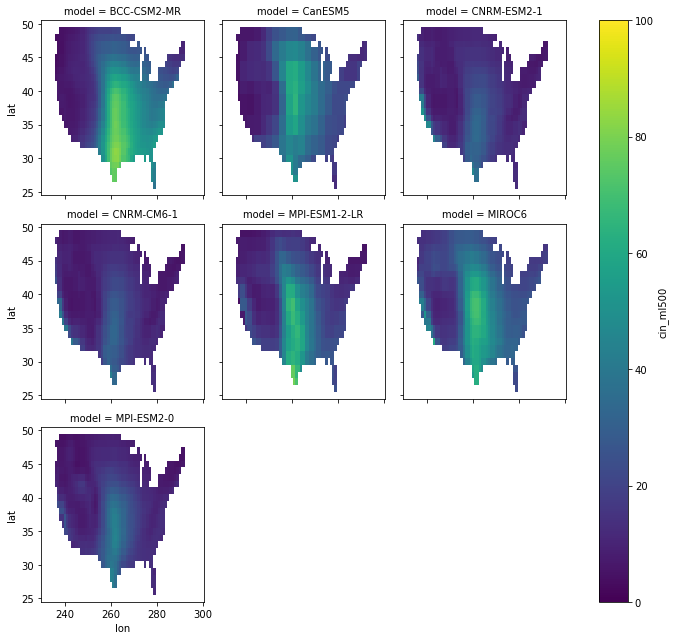

In [48]:
CIN_monthly_cmip.mean('time').where(CONUS_mask>0).plot(col='model',col_wrap=3,vmin=vmin,vmax=vmax)

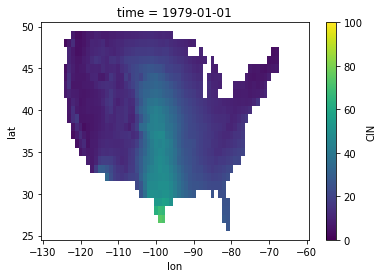

In [49]:
CIN_monthly_narr.mean('time').where(CONUS_mask2>0).plot(vmin=vmin,vmax=vmax)

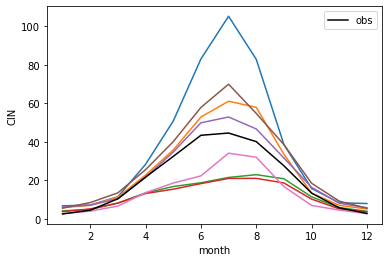

In [50]:
CIN_monthly_cmip.where(lon>=-105).stack(space=['lat','lon']).mean('space').groupby('time.month').mean('time').plot(hue='model')
CIN_monthly_narr.where(lon>=-105).stack(space=['lat','lon']).mean('space').groupby('time.month').mean('time').plot(color='k',label='obs')
plt.legend()

#### 0-6km shear (i actually don't have NARR data for shear so this is not a comparison)

In [51]:
vmin=5;vmax=20

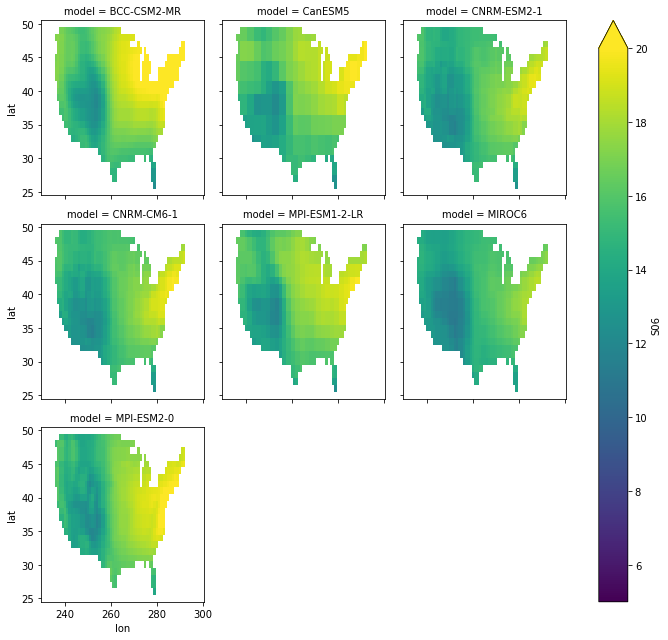

In [52]:
S06_monthly_cmip.mean('time').where(CONUS_mask>0).plot(col='model',col_wrap=3,vmin=vmin,vmax=vmax)

In [53]:
# S06_monthly_narr.mean('time').where(CONUS_mask2>0).plot(vmin=vmin,vmax=vmax)

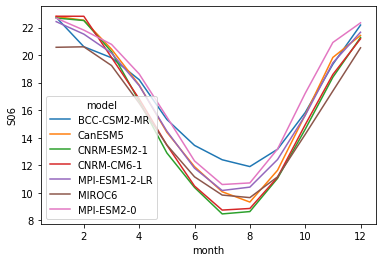

In [55]:
S06_monthly_cmip.where(lon>=-105).stack(space=['lat','lon']).mean('space').groupby('time.month').mean('time').plot(hue='model')


#### covariability...

In [56]:
CIN_monthly_cmip['time'] = CIN_monthly_cmip.indexes['time'].to_datetimeindex()
CAPE_monthly_cmip['time'] = CAPE_monthly_cmip.indexes['time'].to_datetimeindex()
SRH_monthly_cmip['time'] = SRH_monthly_cmip.indexes['time'].to_datetimeindex()
CP_monthly_cmip = CP_monthly_cmip.reindex(model=SRH_monthly_cmip['model'])

/home/kmm2374/miniconda3/envs/p3_2022/lib/python3.8/site-packages/xarray/coding/times.py:360: FutureWarning: Index.ravel returning ndarray is deprecated; in a future version this will return a view on self.
  sample = dates.ravel()[0]
/tmp/ipykernel_114741/1921149369.py:1: RuntimeWarning: Converting a CFTimeIndex with dates from a non-standard calendar, 'noleap', to a pandas.DatetimeIndex, which uses dates from the standard calendar.  This may lead to subtle errors in operations that depend on the length of time between dates.
  CIN_monthly_cmip['time'] = CIN_monthly_cmip.indexes['time'].to_datetimeindex()
/tmp/ipykernel_114741/1921149369.py:2: RuntimeWarning: Converting a CFTimeIndex with dates from a non-standard calendar, 'noleap', to a pandas.DatetimeIndex, which uses dates from the standard calendar.  This may lead to subtle errors in operations that depend on the length of time between dates.
  CAPE_monthly_cmip['time'] = CAPE_monthly_cmip.indexes['time'].to_datetimeindex()
/tmp/

In [59]:
cov_monthly_cmip = np.abs(SRH_monthly_cmip) * CAPE_monthly_cmip * (86400*CP_monthly_cmip)
cov_monthly_narr = np.abs(SRH_monthly_narr)  * CAPE_monthly_narr * CP_monthly_narr
cov_monthly_cmip.shape,cov_monthly_narr.shape

((420, 7, 26, 71), (420, 26, 71))

In [60]:
# cov_monthly_cmip = np.abs(SRH_monthly_cmip) * (86400*CP_monthly_cmip)
# cov_monthly_narr = np.abs(SRH_monthly_narr) * CP_monthly_narr
# cov_monthly_cmip.shape,cov_monthly_narr.shape

In [61]:
# cov_monthly_cmip = np.abs(SRH_monthly_cmip) * CAPE_monthly_cmip * CIN_monthly_cmip
# cov_monthly_narr = np.abs(SRH_monthly_narr) * CAPE_monthly_narr * CIN_monthly_narr
# cov_monthly_cmip.shape,cov_monthly_narr.shape

In [64]:
cov_monthly_cmip.quantile(.95)

<xarray.DataArray ()>
array(211282.63292177)
Coordinates:
    quantile  float64 0.95

In [65]:
vmin=0;vmax=cov_monthly_cmip.quantile(.95)

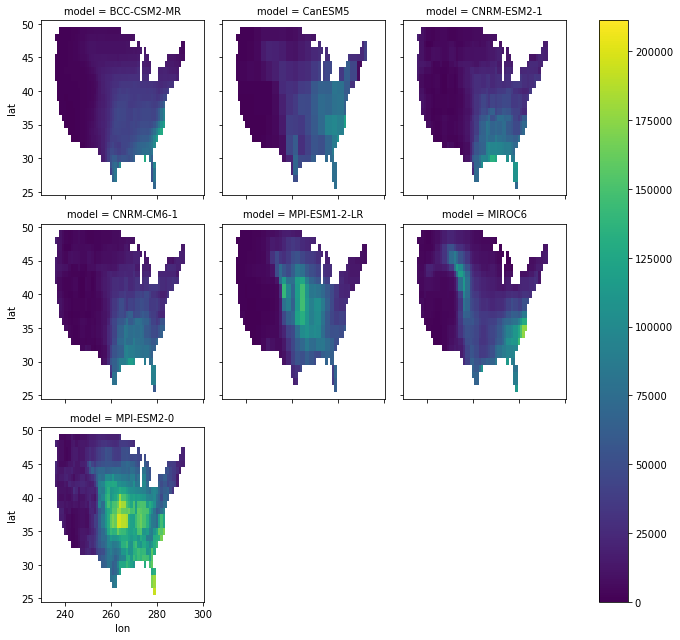

In [66]:
cov_monthly_cmip.mean('time').where(CONUS_mask>0).plot(col='model',col_wrap=3,vmin=vmin, vmax=vmax)

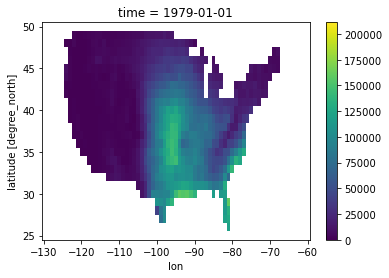

In [67]:
cov_monthly_narr.mean('time').where(CONUS_mask2>0).plot(vmin=vmin, vmax=vmax)

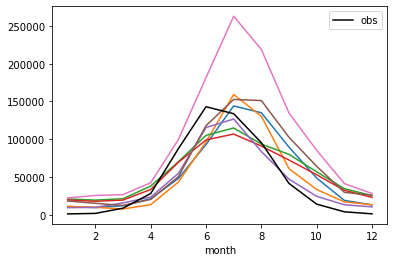

In [68]:
cov_monthly_cmip.where(lon>=-105).stack(space=['lat','lon']).mean('space').groupby('time.month').mean('time').plot(hue='model')
cov_monthly_narr.where(lon>=-105).stack(space=['lat','lon']).mean('space').groupby('time.month').mean('time').plot(color='k',label='obs')
plt.legend()

### training/fitting Poisson regression model

#### multi-model mean/median approach

##### data processing

In [31]:
SRH = np.abs(SRH_monthly_cmip).where(CONUS_mask>0)
CAPE = CAPE_monthly_cmip.where(CONUS_mask>0)
CP = CP_monthly_cmip.where(CONUS_mask>0)
CIN = CIN_monthly_cmip.where(CONUS_mask>0)
S06 = S06_monthly_cmip.where(CONUS_mask>0)
SRH.shape,CAPE.shape,CP.shape,CIN.shape

((420, 7, 26, 71), (420, 7, 26, 71), (420, 7, 26, 71), (420, 7, 26, 71))

In [32]:
tornado_totals = tornadoes_daily_narr#
# tornado_totals = tornado_totals.expand_dims({'model':7})
tornado_totals['lon'] = CAPE['lon'].values
# tornado_totals['model'] = CAPE['model'].values
# tornado_totals = tornado_totals.transpose('time','model','lat','lon')
tornado_totals = tornado_totals.transpose('time','lat','lon')
tornado_totals.shape#.lon,SRH.shape

(420, 26, 71)

In [33]:
# model = 'CanESM5'
SRH_model = SRH.mean('model')#.sel(model=model)
CAPE_model = CAPE.mean('model')#.sel(model=model)
CP_model = CP.mean('model')#.sel(model=model)
CIN_model = CIN.mean('model')#.sel(model=model)
S06_model = S06.mean('model')#.sel(model=model)

In [34]:
# CIN_model.sel(time='2011-04-01').mean('model').plot()

In [35]:
# tornado_totals.sel(time='2011-04-01').mean('model').plot()

In [36]:
day_in_month = CAPE_model['time'].dt.days_in_month

In [37]:
# phi = np.radians(CAPE_model.lat).expand_dims({'time':len(CAPE_model.time),'model':len(CAPE_model.model),'lon':len(CAPE_model.lon)}).transpose('time','model','lat','lon')
phi = np.radians(CAPE_model.lat).expand_dims({'time':len(CAPE_model.time),'lon':len(CAPE_model.lon)}).transpose('time','lat','lon')
phi.shape

(420, 26, 71)

In [38]:
dx,dy=1,1

In [39]:
offset = dx * dx * day_in_month * np.cos(phi)
# offset = offset.reindex(lon=CAPE_model['lon'], model=CAPE_model['model'], time=CAPE_model['time'])
offset = offset.reindex(lon=CAPE_model['lon'], time=CAPE_model['time'])
offset.shape

(420, 26, 71)

In [40]:
# get values only - numpy array
times_cmip = tornado_totals
# times_cmip_flat = times_cmip.stack(space=['time','model','lat','lon'])
times_cmip_flat = times_cmip.stack(space=['time','lat','lon'])
CAPE_flat = CAPE_model.values.flatten()
SRH_flat = SRH_model.values.flatten()
CP_flat = CP_model.values.flatten()
CIN_flat = CIN_model.values.flatten()
S06_flat = S06_model.values.flatten()
tornado_totals_flat = tornado_totals.values.flatten()
offset_flat = offset.values.flatten()
times_cmip_flat.shape,CAPE_flat.shape,CP_flat.shape,CIN_flat.shape,tornado_totals_flat.shape,offset_flat.shape

((775320,), (775320,), (775320,), (775320,), (775320,), (775320,))

In [41]:
# get rid of nan pts (ocean)
times_cmip_flat_clean = times_cmip_flat[~np.isnan(CAPE_flat)]
CAPE_flat_clean = CAPE_flat[~np.isnan(CAPE_flat)]
SRH_flat_clean = SRH_flat[~np.isnan(SRH_flat)]
CP_flat_clean = CP_flat[~np.isnan(CAPE_flat)]
CIN_flat_clean = CIN_flat[~np.isnan(CIN_flat)]
S06_flat_clean = S06_flat[~np.isnan(CAPE_flat)]
offset_flat_clean = offset_flat[~np.isnan(CAPE_flat)]
tornado_totals_flat_clean = tornado_totals_flat[~np.isnan(CAPE_flat)]
times_cmip_flat_clean.shape,CAPE_flat_clean.shape,CP_flat_clean.shape,CIN_flat_clean.shape,S06_flat_clean.shape,offset_flat_clean.shape,tornado_totals_flat_clean.shape

((349440,), (349440,), (349440,), (349440,), (349440,), (349440,), (349440,))

##### build/train model

In [42]:
predictor_list = pd.DataFrame(data = np.column_stack([CAPE_flat_clean,SRH_flat_clean,CP_flat_clean,CIN_flat_clean,S06_flat_clean,tornado_totals_flat_clean,offset_flat_clean]), columns = ['CAPE','SRH','CP','CIN','S06','Tornadoes','Offset'])
predictor_list.head(3)

,CAPE,SRH,CP,CIN,S06,Tornadoes,Offset
0,158.778534,79.879814,0.000006,27.904806,17.683725,0.0,27.862615
1,84.672890,148.313187,0.000002,30.399843,21.782598,0.0,27.621202
2,86.392487,146.589172,0.000003,28.944593,21.764882,0.0,27.621202


In [43]:
gt0 = (predictor_list['CAPE'] * predictor_list['CP'] * predictor_list['CIN'])>0 # find indices where CAPE, CP, CIN is 0

In [44]:
predictor_list['CAPE'][predictor_list['CAPE']==0]=np.nan
predictor_list['log_CAPE'] = np.log(predictor_list['CAPE'])
predictor_list['log_CAPE'][predictor_list['log_CAPE'].isna()]=0.
predictor_list['CAPE'][predictor_list['CAPE'].isna()]=0.
#predictor_list

In [45]:
predictor_list['CP'][predictor_list['CP']==0]=np.nan
predictor_list['log_CP'] = np.log(predictor_list['CP'])
predictor_list['log_CP'][predictor_list['log_CP'].isna()]=0.
predictor_list['CP'][predictor_list['CP'].isna()]=0.
#predictor_list

In [46]:
predictor_list['CIN'][predictor_list['CIN']==0]=np.nan
predictor_list['log_CIN'] = np.log(predictor_list['CIN'])
predictor_list['log_CIN'][predictor_list['log_CIN'].isna()]=0.
predictor_list['CIN'][predictor_list['CIN'].isna()]=0.
#predictor_list

In [47]:
predictor_list['log_SRH'] = np.log(predictor_list['SRH'])
# predictor_list

In [48]:
predictor_list['log_S06'] = np.log(predictor_list['S06'])
predictor_list

,CAPE,SRH,CP,CIN,S06,Tornadoes,Offset,log_CAPE,log_CP,log_CIN,log_SRH,log_S06
0,158.778534,79.879814,6.052543e-06,27.904806,17.683725,0.0,27.862615,5.067510,-12.015032,3.328799,4.380523,2.872645
1,84.672890,148.313187,2.417398e-06,30.399843,21.782598,0.0,27.621202,4.438795,-12.932819,3.414437,4.999326,3.081111
2,86.392487,146.589172,2.914981e-06,28.944593,21.764882,0.0,27.621202,4.458901,-12.745647,3.365383,4.987634,3.080298
3,126.789734,92.640556,4.849193e-06,19.935087,19.220025,0.0,27.621202,4.842530,-12.236698,2.992481,4.528727,2.955953
4,129.825851,87.505562,6.722561e-06,21.554556,18.923634,0.0,27.621202,4.866194,-11.910041,3.070587,4.471702,2.940412
...,...,...,...,...,...,...,...,...,...,...,...,...
349435,2.221362,129.801498,1.335124e-07,0.083149,18.148935,0.0,20.337830,0.798121,-15.829071,-2.487121,4.866006,2.898612
349436,1.742243,127.962990,1.304549e-07,0.099101,18.055610,0.0,20.337830,0.555173,-15.852238,-2.311614,4.851741,2.893456
349437,1.659218,128.055222,1.102118e-07,0.110892,18.240577,0.0,20.337830,0.506346,-16.020862,-2.199203,4.852462,2.903649
349438,1.336707,131.110306,1.015422e-07,0.171761,18.212443,0.0,20.337830,0.290209,-16.102791,-1.761652,4.876039,2.902105


In [392]:
# combine arrays so that columns are each NARR variable
# essentially a list of combinations of predictors tested 

# X_PR = predictor_list[['log_SRH','log_CAPE','log_CP']]
# X_PR = predictor_list[['log_S06','log_CAPE','log_CP']]
X_PR = predictor_list[['log_SRH','log_S06','log_CAPE','log_CP']]

X_PR.shape

(349440, 4)

In [393]:
# add intercept term
X_PR = sm.add_constant(X_PR)
X_PR

,const,log_SRH,log_S06,log_CAPE,log_CP
0,1.0,4.380523,2.872645,5.067510,-12.015032
1,1.0,4.999326,3.081111,4.438795,-12.932819
2,1.0,4.987634,3.080298,4.458901,-12.745647
3,1.0,4.528727,2.955953,4.842530,-12.236698
4,1.0,4.471702,2.940412,4.866194,-11.910041
...,...,...,...,...,...
349435,1.0,4.866006,2.898612,0.798121,-15.829071
349436,1.0,4.851741,2.893456,0.555173,-15.852238
349437,1.0,4.852462,2.903649,0.506346,-16.020862
349438,1.0,4.876039,2.902105,0.290209,-16.102791


In [394]:
y = predictor_list['Tornadoes'].values
y.shape

(349440,)

In [395]:
# y[gt0].shape

In [396]:
%%time
model_PR = sm.GLM(y, X_PR, family=sm.families.Poisson(),offset=np.log(offset_flat_clean)).fit()

CPU times: user 13.3 s, sys: 15.6 s, total: 28.9 s
Wall time: 1.06 s


In [397]:
# model_PR.summary()

In [398]:
model_PR.params

const      -15.114599
log_SRH      1.076833
log_S06      2.321894
log_CAPE     0.722150
log_CP       0.519265
dtype: float64

##### create xr dataset of obs. vs trained data 1980-2014

In [399]:
tornado_predicted = model_PR.predict(X_PR,offset=np.log(offset_flat_clean))
tornado_predicted.shape

(349440,)

In [400]:
tornado_predicted.max()

0.6046092770042851

In [401]:
# data array flattened with only non-zero data
tornado_predicted_tmp = times_cmip_flat_clean.copy()
tornado_predicted_tmp[:]=np.zeros(tornado_predicted_tmp.shape)
tornado_predicted_tmp[:]=tornado_predicted
tornado_predicted_tmp

<xarray.DataArray 'tornado_obs' (space: 349440)>
array([0.05080662, 0.06274687, 0.06915426, ..., 0.00030712, 0.00025734,
       0.00029854], dtype=float32)
Coordinates:
  * space    (space) object MultiIndex
  * time     (space) datetime64[ns] 1980-01-01 1980-01-01 ... 2014-12-01
  * lat      (space) float64 26.0 27.0 27.0 27.0 27.0 ... 49.0 49.0 49.0 49.0
  * lon      (space) float64 279.0 261.0 262.0 278.0 ... 261.0 262.0 263.0 264.0

In [402]:
# data array flattened that includes zeros
tornado_predicted_da = times_cmip_flat.copy()
tornado_predicted_da[:] = np.zeros(tornado_predicted_da.shape)
tornado_predicted_da.loc[{'space': tornado_predicted_tmp['space']}] = tornado_predicted_tmp.values

In [403]:
# unflattens 
tornado_predicted_da = tornado_predicted_da.unstack()
tornado_predicted_da

<xarray.DataArray 'tornado_obs' (time: 420, lat: 26, lon: 71)>
array([[[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]],

       [[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]],

       [[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
...
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]],

       [[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]],

       [[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]]], dtype=float32)
Coordinates:
  * time     (time) datetime64[ns] 1980-01-01 1980-02-01 ... 2014-12-01
  * lat      (lat) float64 25.0 26.0 27.0 28.0 29.0 ... 46.0 47.0 48.0 49.0 50.0
  * lon      (lon) float64 230.0 231.0 232.0 233.0 ... 297.0 298.0 299.0 300.0

In [404]:
tornado_total_ds = xr.Dataset(
    # dictionary for data vars
    {'tornado_obs': (['time','lat', 'lon'], tornado_totals.values),
     'tornado_pred': (['time','lat', 'lon'], tornado_predicted_da.values), 
    },
    coords = {
        'time':(['time'], CAPE_model.time.values),
        'lat': (['lat',], CAPE_model.lat.values),
        'lon': (['lon',], CAPE_model.lon.values)
    }
)
tornado_total_ds.tornado_obs.shape

(420, 26, 71)

In [137]:
# tornado_total_ds = xr.Dataset(
#     # dictionary for data vars
#     {'tornado_obs': (['time','model','lat', 'lon'], tornado_totals.values),
#      'tornado_pred': (['time','model','lat', 'lon'], tornado_predicted_PR_da.values), 
#     },
#     coords = {
#         'time':(['time'], CAPE_model.time.values),
#         'model':(['model'], CAPE_model.model.values),
#         'lat': (['lat',], CAPE_model.lat.values),
#         'lon': (['lon',], CAPE_model.lon.values)
#     }
# )
# tornado_total_ds.tornado_obs.shape

#### analyze seasonal cycle and interannual corr

In [146]:
# have to remask ocean
tornado_total_ds = tornado_total_ds.where(CONUS_mask>0)
tornado_total_ds = tornado_total_ds.where(~np.isnan(CAPE_model))

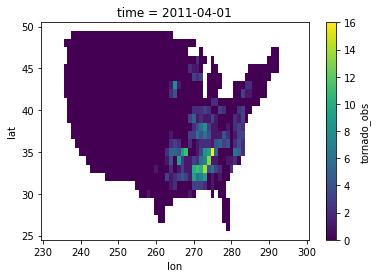

In [140]:
tornado_total_ds.tornado_obs.sel(time='2011-04-01').plot()

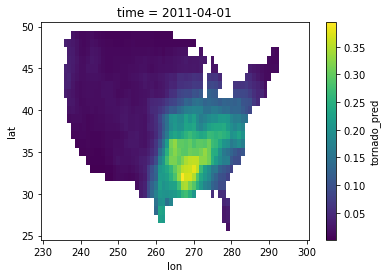

In [147]:
tornado_total_ds.tornado_pred.sel(time='2011-04-01').plot()

In [148]:
# tornado_total_ds.tornado_pred.stack(space=['lat','lon']).sum('space',skipna=True).groupby('time.month').mean('time').mean('model').plot(color='r')
# # tornado_total_ds.tornado_pred.stack(space=['lat','lon']).sum('space',skipna=True).groupby('time.month').mean('time').plot(hue='model')
# tornado_total_ds.tornado_obs.stack(space=['lat','lon']).sum('space',skipna=True).groupby('time.month').mean('time').mean('model').plot(color='k')

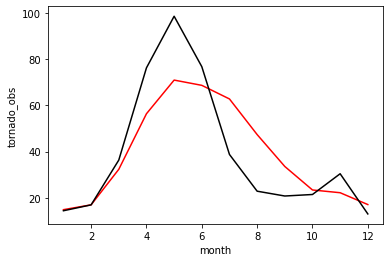

In [149]:
tornado_total_ds.tornado_pred.stack(space=['lat','lon']).sum('space',skipna=True).groupby('time.month').mean('time').plot(color='r')
# tornado_total_ds.tornado_pred.stack(space=['lat','lon']).sum('space',skipna=True).groupby('time.month').mean('time').plot(hue='model')
tornado_total_ds.tornado_obs.stack(space=['lat','lon']).sum('space',skipna=True).groupby('time.month').mean('time').plot(color='k')

In [150]:
from scipy.stats import spearmanr, pearsonr

In [156]:
sum_obs = tornado_total_ds.tornado_obs.stack(space=['lat','lon']).sum('space', skipna=True)
sum_pred = tornado_total_ds.tornado_pred.stack(space=['lat','lon']).sum('space', skipna=True)
sum_pred = sum_pred.where(sum_pred>0)
sum_pred.shape

(420,)

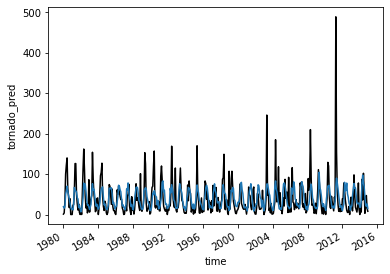

In [157]:
sum_obs.plot(color='k',label='obs')
sum_pred.plot(hue='model',label='TEI')

In [158]:
spearmanr(sum_obs, sum_pred)

SpearmanrResult(correlation=0.5739766129008264, pvalue=3.5838246010361524e-38)

In [172]:
sum_obs = tornado_total_ds.tornado_obs.stack(space=['lat','lon']).sum('space')
season_sum_obs = sum_obs.resample(time='QS-DEC').sum('time')
sum_pred = tornado_total_ds.tornado_pred.stack(space=['lat','lon']).sum('space')
season_sum_pred = sum_pred.resample(time='QS-DEC').sum('time')
season_sum_pred.shape

(141,)

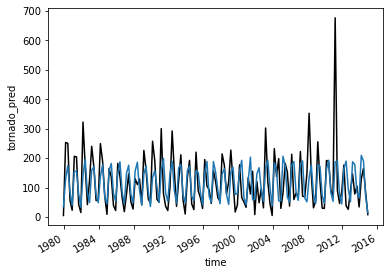

In [173]:
season_sum_obs.plot(color='k',label='obs')
season_sum_pred.plot(hue='model',label='TEI')

In [174]:
spearmanr(season_sum_obs, season_sum_pred)

SpearmanrResult(correlation=0.628524519405687, pvalue=7.187568724776568e-17)

In [180]:
season_sum_obs

<xarray.DataArray 'tornado_obs' (time: 141)>
array([  5., 253., 250.,  56.,  23., 206., 204.,  42.,  15., 322., 173.,
        42., 125., 240., 170.,  56.,  57., 249., 190.,  70.,   9., 165.,
       136.,  39.,  22., 182., 137.,  65.,  18.,  77., 146.,  52.,  27.,
       130., 110., 129.,  41., 226., 160.,  61.,  47., 257., 192.,  60.,
        50., 300.,  80.,  36.,  22., 100., 292., 153.,  36., 124., 211.,
        58.,  10., 134., 192.,  44.,  25., 220.,  89.,  65.,  29., 195.,
       105.,  93.,  46., 157., 120.,  65.,  54., 214., 176.,  78., 120.,
       227., 122.,  17.,  40., 177.,  66.,  51.,  33., 134.,  78., 155.,
         8., 120.,  48.,  97.,  31., 302., 120.,  46.,   5., 232., 138.,
       198.,  29.,  82., 182., 152.,  37., 213.,  59.,  81.,  68., 222.,
        71.,  68., 148., 352., 143.,  31.,  55., 255., 122.,  30.,  29.,
       192., 187.,  91.,  72., 676.,  91.,  46.,  86., 176.,  38.,  26.,
        89., 146.,  78., 105.,  34., 129., 165.,  83.,   8.],
      dtype=float32)
Coordinates:
  * time     (time) datetime64[ns] 1979-12-01 1980-03-01 ... 2014-12-01

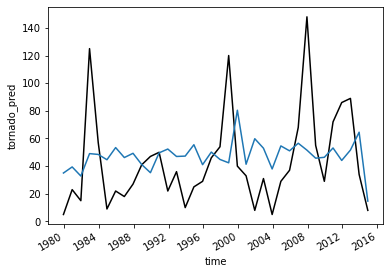

In [192]:
season='DJF'
season_sum_obs.sel(time=season_sum_obs['time.season']==season).plot(color='k',label='obs')
season_sum_pred.sel(time=season_sum_obs['time.season']==season).plot(hue='model',label='TEI')

In [193]:
spearmanr(season_sum_obs.sel(time=season_sum_obs['time.season']==season), season_sum_pred.sel(time=season_sum_obs['time.season']==season))

SpearmanrResult(correlation=0.22403916522076198, pvalue=0.18899255075683308)

In [151]:
# annual_sum_obs = tornado_total_ds.tornado_obs.stack(space=['lat','lon']).sum('space', skipna=True).groupby('time.year').sum('time',skipna=False).mean('model')
# annual_sum_pred = tornado_total_ds.tornado_pred.stack(space=['lat','lon']).sum('space', skipna=True).groupby('time.year').sum('time', skipna=False).mean('model')
# annual_sum_pred = annual_sum_pred.where(annual_sum_pred>0)
# annual_sum_pred.shape

In [176]:
sum_obs = tornado_total_ds.tornado_obs.stack(space=['lat','lon']).sum('space')
annual_sum_obs = sum_obs.resample(time='AS-DEC').sum('time')
sum_pred = tornado_total_ds.tornado_pred.stack(space=['lat','lon']).sum('space')
annual_sum_pred = sum_pred.resample(time='AS-DEC').sum('time')
annual_sum_pred.shape

(36,)

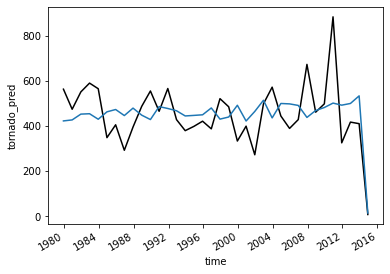

In [177]:
annual_sum_obs.plot(color='k',label='obs')
annual_sum_pred.plot(hue='model',label='TEI')

In [178]:
spearmanr(annual_sum_obs, annual_sum_pred)

SpearmanrResult(correlation=-0.1455785827479981, pvalue=0.39689942311751336)

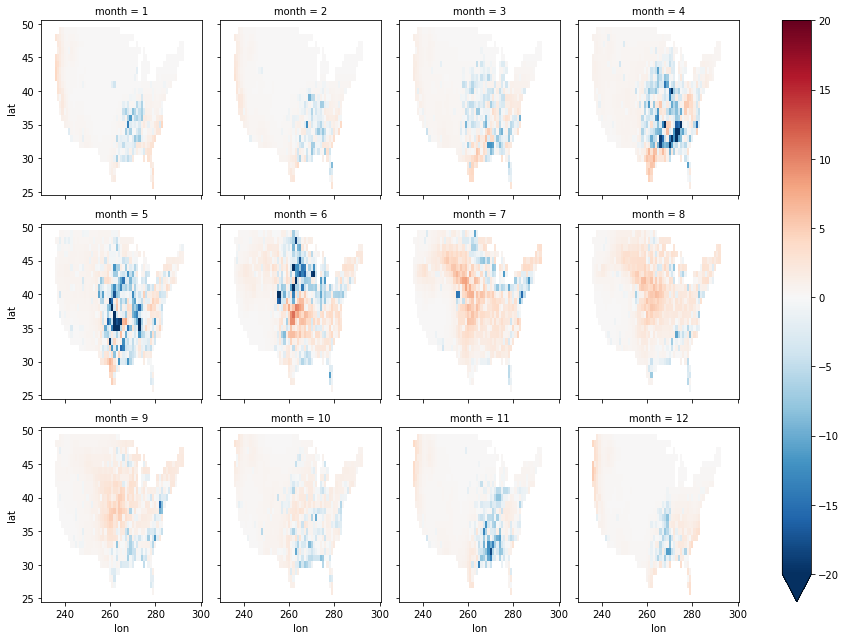

In [195]:
(tornado_total_ds.tornado_pred.groupby('time.month').sum('time').where(CONUS_mask>0) - \
 tornado_total_ds.tornado_obs.groupby('time.month').sum('time').where(CONUS_mask>0)).plot(col='month',col_wrap=4,vmax=20)

In [196]:
annual_sum_mean_obs = tornado_total_ds.tornado_obs.groupby('time.year').sum('time',skipna=False).mean('year')#.mean('model')
annual_sum_mean_pred = tornado_total_ds.tornado_pred.groupby('time.year').sum('time', skipna=False).mean('year')#.mean('model')
annual_sum_mean_obs.shape,annual_sum_mean_pred.shape

((26, 71), (26, 71))

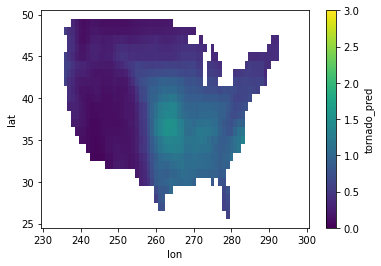

In [197]:
annual_sum_mean_pred.plot(vmin=0,vmax=3)

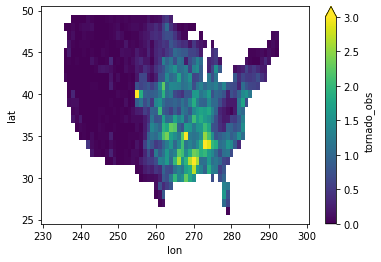

In [198]:
annual_sum_mean_obs.plot(vmin=0,vmax=3)

### training/fitting Neg Bin regression model

#### multi-model mean/median approach

##### data processing

In [43]:
SRH_monthly_cmip.lon, CONUS_mask2.lon, CONUS_mask.lon

(<xarray.DataArray 'lon' (lon: 71)>
 array([230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243,
        244, 245, 246, 247, 248, 249, 250, 251, 252, 253, 254, 255, 256, 257,
        258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271,
        272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285,
        286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299,
        300], dtype=int32)
 Coordinates:
   * lon      (lon) int32 230 231 232 233 234 235 236 ... 295 296 297 298 299 300,
 <xarray.DataArray 'lon' (lon: 71)>
 array([230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243,
        244, 245, 246, 247, 248, 249, 250, 251, 252, 253, 254, 255, 256, 257,
        258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271,
        272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285,
        286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299,
        300])
 Coordinat

In [44]:
SRH = np.abs(SRH_monthly_cmip).where(CONUS_mask2>0)
CAPE = CAPE_monthly_cmip.where(CONUS_mask2>0)
CP = CP_monthly_cmip.where(CONUS_mask2>0)
CIN = CIN_monthly_cmip.where(CONUS_mask2>0)
S06 = S06_monthly_cmip.where(CONUS_mask2>0)
SRH.shape,CAPE.shape,CP.shape,CIN.shape

((420, 7, 26, 71), (420, 7, 26, 71), (420, 7, 26, 71), (420, 7, 26, 71))

In [50]:
tornado_totals = tornadoes_daily_narr#
# tornado_totals = tornado_totals.expand_dims({'model':7})
tornado_totals['lon'] = CAPE['lon'].values
# tornado_totals['model'] = CAPE['model'].values
# tornado_totals = tornado_totals.transpose('time','model','lat','lon')
tornado_totals = tornado_totals.transpose('time','lat','lon')
tornado_totals.shape#.lon,SRH.shape

(420, 26, 71)

In [167]:
# model = 'CanESM5'
# SRH_model = SRH.mean('model')#.sel(model=model)
# CAPE_model = CAPE.mean('model')#.sel(model=model)
# CP_model = CP.mean('model')#.sel(model=model)
# CIN_model = CIN.mean('model')#.sel(model=model)
# S06_model = S06.mean('model')#.sel(model=model)

In [51]:
# model = 'CanESM5'
SRH_model = SRH.mean('model')#.sel(model=model)
CAPE_model = CAPE.mean('model')#.sel(model=model)
CP_model = CP.mean('model')#.sel(model=model)
CIN_model = CIN.mean('model')#.sel(model=model)
S06_model = S06.mean('model')#.sel(model=model)

In [170]:
# CIN_model.sel(time='2011-04-01').mean('model').plot()

In [171]:
# tornado_totals.sel(time='2011-04-01').mean('model').plot()

In [52]:
day_in_month = CAPE_model['time'].dt.days_in_month

In [53]:
# phi = np.radians(CAPE_model.lat).expand_dims({'time':len(CAPE_model.time),'model':len(CAPE_model.model),'lon':len(CAPE_model.lon)}).transpose('time','model','lat','lon')
phi = np.radians(CAPE_model.lat).expand_dims({'time':len(CAPE_model.time),'lon':len(CAPE_model.lon)}).transpose('time','lat','lon')
phi.shape

(420, 26, 71)

In [54]:
dx,dy=1,1

In [55]:
offset = dx * dx * day_in_month * np.cos(phi)
# offset = offset.reindex(lon=CAPE_model['lon'], model=CAPE_model['model'], time=CAPE_model['time'])
offset = offset.reindex(lon=CAPE_model['lon'], time=CAPE_model['time'])
offset.shape

(420, 26, 71)

In [56]:
# get values only - numpy array
times_cmip = tornado_totals
# times_cmip_flat = times_cmip.stack(space=['time','model','lat','lon'])
times_cmip_flat = times_cmip.stack(space=['time','lat','lon'])
CAPE_flat = CAPE_model.values.flatten()
SRH_flat = SRH_model.values.flatten()
CP_flat = CP_model.values.flatten()
CIN_flat = CIN_model.values.flatten()
S06_flat = S06_model.values.flatten()
tornado_totals_flat = tornado_totals.values.flatten()
offset_flat = offset.values.flatten()
times_cmip_flat.shape,CAPE_flat.shape,CP_flat.shape,CIN_flat.shape,tornado_totals_flat.shape,offset_flat.shape

((775320,), (775320,), (775320,), (775320,), (775320,), (775320,))

In [57]:
# get rid of nan pts (ocean)
times_cmip_flat_clean = times_cmip_flat[~np.isnan(CAPE_flat)]
CAPE_flat_clean = CAPE_flat[~np.isnan(CAPE_flat)]
SRH_flat_clean = SRH_flat[~np.isnan(SRH_flat)]
CP_flat_clean = CP_flat[~np.isnan(CAPE_flat)]
CIN_flat_clean = CIN_flat[~np.isnan(CIN_flat)]
S06_flat_clean = S06_flat[~np.isnan(CAPE_flat)]
offset_flat_clean = offset_flat[~np.isnan(CAPE_flat)]
tornado_totals_flat_clean = tornado_totals_flat[~np.isnan(CAPE_flat)]
times_cmip_flat_clean.shape,CAPE_flat_clean.shape,CP_flat_clean.shape,CIN_flat_clean.shape,S06_flat_clean.shape,offset_flat_clean.shape,tornado_totals_flat_clean.shape

((427980,), (427980,), (427980,), (427980,), (427980,), (427980,), (427980,))

##### build/train model

In [58]:
predictor_list = pd.DataFrame(data = np.column_stack([CAPE_flat_clean,SRH_flat_clean,CP_flat_clean,CIN_flat_clean,S06_flat_clean,tornado_totals_flat_clean,offset_flat_clean]), columns = ['CAPE','SRH','CP','CIN','S06','Tornadoes','Offset'])
predictor_list.head(3)

,CAPE,SRH,CP,CIN,S06,Tornadoes,Offset
0,115.878212,125.489555,0.000004,39.387218,18.293693,0.0,28.095541
1,222.903320,134.009598,0.000006,39.098068,18.556812,0.0,28.095541
2,195.433838,73.086266,0.000007,35.090313,16.209161,0.0,28.095541


In [59]:
gt0 = (predictor_list['CAPE'] * predictor_list['CP'] * predictor_list['CIN'])>0 # find indices where CAPE, CP, CIN is 0

In [60]:
predictor_list['CAPE'][predictor_list['CAPE']==0]=np.nan
predictor_list['log_CAPE'] = np.log(predictor_list['CAPE'])
predictor_list['log_CAPE'][predictor_list['log_CAPE'].isna()]=0.
predictor_list['CAPE'][predictor_list['CAPE'].isna()]=0.
#predictor_list

In [61]:
predictor_list['CP'][predictor_list['CP']==0]=np.nan
predictor_list['log_CP'] = np.log(predictor_list['CP'])
predictor_list['log_CP'][predictor_list['log_CP'].isna()]=0.
predictor_list['CP'][predictor_list['CP'].isna()]=0.
#predictor_list

In [62]:
predictor_list['CIN'][predictor_list['CIN']==0]=np.nan
predictor_list['log_CIN'] = np.log(predictor_list['CIN'])
predictor_list['log_CIN'][predictor_list['log_CIN'].isna()]=0.
predictor_list['CIN'][predictor_list['CIN'].isna()]=0.
#predictor_list

In [63]:
predictor_list['log_SRH'] = np.log(predictor_list['SRH'])
# predictor_list

In [64]:
predictor_list['log_S06'] = np.log(predictor_list['S06'])
predictor_list

,CAPE,SRH,CP,CIN,S06,Tornadoes,Offset,log_CAPE,log_CP,log_CIN,log_SRH,log_S06
0,115.878212,125.489555,3.988050e-06,39.387218,18.293693,0.0,28.095541,4.752540,-12.432208,3.673441,4.832223,2.906556
1,222.903320,134.009598,5.959238e-06,39.098068,18.556812,0.0,28.095541,5.406738,-12.030568,3.666073,4.897911,2.920837
2,195.433838,73.086266,6.521298e-06,35.090313,16.209161,0.0,28.095541,5.275222,-11.940437,3.557925,4.291640,2.785577
3,196.789429,70.282646,6.659568e-06,36.987118,15.981864,0.0,28.095541,5.282134,-11.919456,3.610570,4.252525,2.771455
4,218.941040,65.253441,7.745218e-06,40.372524,15.749789,0.0,28.095541,5.388802,-11.768435,3.698149,4.178279,2.756827
...,...,...,...,...,...,...,...,...,...,...,...,...
427975,0.935408,133.292236,2.272448e-07,0.025588,17.572545,0.0,20.337830,-0.066772,-15.297238,-3.665612,4.892544,2.866338
427976,0.975455,123.866135,2.957361e-07,0.039561,17.286047,0.0,20.337830,-0.024852,-15.033798,-3.229905,4.819201,2.849900
427977,1.673001,114.372200,4.952507e-07,0.134186,17.105894,0.0,20.337830,0.514619,-14.518202,-2.008531,4.739458,2.839423
427978,1.647910,112.825485,5.034573e-07,0.134600,17.168027,0.0,20.337830,0.499508,-14.501767,-2.005448,4.725842,2.843049


In [65]:
# combine arrays so that columns are each NARR variable
# essentially a list of combinations of predictors tested 

X_NBR = predictor_list[['log_SRH','log_CAPE','log_CP']]
# X_NBR = predictor_list[['log_S06','log_CAPE','log_CP']]
# X_NBR = predictor_list[['log_SRH','log_S06','log_CAPE','log_CP']]
X_NBR.shape

(427980, 3)

In [66]:
# add intercept term
X_NBR = sm.add_constant(X_NBR)
X_NBR

,const,log_SRH,log_CAPE,log_CP
0,1.0,4.832223,4.752540,-12.432208
1,1.0,4.897911,5.406738,-12.030568
2,1.0,4.291640,5.275222,-11.940437
3,1.0,4.252525,5.282134,-11.919456
4,1.0,4.178279,5.388802,-11.768435
...,...,...,...,...
427975,1.0,4.892544,-0.066772,-15.297238
427976,1.0,4.819201,-0.024852,-15.033798
427977,1.0,4.739458,0.514619,-14.518202
427978,1.0,4.725842,0.499508,-14.501767


In [67]:
y = predictor_list['Tornadoes'].values
y.shape

(427980,)

In [68]:
%%time
import statsmodels.discrete.discrete_model as sdm

loglike_method = 'nb2'
model_NB = sdm.NegativeBinomial(y, X_NBR, loglike_method=loglike_method,offset=np.log(offset_flat_clean)).fit()


         Current function value: 0.126769
         Iterations: 35
         Function evaluations: 42
         Gradient evaluations: 42
CPU times: user 2min 44s, sys: 3min 6s, total: 5min 51s
Wall time: 12.4 s


/home/kmm2374/miniconda3/envs/p3_2022/lib/python3.8/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


In [69]:
model_NB.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                     NegativeBinomial Regression Results                      
==============================================================================
Dep. Variable:                      y   No. Observations:               427980
Model:               NegativeBinomial   Df Residuals:                   427976
Method:                           MLE   Df Model:                            3
Date:                Thu, 19 Dec 2024   Pseudo R-squ.:                 0.09123
Time:                        11:54:54   Log-Likelihood:                -54255.
converged:                      False   LL-Null:                       -59701.
Covariance Type:            nonrobust   LLR p-value:                     0.000
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const        -18.0629      0.435    -41.478      0.000     -18.916     -17.209
log_SRH        2.8305      0.042     66.762      0.000       2.747       2.914
log_CAPE       0.7123      0.017     42.240      0.000       0.679       0.745
log_CP         0.4274      0.025     17.222      0.000       0.379       0.476
alpha         15.3885      0.292     52.635      0.000      14.815      15.962
==============================================================================
"""

In [70]:
# model_PR.summary()

In [71]:
model_NB.params

const      -18.062864
log_SRH      2.830483
log_CAPE     0.712287
log_CP       0.427356
alpha       15.388518
dtype: float64

##### create xr dataset of obs. vs trained data 1980-2014

In [72]:
tornado_predicted = model_NB.predict(X_NBR,offset=np.log(offset_flat_clean))
tornado_predicted.shape

(427980,)

In [73]:
tornado_predicted.max()

0.7260850908318439

In [74]:
# data array flattened with only non-zero data
tornado_predicted_tmp = times_cmip_flat_clean.copy()
tornado_predicted_tmp[:]=np.zeros(tornado_predicted_tmp.shape)
tornado_predicted_tmp[:]=tornado_predicted
tornado_predicted_tmp

<xarray.DataArray 'CAPE' (space: 427980)>
array([0.05091785, 0.1160203 , 0.0197384 , ..., 0.00056804, 0.00054453,
       0.00075874], dtype=float32)
Coordinates:
  * space    (space) object MultiIndex
  * time     (space) datetime64[ns] 1980-01-01 1980-01-01 ... 2014-12-01
  * lat      (space) float64 25.0 25.0 25.0 25.0 25.0 ... 49.0 49.0 49.0 49.0
  * lon      (space) int32 262 263 278 279 280 260 ... 268 269 270 271 272 273

In [75]:
# data array flattened that includes zeros
tornado_predicted_da = times_cmip_flat.copy()
tornado_predicted_da[:] = np.zeros(tornado_predicted_da.shape)
tornado_predicted_da.loc[{'space': tornado_predicted_tmp['space']}] = tornado_predicted_tmp.values

In [76]:
# unflattens 
tornado_predicted_da = tornado_predicted_da.unstack()
tornado_predicted_da

<xarray.DataArray 'CAPE' (time: 420, lat: 26, lon: 71)>
array([[[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]],

       [[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]],

       [[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
...
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]],

       [[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]],

       [[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]]], dtype=float32)
Coordinates:
  * time     (time) datetime64[ns] 1980-01-01 1980-02-01 ... 2014-12-01
  * lat      (lat) float64 25.0 26.0 27.0 28.0 29.0 ... 46.0 47.0 48.0 49.0 50.0
  * lon      (lon) int32 230 231 232 233 234 235 236 ... 295 296 297 298 299 300

In [83]:
tornado_total_ds = xr.Dataset(
    # dictionary for data vars
    {'tornado_obs': (['time','lat', 'lon'], tornado_totals.values),
     'tornado_pred': (['time','lat', 'lon'], tornado_predicted_da.values), 
    },
    coords = {
        'time':(['time'], CAPE_model.time.values),
        'lat': (['lat',], CAPE_model.lat.values),
        'lon': (['lon',], CAPE_model.lon.values)
    }
)
tornado_total_ds.tornado_obs.shape

(420, 26, 71)

In [137]:
# tornado_total_ds = xr.Dataset(
#     # dictionary for data vars
#     {'tornado_obs': (['time','model','lat', 'lon'], tornado_totals.values),
#      'tornado_pred': (['time','model','lat', 'lon'], tornado_predicted_PR_da.values), 
#     },
#     coords = {
#         'time':(['time'], CAPE_model.time.values),
#         'model':(['model'], CAPE_model.model.values),
#         'lat': (['lat',], CAPE_model.lat.values),
#         'lon': (['lon',], CAPE_model.lon.values)
#     }
# )
# tornado_total_ds.tornado_obs.shape

#### analyze seasonal cycle and interannual corr

In [87]:
# have to remask ocean
tornado_total_ds = tornado_total_ds.where(CONUS_mask2>0)
tornado_total_ds = tornado_total_ds.where(~np.isnan(CAPE_model))

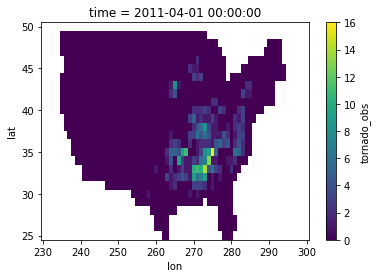

In [88]:
tornado_total_ds.tornado_obs.sel(time='2011-04-01').plot()

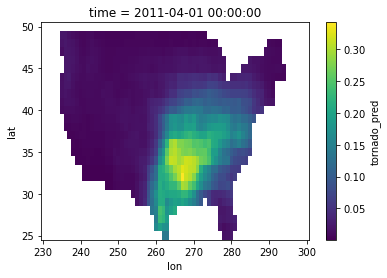

In [89]:
tornado_total_ds.tornado_pred.sel(time='2011-04-01').plot()

In [90]:
# tornado_total_ds.tornado_pred.stack(space=['lat','lon']).sum('space',skipna=True).groupby('time.month').mean('time').mean('model').plot(color='r')
# # tornado_total_ds.tornado_pred.stack(space=['lat','lon']).sum('space',skipna=True).groupby('time.month').mean('time').plot(hue='model')
# tornado_total_ds.tornado_obs.stack(space=['lat','lon']).sum('space',skipna=True).groupby('time.month').mean('time').mean('model').plot(color='k')

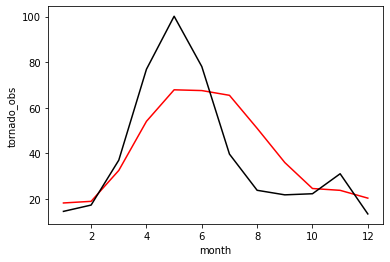

In [91]:
tornado_total_ds.tornado_pred.stack(space=['lat','lon']).sum('space',skipna=True).groupby('time.month').mean('time').plot(color='r')
# tornado_total_ds.tornado_pred.stack(space=['lat','lon']).sum('space',skipna=True).groupby('time.month').mean('time').plot(hue='model')
tornado_total_ds.tornado_obs.stack(space=['lat','lon']).sum('space',skipna=True).groupby('time.month').mean('time').plot(color='k')

In [92]:
from scipy.stats import spearmanr, pearsonr

In [93]:
sum_obs = tornado_total_ds.tornado_obs.stack(space=['lat','lon']).sum('space', skipna=True)
sum_pred = tornado_total_ds.tornado_pred.stack(space=['lat','lon']).sum('space', skipna=True)
sum_pred = sum_pred.where(sum_pred>0)
sum_pred.shape

(420,)

In [94]:
# sum_obs.plot(color='k',label='obs')
# sum_pred.plot(hue='model',label='TEI')

In [95]:
spearmanr(sum_obs, sum_pred)

SpearmanrResult(correlation=0.5472244481944697, pvalue=3.5214734199071413e-34)

In [96]:
sum_obs = tornado_total_ds.tornado_obs.stack(space=['lat','lon']).sum('space')
season_sum_obs = sum_obs.resample(time='QS-DEC').sum('time')
sum_pred = tornado_total_ds.tornado_pred.stack(space=['lat','lon']).sum('space')
season_sum_pred = sum_pred.resample(time='QS-DEC').sum('time')
season_sum_pred.shape

(141,)

In [97]:
# season_sum_obs.plot(color='k',label='obs')
# season_sum_pred.plot(hue='model',label='TEI')

In [98]:
spearmanr(season_sum_obs, season_sum_pred)

SpearmanrResult(correlation=0.6166844520498463, pvalue=3.902408463582892e-16)

In [99]:
# season_sum_obs

In [102]:
season='DJF'
# season_sum_obs.sel(time=season_sum_obs['time.season']==season).plot(color='k',label='obs')
# season_sum_pred.sel(time=season_sum_obs['time.season']==season).plot(hue='model',label='TEI')

In [103]:
spearmanr(season_sum_obs.sel(time=season_sum_obs['time.season']==season), season_sum_pred.sel(time=season_sum_obs['time.season']==season))

SpearmanrResult(correlation=0.3346639640417024, pvalue=0.04603597133119177)

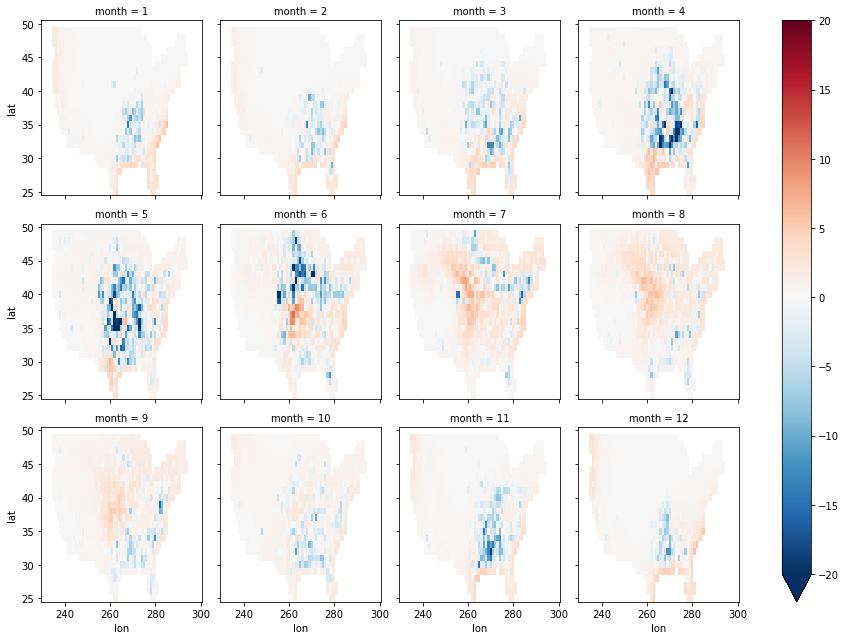

In [105]:
(tornado_total_ds.tornado_pred.groupby('time.month').sum('time').where(CONUS_mask2>0) - \
 tornado_total_ds.tornado_obs.groupby('time.month').sum('time').where(CONUS_mask2>0)).plot(col='month',col_wrap=4,vmax=20)

In [106]:
annual_sum_mean_obs = tornado_total_ds.tornado_obs.groupby('time.year').sum('time',skipna=False).mean('year')#.mean('model')
annual_sum_mean_pred = tornado_total_ds.tornado_pred.groupby('time.year').sum('time', skipna=False).mean('year')#.mean('model')
annual_sum_mean_obs.shape,annual_sum_mean_pred.shape

((26, 71), (26, 71))

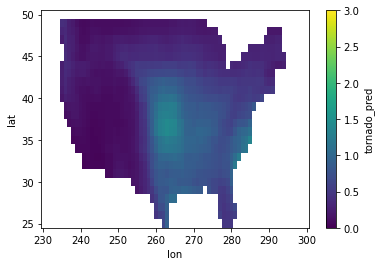

In [107]:
annual_sum_mean_pred.plot(vmin=0,vmax=3)

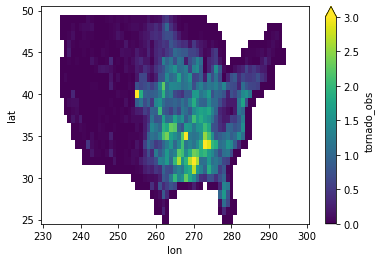

In [108]:
annual_sum_mean_obs.plot(vmin=0,vmax=3)

### load cmip future data and predict tornado counts

#### ssp585

##### load

In [109]:
ds_convective_models_future = xr.open_dataset('/local/BLOB/cmip/Convective_monthly_NAmerica_ssp585.nc')
ds_prc_models_future = xr.open_dataset('/local/BLOB/cmip/CP_monthly_NAmerica_ssp585.nc')
ds_prc_models_future = ds_prc_models_future.transpose('time','model','lat','lon')
ds_prc_models_future = ds_prc_models_future.assign_coords(time=ds_convective_models_future['time'], model=ds_prc_models_future['model'].where(ds_prc_models_future['model'] != 'MRI-ESM2-0', 'MPI-ESM2-0'))
ds_shear_models_future = xr.open_dataset('/local/BLOB/cmip/Shear_monthly_NAmerica_ssp585.nc')
ds_shear_models_future = ds_shear_models_future.assign_coords(time=ds_convective_models_future['time'], model=ds_convective_models_future['model'])
ds_prc_models_future, ds_convective_models_future, ds_shear_models_future

(<xarray.Dataset>
 Dimensions:  (time: 1032, model: 7, lat: 26, lon: 71)
 Coordinates:
   * time     (time) object 2015-01-01 00:00:00 ... 2100-12-01 00:00:00
   * lon      (lon) int32 230 231 232 233 234 235 236 ... 295 296 297 298 299 300
   * lat      (lat) int32 25 26 27 28 29 30 31 32 33 ... 43 44 45 46 47 48 49 50
   * model    (model) object 'BCC-CSM2-MR' 'CanESM5' ... 'MPI-ESM2-0' 'MIROC6'
 Data variables:
     prc      (time, model, lat, lon) float32 ...
 Attributes:
     regrid_method:  nearest_s2d,
 <xarray.Dataset>
 Dimensions:     (time: 1032, model: 7, lat: 26, lon: 71)
 Coordinates:
   * time        (time) object 2015-01-01 00:00:00 ... 2100-12-01 00:00:00
   * lon         (lon) int32 230 231 232 233 234 235 ... 295 296 297 298 299 300
   * lat         (lat) int32 25 26 27 28 29 30 31 32 ... 43 44 45 46 47 48 49 50
   * model       (model) object 'BCC-CSM2-MR' 'CanESM5' ... 'MPI-ESM2-0' 'MIROC6'
 Data variables:
     cape_ml500  (time, model, lat, lon) float32 ...
     c

In [110]:
CAPE_monthly_cmip_ssp585 = ds_convective_models_future.cape_ml500
CIN_monthly_cmip_ssp585 = ds_convective_models_future.cin_ml500
SRH_monthly_cmip_lm_ssp585 = ds_convective_models_future.srh_lm3km
SRH_monthly_cmip_rm_ssp585 = ds_convective_models_future.srh_rm3km
SRH_monthly_cmip_ssp585 = xr.where(np.abs(SRH_monthly_cmip_lm_ssp585) > np.abs(SRH_monthly_cmip_rm_ssp585), SRH_monthly_cmip_lm_ssp585, SRH_monthly_cmip_rm_ssp585)
CP_monthly_cmip_ssp585 = ds_prc_models_future.prc
S06_monthly_cmip_ssp585 = ds_shear_models_future.S06
CP_monthly_cmip_ssp585.shape,CIN_monthly_cmip_ssp585.shape,CAPE_monthly_cmip_ssp585.shape,SRH_monthly_cmip_ssp585.shape

((1032, 7, 26, 71), (1032, 7, 26, 71), (1032, 7, 26, 71), (1032, 7, 26, 71))

##### data processing

In [111]:
model_NB.params

const      -18.062864
log_SRH      2.830483
log_CAPE     0.712287
log_CP       0.427356
alpha       15.388518
dtype: float64

In [112]:
CAPE_ssp585 = CAPE_monthly_cmip_ssp585.where(CONUS_mask2>0)
S06_ssp585 = S06_monthly_cmip_ssp585.where(CONUS_mask2>0)#.where(~np.isnan(CAPE_ssp585))
SRH_ssp585 = np.abs(SRH_monthly_cmip_ssp585).where(CONUS_mask2>0)#.where(~np.isnan(S06_ssp585))
CP_ssp585 = CP_monthly_cmip_ssp585.where(CONUS_mask2>0)#.where(~np.isnan(CAPE_ssp585))
CIN_ssp585 = CIN_monthly_cmip_ssp585.where(CONUS_mask2>0)#.where(~np.isnan(S06_ssp585))
S06_ssp585 = S06_monthly_cmip_ssp585.where(CONUS_mask2>0)#.where(~np.isnan(S06_ssp585))
SRH_ssp585.shape,CAPE_ssp585.shape,CP_ssp585.shape

((1032, 7, 26, 71), (1032, 7, 26, 71), (1032, 7, 26, 71))

In [113]:
# model = 'CanESM5'
# SRH_model_ssp585 = SRH_ssp585.mean('model')#.sel(model=model)
# CAPE_model_ssp585 = CAPE_ssp585.mean('model')#.sel(model=model)
# CIN_model_ssp585 = CIN_ssp585.mean('model')#.sel(model=model)
# CP_model_ssp585 = CP_ssp585.mean('model')#.sel(model=model)
# S06_model_ssp585 = S06_ssp585.mean('model')#.sel(model=model)

In [114]:
# model = 'CanESM5'
SRH_model_ssp585 = SRH_ssp585.mean('model')#.sel(model=model)
CAPE_model_ssp585 = CAPE_ssp585.mean('model')#.sel(model=model)
CIN_model_ssp585 = CIN_ssp585.mean('model')#.sel(model=model)
CP_model_ssp585 = CP_ssp585.mean('model')#.sel(model=model)
S06_model_ssp585 = S06_ssp585.mean('model')#.sel(model=model)

In [115]:
day_in_month = CAPE_model_ssp585['time'].dt.days_in_month

In [116]:
# phi = np.radians(CAPE_model_ssp585.lat).expand_dims({'time':len(CAPE_model_ssp585.time),'model':len(CAPE_model_ssp585.model),\
#                                                      'lon':len(CAPE_model_ssp585.lon)}).transpose('time','model','lat','lon')
phi = np.radians(CAPE_model_ssp585.lat).expand_dims({'time':len(CAPE_model_ssp585.time),'lon':len(CAPE_model_ssp585.lon)}).transpose('time','lat','lon')
phi.shape

(1032, 26, 71)

In [117]:
dx,dy=1,1

In [118]:
offset_ssp585 = dx * dx * day_in_month * np.cos(phi)
# offset = offset.reindex(lon=CAPE_model_ssp585['lon'], model=CAPE_model_ssp585['model'], time=CAPE_model_ssp585['time'])
offset_ssp585 = offset_ssp585.reindex(lon=CAPE_model_ssp585['lon'], time=CAPE_model_ssp585['time'])
offset_ssp585.shape

(1032, 26, 71)

In [119]:
# tornado_predicted_ssp585_da = np.exp(model_PR.params['const'] \
# + model_PR.params['log_SRH']*np.log(SRH_model_ssp585) \
# + model_PR.params['log_S06']*np.log(S06_model_ssp585) \
# + model_PR.params['log_CAPE']*np.log(CAPE_model_ssp585) \
# + model_PR.params['log_CP']*np.log(CP_model_ssp585) \
# + np.log(offset_ssp585))

In [120]:
tornado_predicted_ssp585_da = np.exp(model_NB.params['const'] \
+ model_NB.params['log_SRH']*np.log(SRH_model_ssp585) \
# + model_NB.params['log_S06']*np.log(S06_model_ssp585) \
+ model_NB.params['log_CAPE']*np.log(CAPE_model_ssp585) \
+ model_NB.params['log_CP']*np.log(CP_model_ssp585) \
+ np.log(offset_ssp585))

In [121]:
# tornado_total_ssp585_ds = xr.Dataset(
#     # dictionary for data vars
#     {
#     # 'tornado_obs': (['time','model','lat', 'lon'], tornado_totals.values),
#      'tornado_pred': (['time','model','lat', 'lon'], tornado_predicted_ssp585_da.values), 
#     },
#     coords = {
#         'time':(['time'], CAPE_model_ssp585.time.values),
#         'model':(['model'], CAPE_model_ssp585.model.values),
#         'lat': (['lat',], CAPE_model_ssp585.lat.values),
#         'lon': (['lon',], CAPE_model_ssp585.lon.values)
#     }
# )
# tornado_total_ssp585_ds.tornado_pred.shape

In [122]:
tornado_total_ssp585_ds = xr.Dataset(
    # dictionary for data vars
    {
     # 'tornado_obs': (['time','lat', 'lon'], tornado_totals.values),
     'tornado_pred': (['time','lat', 'lon'], tornado_predicted_ssp585_da.values), 
    },
    coords = {
        'time':(['time'], CAPE_model_ssp585.time.values),
        'lat': (['lat',], CAPE_model_ssp585.lat.values),
        'lon': (['lon',], CAPE_model_ssp585.lon.values)
    }
)
tornado_total_ssp585_ds.tornado_pred.shape

(1032, 26, 71)

##### analyze seasonal cycle

In [213]:
tornado_total_ssp585_ds = tornado_total_ssp585_ds.where(CONUS_mask>0)
tornado_total_ssp585_ds = tornado_total_ssp585_ds.where(~np.isnan(CAPE_model_ssp585))

In [214]:
# tornado_total_ssp585_ds.tornado_pred.sel(time='2080-04-01').mean('model').plot()

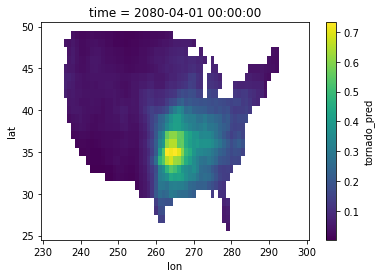

In [215]:
tornado_total_ssp585_ds.tornado_pred.sel(time='2080-04-01').plot()

In [216]:
# tornado_total_ds.tornado_pred.stack(space=['lat','lon']).sum('space',skipna=True).groupby('time.month').mean('time').mean('model').plot(color='b')
# tornado_total_ssp585_ds.tornado_pred.stack(space=['lat','lon']).sum('space',skipna=True).groupby('time.month').mean('time').mean('model').plot(color='r')

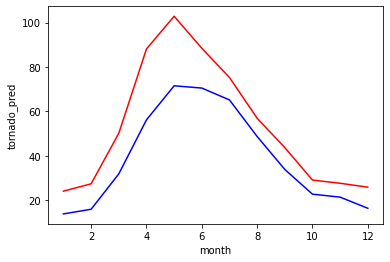

In [217]:
tornado_total_ds.tornado_pred.stack(space=['lat','lon']).sum('space',skipna=True).groupby('time.month').mean('time').plot(color='b')
tornado_total_ssp585_ds.tornado_pred.stack(space=['lat','lon']).sum('space',skipna=True).groupby('time.month').mean('time').plot(color='r')

In [218]:
# (tornado_total_ssp585_ds.tornado_pred.groupby('time.month').sum('time').where(CONUS_mask>0).mean('model') - \
#  tornado_total_ds.tornado_pred.groupby('time.month').sum('time').where(CONUS_mask>0).mean('model')).plot(col='month',col_wrap=4,vmin=-10,vmax=10)

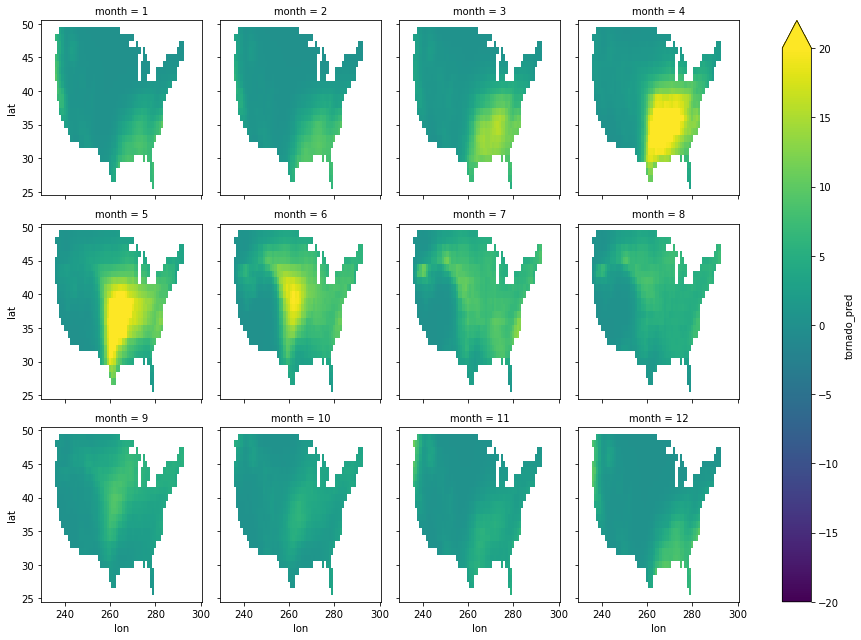

In [219]:
(tornado_total_ssp585_ds.tornado_pred.groupby('time.month').sum('time').where(CONUS_mask>0) - \
 tornado_total_ds.tornado_pred.groupby('time.month').sum('time').where(CONUS_mask>0)).plot(col='month',col_wrap=4,vmin=-20,vmax=20)

### calculating TEI and deltas

#### calculate baseline -> 1980-2010 climo

In [123]:
TEI_hist_baseline = tornado_total_ds.tornado_pred.sel(time=tornado_total_ds.tornado_pred['time.year']<2015).groupby('time.year').sum('time').mean('year').where(CONUS_mask2>0)#.plot()
TEI_hist_baseline.shape

(26, 71)

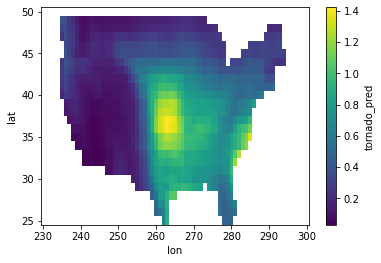

In [124]:
TEI_hist_baseline.plot()

##### environs baseline climo

In [125]:
CP_hist_baseline = CP_model.sel(time=CP_model['time.year']<2015).mean('time').where(CONUS_mask2>0)#.plot()
CP_hist_baseline.shape

(26, 71)

In [126]:
SRH_hist_baseline = SRH_model.sel(time=SRH_model['time.year']<2015).mean('time').where(CONUS_mask2>0)#.plot()
SRH_hist_baseline.shape

(26, 71)

In [127]:
CAPE_hist_baseline = CAPE_model.sel(time=CAPE_model['time.year']<2015).mean('time').where(CONUS_mask2>0)#.plot()
CAPE_hist_baseline.shape

(26, 71)

#### ssp585 deltas

##### calculate $\Delta$TEI for 2040-2060, 2080-2100

In [128]:
TEI_future_2100 = tornado_total_ssp585_ds.tornado_pred.sel(time=(tornado_total_ssp585_ds.tornado_pred['time.year']>=2081)\
                                                           &(tornado_total_ssp585_ds.tornado_pred['time.year']<=2100))\
                                                       .groupby('time.year').sum('time').mean('year').where(CONUS_mask2>0)#.plot()
TEI_future_2100.shape

(26, 71)

In [129]:
TEI_future_2050 = tornado_total_ssp585_ds.tornado_pred.sel(time=(tornado_total_ssp585_ds.tornado_pred['time.year']>=2041)\
                                                           &(tornado_total_ssp585_ds.tornado_pred['time.year']<=2060))\
                                                       .groupby('time.year').sum('time').mean('year').where(CONUS_mask2>0)#.plot()
TEI_future_2050.shape

(26, 71)

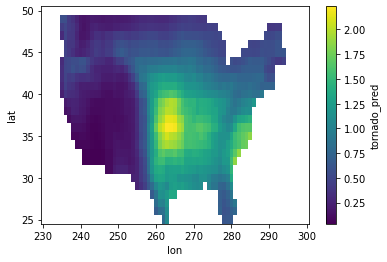

In [130]:
TEI_future_2100.plot()

###### environs

In [131]:
CP_future_2100 = CP_model_ssp585.sel(time=(CP_model_ssp585['time.year']>=2081)\
                                         &(CP_model_ssp585['time.year']<=2100))\
                                .mean('time').where(CONUS_mask2>0)#.plot()
CP_future_2100.shape

(26, 71)

In [132]:
CP_future_2050 = CP_model_ssp585.sel(time=(CP_model_ssp585['time.year']>=2041)\
                                         &(CP_model_ssp585['time.year']<=2060))\
                                .mean('time').where(CONUS_mask2>0)#.plot()
CP_future_2050.shape

(26, 71)

In [133]:
SRH_future_2100 = SRH_model_ssp585.sel(time=(SRH_model_ssp585['time.year']>=2081)\
                                         &(SRH_model_ssp585['time.year']<=2100))\
                                .mean('time').where(CONUS_mask2>0)#.plot()
SRH_future_2100.shape

(26, 71)

In [134]:
SRH_future_2050 = SRH_model_ssp585.sel(time=(SRH_model_ssp585['time.year']>=2041)\
                                         &(SRH_model_ssp585['time.year']<=2060))\
                                .mean('time').where(CONUS_mask2>0)#.plot()
SRH_future_2050.shape

(26, 71)

In [135]:
CAPE_future_2100 = CAPE_model_ssp585.sel(time=(CAPE_model_ssp585['time.year']>=2081)\
                                         &(CAPE_model_ssp585['time.year']<=2100))\
                                .mean('time').where(CONUS_mask2>0)#.plot()
CAPE_future_2100.shape

(26, 71)

In [136]:
CAPE_future_2050 = CAPE_model_ssp585.sel(time=(CAPE_model_ssp585['time.year']>=2041)\
                                         &(CAPE_model_ssp585['time.year']<=2060))\
                                .mean('time').where(CONUS_mask2>0)#.plot()
CAPE_future_2050.shape

(26, 71)

###### save gridded ds

In [137]:
annual_TEI_climo_ds = xr.Dataset(
    # dictionary for data vars
    {
     'historical': (['lat', 'lon'], TEI_hist_baseline.values),
     'ssp585_2050': (['lat', 'lon'], TEI_future_2050.values),
     'ssp585_2100': (['lat', 'lon'], TEI_future_2100.values),
    },
    coords = {
        'lat': (['lat',], TEI_hist_baseline.lat.values),
        'lon': (['lon',], TEI_hist_baseline.lon.values)
    }
)
annual_TEI_climo_ds

<xarray.Dataset>
Dimensions:      (lat: 26, lon: 71)
Coordinates:
  * lat          (lat) int32 25 26 27 28 29 30 31 32 ... 43 44 45 46 47 48 49 50
  * lon          (lon) int32 230 231 232 233 234 235 ... 295 296 297 298 299 300
Data variables:
    historical   (lat, lon) float32 nan nan nan nan nan ... nan nan nan nan nan
    ssp585_2050  (lat, lon) float64 nan nan nan nan nan ... nan nan nan nan nan
    ssp585_2100  (lat, lon) float64 nan nan nan nan nan ... nan nan nan nan nan

In [107]:
annual_TEI_climo_ds.to_netcdf('/local/BLOB/annual-TEI_climo_ds.nc')

In [109]:
annual_TEI_climo_df = annual_TEI_climo_ds.to_dataframe().reset_index()
annual_TEI_climo_df

,lat,lon,historical,ssp585_2050,ssp585_2100
0,25.0,230.0,NaN,NaN,NaN
1,25.0,231.0,NaN,NaN,NaN
2,25.0,232.0,NaN,NaN,NaN
3,25.0,233.0,NaN,NaN,NaN
4,25.0,234.0,NaN,NaN,NaN
...,...,...,...,...,...
1841,50.0,296.0,NaN,NaN,NaN
1842,50.0,297.0,NaN,NaN,NaN
1843,50.0,298.0,NaN,NaN,NaN
1844,50.0,299.0,NaN,NaN,NaN


In [110]:
annual_TEI_climo_df.to_csv('/local/BLOB/annual-TEI_climo_df.csv')

In [138]:
CP_climo_ds = xr.Dataset(
    # dictionary for data vars
    {
     'historical': (['lat', 'lon'], CP_hist_baseline.values),
     'ssp585_2050': (['lat', 'lon'], CP_future_2050.values),
     'ssp585_2100': (['lat', 'lon'], CP_future_2100.values),
    },
    coords = {
        'lat': (['lat',], CP_hist_baseline.lat.values),
        'lon': (['lon',], CP_hist_baseline.lon.values)
    }
)
CP_climo_ds

<xarray.Dataset>
Dimensions:      (lat: 26, lon: 71)
Coordinates:
  * lat          (lat) int32 25 26 27 28 29 30 31 32 ... 43 44 45 46 47 48 49 50
  * lon          (lon) int32 230 231 232 233 234 235 ... 295 296 297 298 299 300
Data variables:
    historical   (lat, lon) float32 nan nan nan nan nan ... nan nan nan nan nan
    ssp585_2050  (lat, lon) float32 nan nan nan nan nan ... nan nan nan nan nan
    ssp585_2100  (lat, lon) float32 nan nan nan nan nan ... nan nan nan nan nan

In [143]:
CP_climo_ds.to_netcdf('/local/BLOB/CP_climo_ds.nc')

In [144]:
CP_climo_df = CP_climo_ds.to_dataframe().reset_index()
CP_climo_df

,lat,lon,historical,ssp585_2050,ssp585_2100
0,25,230,NaN,NaN,NaN
1,25,231,NaN,NaN,NaN
2,25,232,NaN,NaN,NaN
3,25,233,NaN,NaN,NaN
4,25,234,NaN,NaN,NaN
...,...,...,...,...,...
1841,50,296,NaN,NaN,NaN
1842,50,297,NaN,NaN,NaN
1843,50,298,NaN,NaN,NaN
1844,50,299,NaN,NaN,NaN


In [150]:
CP_climo_df.to_csv('/local/BLOB/CP_climo_df.csv')

In [146]:
SRH_climo_ds = xr.Dataset(
    # dictionary for data vars
    {
     'historical': (['lat', 'lon'], SRH_hist_baseline.values),
     'ssp585_2050': (['lat', 'lon'], SRH_future_2050.values),
     'ssp585_2100': (['lat', 'lon'], SRH_future_2100.values),
    },
    coords = {
        'lat': (['lat',], SRH_hist_baseline.lat.values),
        'lon': (['lon',], SRH_hist_baseline.lon.values)
    }
)
SRH_climo_ds

<xarray.Dataset>
Dimensions:      (lat: 26, lon: 71)
Coordinates:
  * lat          (lat) int32 25 26 27 28 29 30 31 32 ... 43 44 45 46 47 48 49 50
  * lon          (lon) int32 230 231 232 233 234 235 ... 295 296 297 298 299 300
Data variables:
    historical   (lat, lon) float32 nan nan nan nan nan ... nan nan nan nan nan
    ssp585_2050  (lat, lon) float32 nan nan nan nan nan ... nan nan nan nan nan
    ssp585_2100  (lat, lon) float32 nan nan nan nan nan ... nan nan nan nan nan

In [147]:
SRH_climo_ds.to_netcdf('/local/BLOB/SRH_climo_ds.nc')

In [148]:
SRH_climo_df = SRH_climo_ds.to_dataframe().reset_index()
SRH_climo_df

,lat,lon,historical,ssp585_2050,ssp585_2100
0,25,230,NaN,NaN,NaN
1,25,231,NaN,NaN,NaN
2,25,232,NaN,NaN,NaN
3,25,233,NaN,NaN,NaN
4,25,234,NaN,NaN,NaN
...,...,...,...,...,...
1841,50,296,NaN,NaN,NaN
1842,50,297,NaN,NaN,NaN
1843,50,298,NaN,NaN,NaN
1844,50,299,NaN,NaN,NaN


In [149]:
SRH_climo_df.to_csv('/local/BLOB/SRH_climo_df.csv')

In [151]:
CAPE_climo_ds = xr.Dataset(
    # dictionary for data vars
    {
     'historical': (['lat', 'lon'], CAPE_hist_baseline.values),
     'ssp585_2050': (['lat', 'lon'], CAPE_future_2050.values),
     'ssp585_2100': (['lat', 'lon'], CAPE_future_2100.values),
    },
    coords = {
        'lat': (['lat',], CAPE_hist_baseline.lat.values),
        'lon': (['lon',], CAPE_hist_baseline.lon.values)
    }
)
CAPE_climo_ds

<xarray.Dataset>
Dimensions:      (lat: 26, lon: 71)
Coordinates:
  * lat          (lat) int32 25 26 27 28 29 30 31 32 ... 43 44 45 46 47 48 49 50
  * lon          (lon) int32 230 231 232 233 234 235 ... 295 296 297 298 299 300
Data variables:
    historical   (lat, lon) float32 nan nan nan nan nan ... nan nan nan nan nan
    ssp585_2050  (lat, lon) float32 nan nan nan nan nan ... nan nan nan nan nan
    ssp585_2100  (lat, lon) float32 nan nan nan nan nan ... nan nan nan nan nan

In [152]:
CAPE_climo_ds.to_netcdf('/local/BLOB/CAPE_climo_ds.nc')

In [153]:
CAPE_climo_df = CAPE_climo_ds.to_dataframe().reset_index()
CAPE_climo_df

,lat,lon,historical,ssp585_2050,ssp585_2100
0,25,230,NaN,NaN,NaN
1,25,231,NaN,NaN,NaN
2,25,232,NaN,NaN,NaN
3,25,233,NaN,NaN,NaN
4,25,234,NaN,NaN,NaN
...,...,...,...,...,...
1841,50,296,NaN,NaN,NaN
1842,50,297,NaN,NaN,NaN
1843,50,298,NaN,NaN,NaN
1844,50,299,NaN,NaN,NaN


In [154]:
CAPE_climo_df.to_csv('/local/BLOB/CAPE_climo_df.csv')

###### plotting cont

In [155]:
dTEI_2100 = TEI_future_2100 - TEI_hist_baseline

In [156]:
dTEI_2050 = TEI_future_2050 - TEI_hist_baseline

In [157]:
dpTEI_2100 = xr.where((TEI_hist_baseline>0.5)|(TEI_future_2100>0.5), 100*((TEI_future_2100 - TEI_hist_baseline) / TEI_hist_baseline), np.nan)

In [158]:
dpTEI_2050 = xr.where((TEI_hist_baseline>0.5)|(TEI_future_2050>0.5), 100*((TEI_future_2050 - TEI_hist_baseline) / TEI_hist_baseline), np.nan)

In [159]:
lons,lats = dTEI_2100.lon.values,dTEI_2100.lat.values

In [160]:
from MapDomains import Map_CONUS

In [161]:
from matplotlib.colors import BoundaryNorm
from matplotlib.ticker import MaxNLocator
import numpy.ma as ma

cmap = plt.get_cmap('afmhot_r')
# levels = MaxNLocator(nbins=31).tick_values(0, 2)
levels = MaxNLocator(nbins=31).tick_values(0, 3)# *10
norm = BoundaryNorm(levels, ncolors=cmap.N, clip=True)

cmap2= plt.get_cmap('RdBu_r')
# levels2 = MaxNLocator(nbins=41).tick_values(-1, 1)
levels2 = MaxNLocator(nbins=21).tick_values(-1, 1) #*10
norm2 = BoundaryNorm(levels2, ncolors=cmap.N, clip=True)

cmap3= plt.get_cmap('RdBu_r')
# levels2 = MaxNLocator(nbins=41).tick_values(-1, 1)
levels3 = MaxNLocator(nbins=41).tick_values(-100, 100)
norm3 = BoundaryNorm(levels3, ncolors=cmap3.N, clip=True)

In [163]:
year_out = ['2050','2100']
TEI_future = [TEI_future_2050,TEI_future_2100]
dTEI = [dTEI_2050,dTEI_2100]
dpTEI = [dpTEI_2050,dpTEI_2100]

2050
2100


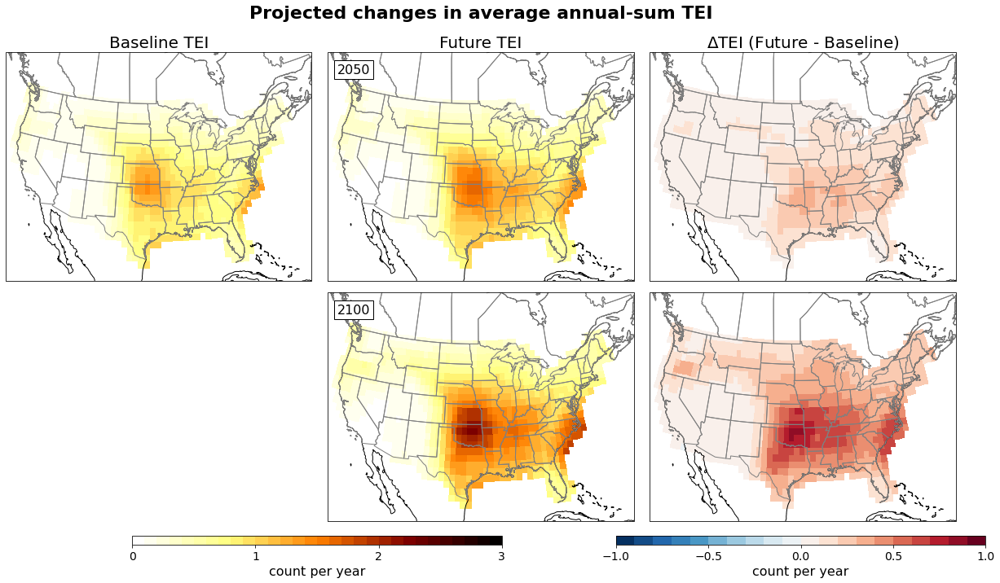

In [164]:
fig = plt.figure(figsize=(18,10))
st = fig.suptitle('Projected changes in average annual-sum TEI',weight='bold',fontsize=22)

for iy, year in enumerate(year_out):
    print(year)

    ax1,x,y = Map_CONUS(2,3,iy*3+2,lons,lats)
    c1 = ax1.pcolormesh(x,y,TEI_future[iy],cmap=cmap,norm=norm,transform=PC)
    ax1.pcolormesh(x,y,TEI_future[iy],cmap=cmap,norm=norm,transform=PC)
    ax1.text(
        x=0.03, y=0.95, 
        s=year, 
        transform=plt.gca().transAxes, 
        fontsize=16, 
        verticalalignment='top', 
        bbox=dict(facecolor='white', edgecolor='black')
    )
    
    ax10,x,y = Map_CONUS(2,3,iy*3+3,lons,lats)
    c10 = ax10.pcolormesh(x,y,dTEI[iy],cmap=cmap2,norm=norm2,transform=PC)
    # add_sig_symbols(count[iy], ax10)
    
    if iy==0:
        ax,x,y = Map_CONUS(2,3,iy*3+1,lons,lats)
        c = ax.pcolormesh(x,y,TEI_hist_baseline,cmap=cmap,norm=norm,transform=PC)
        ax.set_title('Baseline TEI', fontsize=20)
        ax1.set_title('Future TEI', fontsize=20)
        ax10.set_title('$\Delta$TEI (Future - Baseline)', fontsize=20)

cbaxes = plt.axes([0.17, .06, 0.35, 0.015])
cb = plt.colorbar(c, orientation='horizontal', cax = cbaxes, ticks=np.arange(0,12+1,1))
cb.ax.tick_params(labelsize=14)
cb.ax.set_xlabel('count per year',fontsize=16)

cbaxes = plt.axes([1-0.022-0.35, .06, 0.35, 0.015])
cb = plt.colorbar(c10, orientation='horizontal', cax = cbaxes,ticks=np.arange(-12,12+.5,.5))
cb.ax.tick_params(labelsize=14)
cb.ax.set_xlabel('count per year',fontsize=16)
    
fig.subplots_adjust(wspace=.05, hspace=.05,top=0.9,bottom=0.1, left=0.05,right=0.95)
fig.set_facecolor('white')

# plt.savefig('Delta-modified-TEI_NBR_SRH-CAPE-CP_annual-sum_2050-vs-2100.png')

2050
2100


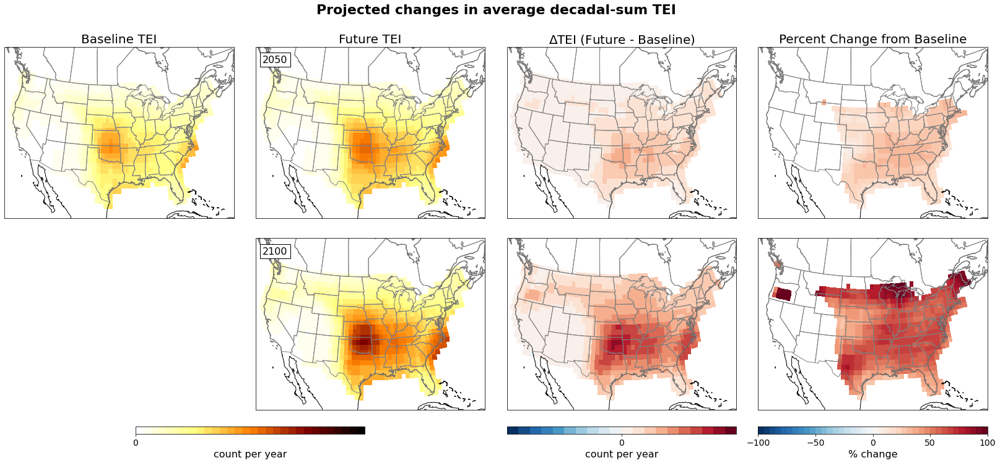

In [165]:
fig = plt.figure(figsize=(24.5,10.5))
st = fig.suptitle('Projected changes in average decadal-sum TEI',weight='bold',fontsize=22)

for iy, year in enumerate(year_out):
    print(year)

    ax1,x,y = Map_CONUS(2,4,iy*4+2,lons,lats)
    c1 = ax1.pcolormesh(x,y,TEI_future[iy],cmap=cmap,norm=norm,transform=PC)
    ax1.pcolormesh(x,y,TEI_future[iy],cmap=cmap,norm=norm,transform=PC)
    ax1.text(
        x=0.03, y=0.95, 
        s=year, 
        transform=plt.gca().transAxes, 
        fontsize=16, 
        verticalalignment='top', 
        bbox=dict(facecolor='white', edgecolor='black')
    )
    
    ax10,x,y = Map_CONUS(2,4,iy*4+3,lons,lats)
    c10 = ax10.pcolormesh(x,y,dTEI[iy],cmap=cmap2,norm=norm2,transform=PC)
    # add_sig_symbols(count[iy], ax10)
    
    ax100,x,y = Map_CONUS(2,4,iy*4+4,lons,lats)
    c100 = ax100.pcolormesh(x,y,dpTEI[iy],cmap=cmap3,norm=norm3,transform=PC)
    
    if iy==0:
        ax,x,y = Map_CONUS(2,4,iy*4+1,lons,lats)
        c = ax.pcolormesh(x,y,TEI_hist_baseline,cmap=cmap,norm=norm,transform=PC)
        ax.set_title('Baseline TEI', fontsize=20)
        ax1.set_title('Future TEI', fontsize=20)
        ax10.set_title('$\Delta$TEI (Future - Baseline)', fontsize=20)
        ax100.set_title('Percent Change from Baseline', fontsize=20)

cbaxes = plt.axes([0.17, .06, 0.21, 0.015])
cb = plt.colorbar(c, orientation='horizontal', cax = cbaxes, ticks=10*np.arange(0,12+1,1))
cb.ax.tick_params(labelsize=14)
cb.ax.set_xlabel('count per year',fontsize=16)

cbaxes = plt.axes([0.51, .06, 0.21, 0.015])
cb = plt.colorbar(c10, orientation='horizontal', cax = cbaxes,ticks=10*np.arange(-12,12+.5,.5))
cb.ax.tick_params(labelsize=14)
cb.ax.set_xlabel('count per year',fontsize=16)

cbaxes = plt.axes([0.95-0.21, .06, 0.21, 0.015])
cb = plt.colorbar(c100, orientation='horizontal', cax = cbaxes,ticks=np.arange(-100,100+50,50))
cb.ax.tick_params(labelsize=14)
cb.ax.set_xlabel('% change',fontsize=16)
    
fig.subplots_adjust(wspace=.095, hspace=.05,top=0.9,bottom=0.1, left=0.05,right=0.95)
fig.set_facecolor('white')

# plt.savefig('Delta-modified-TEI_PR_SRH-CAPE-CP_decadal-sum_2050-vs-2100.png')

2050
2100


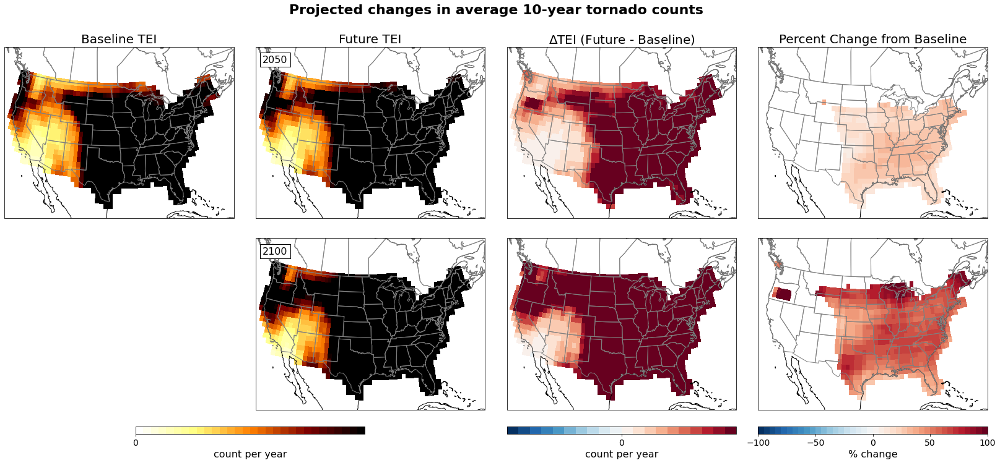

In [166]:
fig = plt.figure(figsize=(24.5,10.5))
st = fig.suptitle('Projected changes in average 10-year tornado counts',weight='bold',fontsize=22)

for iy, year in enumerate(year_out):
    print(year)

    ax1,x,y = Map_CONUS(2,4,iy*4+2,lons,lats)
    c1 = ax1.pcolormesh(x,y,10*TEI_future[iy],cmap=cmap,norm=norm,transform=PC)
    ax1.pcolormesh(x,y,10*TEI_future[iy],cmap=cmap,norm=norm,transform=PC)
    ax1.text(
        x=0.03, y=0.95, 
        s=year, 
        transform=plt.gca().transAxes, 
        fontsize=16, 
        verticalalignment='top', 
        bbox=dict(facecolor='white', edgecolor='black')
    )
    
    ax10,x,y = Map_CONUS(2,4,iy*4+3,lons,lats)
    c10 = ax10.pcolormesh(x,y,10*dTEI[iy],cmap=cmap2,norm=norm2,transform=PC)
    # add_sig_symbols(count[iy], ax10)
    
    ax100,x,y = Map_CONUS(2,4,iy*4+4,lons,lats)
    c100 = ax100.pcolormesh(x,y,dpTEI[iy],cmap=cmap3,norm=norm3,transform=PC)
    
    if iy==0:
        ax,x,y = Map_CONUS(2,4,iy*4+1,lons,lats)
        c = ax.pcolormesh(x,y,10*TEI_hist_baseline,cmap=cmap,norm=norm,transform=PC)
        ax.set_title('Baseline TEI', fontsize=20)
        ax1.set_title('Future TEI', fontsize=20)
        ax10.set_title('$\Delta$TEI (Future - Baseline)', fontsize=20)
        ax100.set_title('Percent Change from Baseline', fontsize=20)

cbaxes = plt.axes([0.17, .06, 0.21, 0.015])
cb = plt.colorbar(c, orientation='horizontal', cax = cbaxes, ticks=np.arange(0,120+10,10))
cb.ax.tick_params(labelsize=14)
cb.ax.set_xlabel('count per year',fontsize=16)

cbaxes = plt.axes([0.51, .06, 0.21, 0.015])
cb = plt.colorbar(c10, orientation='horizontal', cax = cbaxes,ticks=np.arange(-120,120+5,5))
cb.ax.tick_params(labelsize=14)
cb.ax.set_xlabel('count per year',fontsize=16)

cbaxes = plt.axes([0.95-0.21, .06, 0.21, 0.015])
cb = plt.colorbar(c100, orientation='horizontal', cax = cbaxes,ticks=np.arange(-100,100+50,50))
cb.ax.tick_params(labelsize=14)
cb.ax.set_xlabel('% change',fontsize=16)
    
fig.subplots_adjust(wspace=.095, hspace=.05,top=0.9,bottom=0.1, left=0.05,right=0.95)
fig.set_facecolor('white')

# plt.savefig('figures/CMIP-NHI/Delta-modified-TEI_PR_SRH-CAPE-CP_decadal-sum_2050-vs-2100.png')

###### plotting environs

In [167]:
dCP_2100 = 86400 *( CP_future_2100 - CP_hist_baseline) # note units change with *86400

In [168]:
dCP_2050 = 86400* (CP_future_2050 - CP_hist_baseline)

In [169]:
# dpTEI_2100 = xr.where((CP_hist_baseline>0.5)|(CP_future_2100>0.5), 100*((TEI_future_2100 - TEI_hist_baseline) / TEI_hist_baseline), np.nan)
dpCP_2100 = 100*((CP_future_2100 - CP_hist_baseline) / CP_hist_baseline)

In [170]:
# dpTEI_2050 = xr.where((CP_hist_baseline>0.5)|(CP_future_2050>0.5), 100*((TEI_future_2050 - TEI_hist_baseline) / TEI_hist_baseline), np.nan)
dpCP_2050 = 100*((CP_future_2050 - CP_hist_baseline) / CP_hist_baseline)

In [172]:
year_out = ['2050','2100']
CP_future = [CP_future_2050,CP_future_2100]
dCP = [dCP_2050,dCP_2100]
dpCP = [dpCP_2050,dpCP_2100]

In [173]:
lons,lats = dTEI_2100.lon.values,dTEI_2100.lat.values

In [174]:
from MapDomains import Map_CONUS

In [175]:
from matplotlib.colors import BoundaryNorm
from matplotlib.ticker import MaxNLocator
import numpy.ma as ma

cmap = plt.get_cmap('GnBu')
# levels = MaxNLocator(nbins=31).tick_values(0, 2)
levels = MaxNLocator(nbins=31).tick_values(0, 2.4) #*10
norm = BoundaryNorm(levels, ncolors=cmap.N, clip=True)

cmap2= plt.get_cmap('RdBu_r')
# levels2 = MaxNLocator(nbins=41).tick_values(-1, 1)
levels2 = MaxNLocator(nbins=21).tick_values(-0.6, 0.6) #*10
norm2 = BoundaryNorm(levels2, ncolors=cmap.N, clip=True)

cmap3= plt.get_cmap('RdBu_r')
# levels2 = MaxNLocator(nbins=41).tick_values(-1, 1)
levels3 = MaxNLocator(nbins=41).tick_values(-100, 100)
norm3 = BoundaryNorm(levels3, ncolors=cmap3.N, clip=True)

2050
2100


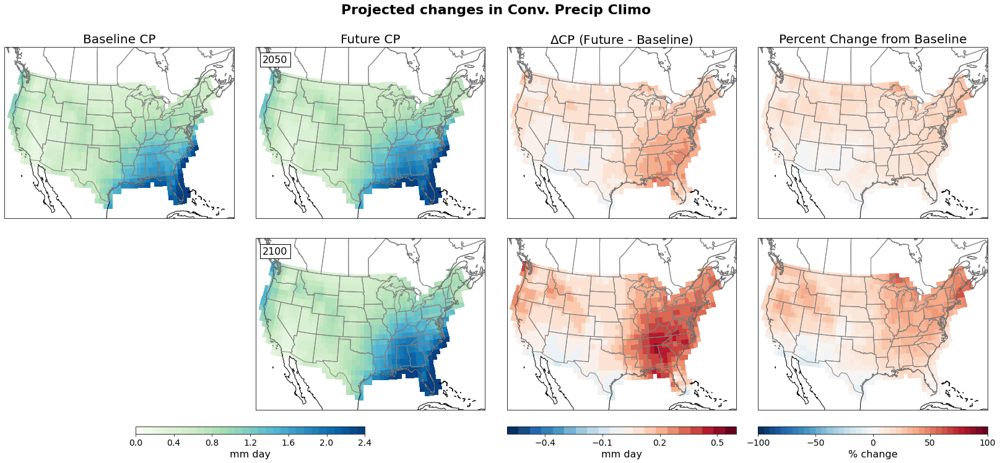

In [176]:
fig = plt.figure(figsize=(24.5,10.5))
st = fig.suptitle('Projected changes in Conv. Precip Climo',weight='bold',fontsize=22)

for iy, year in enumerate(year_out):
    print(year)

    ax1,x,y = Map_CONUS(2,4,iy*4+2,lons,lats)
    c1 = ax1.pcolormesh(x,y,86400*CP_future[iy],cmap=cmap,norm=norm,transform=PC)
    ax1.pcolormesh(x,y,86400*CP_future[iy],cmap=cmap,norm=norm,transform=PC)
    ax1.text(
        x=0.03, y=0.95, 
        s=year, 
        transform=plt.gca().transAxes, 
        fontsize=16, 
        verticalalignment='top', 
        bbox=dict(facecolor='white', edgecolor='black')
    )
    
    ax10,x,y = Map_CONUS(2,4,iy*4+3,lons,lats)
    c10 = ax10.pcolormesh(x,y,dCP[iy],cmap=cmap2,norm=norm2,transform=PC)
    # add_sig_symbols(count[iy], ax10)
    
    ax100,x,y = Map_CONUS(2,4,iy*4+4,lons,lats)
    c100 = ax100.pcolormesh(x,y,dpCP[iy],cmap=cmap3,norm=norm3,transform=PC)
    
    if iy==0:
        ax,x,y = Map_CONUS(2,4,iy*4+1,lons,lats)
        c = ax.pcolormesh(x,y,86400*CP_hist_baseline,cmap=cmap,norm=norm,transform=PC)
        ax.set_title('Baseline CP', fontsize=20)
        ax1.set_title('Future CP', fontsize=20)
        ax10.set_title('$\Delta$CP (Future - Baseline)', fontsize=20)
        ax100.set_title('Percent Change from Baseline', fontsize=20)

cbaxes = plt.axes([0.17, .06, 0.21, 0.015])
cb = plt.colorbar(c, orientation='horizontal', cax = cbaxes, ticks=np.arange(0,4+.4,.4))
cb.ax.tick_params(labelsize=14)
cb.ax.set_xlabel('mm day',fontsize=16)

cbaxes = plt.axes([0.51, .06, 0.21, 0.015])
cb = plt.colorbar(c10, orientation='horizontal', cax = cbaxes,ticks=np.arange(-4,4+.3,.3))
cb.ax.tick_params(labelsize=14)
cb.ax.set_xlabel('mm day',fontsize=16)

cbaxes = plt.axes([0.95-0.21, .06, 0.21, 0.015])
cb = plt.colorbar(c100, orientation='horizontal', cax = cbaxes,ticks=np.arange(-100,100+50,50))
cb.ax.tick_params(labelsize=14)
cb.ax.set_xlabel('% change',fontsize=16)
    
fig.subplots_adjust(wspace=.095, hspace=.05,top=0.9,bottom=0.1, left=0.05,right=0.95)
fig.set_facecolor('white')

# plt.savefig('figures/CMIP-NHI/Delta-CP_2050-vs-2100_ssp585.png')

In [177]:
dSRH_2100 =  ( SRH_future_2100 - SRH_hist_baseline)

In [178]:
dSRH_2050 = (SRH_future_2050 - SRH_hist_baseline)

In [179]:
# dpTEI_2100 = xr.where((CP_hist_baseline>0.5)|(CP_future_2100>0.5), 100*((TEI_future_2100 - TEI_hist_baseline) / TEI_hist_baseline), np.nan)
dpSRH_2100 = 100*((SRH_future_2100 - SRH_hist_baseline) / SRH_hist_baseline)

In [180]:
dSRH_2100 =  ( SRH_future_2100 - SRH_hist_baseline)

In [181]:
dSRH_2050 = (SRH_future_2050 - SRH_hist_baseline)

In [182]:
# dpTEI_2100 = xr.where((CP_hist_baseline>0.5)|(CP_future_2100>0.5), 100*((TEI_future_2100 - TEI_hist_baseline) / TEI_hist_baseline), np.nan)
dpSRH_2100 = 100*((SRH_future_2100 - SRH_hist_baseline) / SRH_hist_baseline)

In [183]:
# dpTEI_2050 = xr.where((CP_hist_baseline>0.5)|(CP_future_2050>0.5), 100*((TEI_future_2050 - TEI_hist_baseline) / TEI_hist_baseline), np.nan)
dpSRH_2050 = 100*((SRH_future_2050 - SRH_hist_baseline) / SRH_hist_baseline)

In [184]:
year_out = ['2050','2100']
SRH_future = [SRH_future_2050,SRH_future_2100]
dSRH = [dSRH_2050,dSRH_2100]
dpSRH = [dpSRH_2050,dpSRH_2100]

In [185]:
lons,lats = dTEI_2100.lon.values,dTEI_2100.lat.values

In [186]:
from MapDomains import Map_CONUS

In [187]:
from matplotlib.colors import BoundaryNorm
from matplotlib.ticker import MaxNLocator
import numpy.ma as ma

cmap = plt.get_cmap('magma_r')
# levels = MaxNLocator(nbins=31).tick_values(0, 2)
levels = MaxNLocator(nbins=31).tick_values(20, 140) #*10
norm = BoundaryNorm(levels, ncolors=cmap.N, clip=True)

cmap2= plt.get_cmap('RdBu_r')
# levels2 = MaxNLocator(nbins=41).tick_values(-1, 1)
levels2 = MaxNLocator(nbins=21).tick_values(-10, 10) #*10
norm2 = BoundaryNorm(levels2, ncolors=cmap.N, clip=True)

cmap3= plt.get_cmap('RdBu_r')
# levels2 = MaxNLocator(nbins=41).tick_values(-1, 1)
levels3 = MaxNLocator(nbins=41).tick_values(-100, 100)
norm3 = BoundaryNorm(levels3, ncolors=cmap3.N, clip=True)

2050
2100


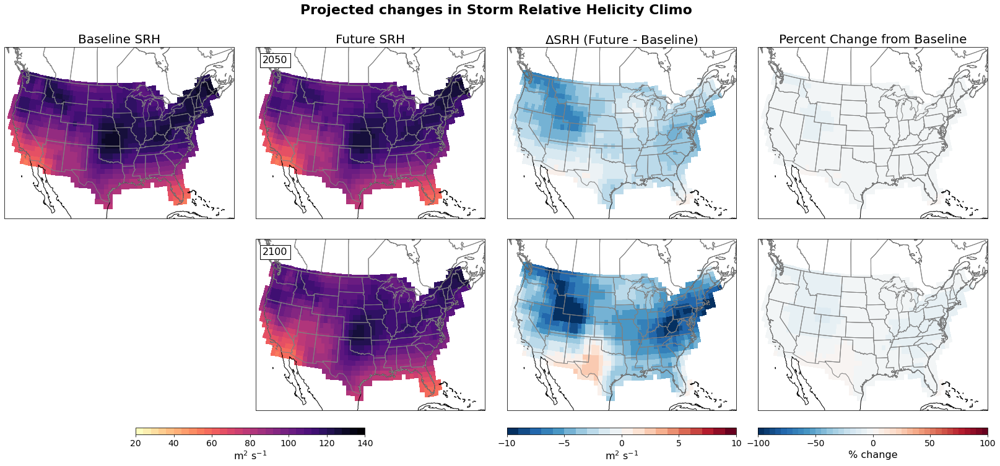

In [188]:
fig = plt.figure(figsize=(24.5,10.5))
st = fig.suptitle('Projected changes in Storm Relative Helicity Climo',weight='bold',fontsize=22)

for iy, year in enumerate(year_out):
    print(year)

    ax1,x,y = Map_CONUS(2,4,iy*4+2,lons,lats)
    c1 = ax1.pcolormesh(x,y,SRH_future[iy],cmap=cmap,norm=norm,transform=PC)
    ax1.pcolormesh(x,y,SRH_future[iy],cmap=cmap,norm=norm,transform=PC)
    ax1.text(
        x=0.03, y=0.95, 
        s=year, 
        transform=plt.gca().transAxes, 
        fontsize=16, 
        verticalalignment='top', 
        bbox=dict(facecolor='white', edgecolor='black')
    )
    
    ax10,x,y = Map_CONUS(2,4,iy*4+3,lons,lats)
    c10 = ax10.pcolormesh(x,y,dSRH[iy],cmap=cmap2,norm=norm2,transform=PC)
    # add_sig_symbols(count[iy], ax10)
    
    ax100,x,y = Map_CONUS(2,4,iy*4+4,lons,lats)
    c100 = ax100.pcolormesh(x,y,dpSRH[iy],cmap=cmap3,norm=norm3,transform=PC)
    
    if iy==0:
        ax,x,y = Map_CONUS(2,4,iy*4+1,lons,lats)
        c = ax.pcolormesh(x,y,SRH_hist_baseline,cmap=cmap,norm=norm,transform=PC)
        ax.set_title('Baseline SRH', fontsize=20)
        ax1.set_title('Future SRH', fontsize=20)
        ax10.set_title('$\Delta$SRH (Future - Baseline)', fontsize=20)
        ax100.set_title('Percent Change from Baseline', fontsize=20)

cbaxes = plt.axes([0.17, .06, 0.21, 0.015])
cb = plt.colorbar(c, orientation='horizontal', cax = cbaxes, ticks=np.arange(0,200+20,20))
cb.ax.tick_params(labelsize=14)
cb.ax.set_xlabel('m$^{2}$ s$^{-1}$',fontsize=16)

cbaxes = plt.axes([0.51, .06, 0.21, 0.015])
cb = plt.colorbar(c10, orientation='horizontal', cax = cbaxes,ticks=np.arange(-20,20+5,5))
cb.ax.tick_params(labelsize=14)
cb.ax.set_xlabel('m$^{2}$ s$^{-1}$',fontsize=16)

cbaxes = plt.axes([0.95-0.21, .06, 0.21, 0.015])
cb = plt.colorbar(c100, orientation='horizontal', cax = cbaxes,ticks=np.arange(-100,100+50,50))
cb.ax.tick_params(labelsize=14)
cb.ax.set_xlabel('% change',fontsize=16)
    
fig.subplots_adjust(wspace=.095, hspace=.05,top=0.9,bottom=0.1, left=0.05,right=0.95)
fig.set_facecolor('white')

# plt.savefig('figures/CMIP-NHI/Delta-SRH_2050-vs-2100_ssp585.png')

In [189]:
dCAPE_2100 =  ( CAPE_future_2100 - CAPE_hist_baseline)

In [190]:
dCAPE_2050 = (CAPE_future_2050 - CAPE_hist_baseline)

In [191]:
# dpTEI_2100 = xr.where((CP_hist_baseline>0.5)|(CP_future_2100>0.5), 100*((TEI_future_2100 - TEI_hist_baseline) / TEI_hist_baseline), np.nan)
dpCAPE_2100 = 100*((CAPE_future_2100 - CAPE_hist_baseline) / CAPE_hist_baseline)

In [192]:
dCAPE_2100 =  ( CAPE_future_2100 - CAPE_hist_baseline)

In [193]:
dCAPE_2050 = (CAPE_future_2050 - CAPE_hist_baseline)

In [194]:
# dpTEI_2100 = xr.where((CP_hist_baseline>0.5)|(CP_future_2100>0.5), 100*((TEI_future_2100 - TEI_hist_baseline) / TEI_hist_baseline), np.nan)
dpCAPE_2100 = 100*((CAPE_future_2100 - CAPE_hist_baseline) / CAPE_hist_baseline)

In [195]:
# dpTEI_2050 = xr.where((CP_hist_baseline>0.5)|(CP_future_2050>0.5), 100*((TEI_future_2050 - TEI_hist_baseline) / TEI_hist_baseline), np.nan)
dpCAPE_2050 = 100*((CAPE_future_2050 - CAPE_hist_baseline) / CAPE_hist_baseline)

In [196]:
year_out = ['2050','2100']
CAPE_future = [CAPE_future_2050,CAPE_future_2100]
dCAPE = [dCAPE_2050,dCAPE_2100]
dpCAPE = [dpCAPE_2050,dpCAPE_2100]

In [197]:
lons,lats = dTEI_2100.lon.values,dTEI_2100.lat.values

In [198]:
from MapDomains import Map_CONUS

In [199]:
from matplotlib.colors import BoundaryNorm
from matplotlib.ticker import MaxNLocator
import numpy.ma as ma

cmap = plt.get_cmap('BuPu')
# levels = MaxNLocator(nbins=31).tick_values(0, 2)
levels = MaxNLocator(nbins=31).tick_values(0, 1200) #*10
norm = BoundaryNorm(levels, ncolors=cmap.N, clip=True)

cmap2= plt.get_cmap('RdBu_r')
# levels2 = MaxNLocator(nbins=41).tick_values(-1, 1)
levels2 = MaxNLocator(nbins=21).tick_values(-600, 600) #*10
norm2 = BoundaryNorm(levels2, ncolors=cmap.N, clip=True)

cmap3= plt.get_cmap('RdBu_r')
# levels2 = MaxNLocator(nbins=41).tick_values(-1, 1)
levels3 = MaxNLocator(nbins=41).tick_values(-100, 100)
norm3 = BoundaryNorm(levels3, ncolors=cmap3.N, clip=True)

In [200]:
def add_sig_symbols(data,ax):
    for i in range(len(data.lat.values)):
        for j in range(len(data.lon.values)):
            if data[i,j] > 4:
                # print(j,i)
                # ax.plot(lons[j], lats[i], marker='\\', color='k',markersize=2,transform=PC)
                ax.add_patch(plt.Rectangle((lons[j]-0.5, lats[i]-0.5), 1, 1, hatch='///', facecolor='none', transform=PC))

2050
2100


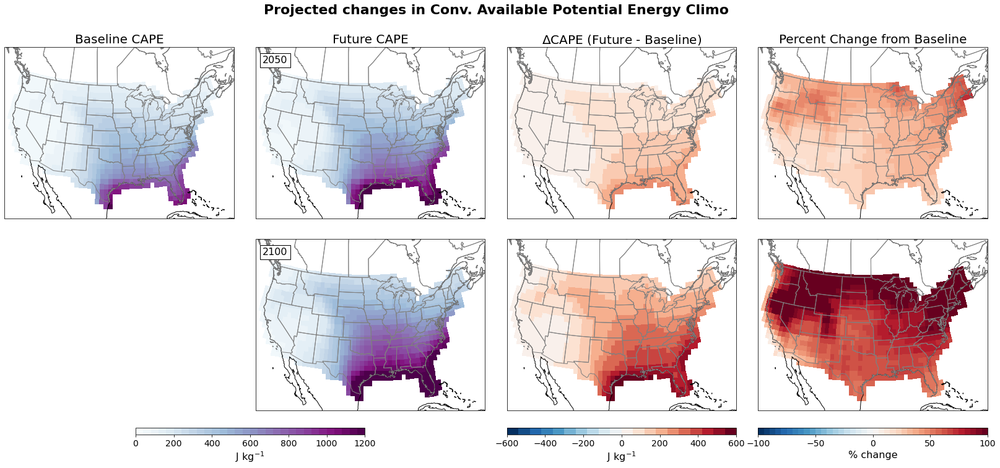

In [201]:
fig = plt.figure(figsize=(24.5,10.5))
st = fig.suptitle('Projected changes in Conv. Available Potential Energy Climo',weight='bold',fontsize=22)

for iy, year in enumerate(year_out):
    print(year)

    ax1,x,y = Map_CONUS(2,4,iy*4+2,lons,lats)
    c1 = ax1.pcolormesh(x,y,CAPE_future[iy],cmap=cmap,norm=norm,transform=PC)
    ax1.pcolormesh(x,y,CAPE_future[iy],cmap=cmap,norm=norm,transform=PC)
    ax1.text(
        x=0.03, y=0.95, 
        s=year, 
        transform=plt.gca().transAxes, 
        fontsize=16, 
        verticalalignment='top', 
        bbox=dict(facecolor='white', edgecolor='black')
    )
    
    ax10,x,y = Map_CONUS(2,4,iy*4+3,lons,lats)
    c10 = ax10.pcolormesh(x,y,dCAPE[iy],cmap=cmap2,norm=norm2,transform=PC)
    # add_sig_symbols(count[iy], ax10)
    
    ax100,x,y = Map_CONUS(2,4,iy*4+4,lons,lats)
    c100 = ax100.pcolormesh(x,y,dpCAPE[iy],cmap=cmap3,norm=norm3,transform=PC)
    
    if iy==0:
        ax,x,y = Map_CONUS(2,4,iy*4+1,lons,lats)
        c = ax.pcolormesh(x,y,CAPE_hist_baseline,cmap=cmap,norm=norm,transform=PC)
        ax.set_title('Baseline CAPE', fontsize=20)
        ax1.set_title('Future CAPE', fontsize=20)
        ax10.set_title('$\Delta$CAPE (Future - Baseline)', fontsize=20)
        ax100.set_title('Percent Change from Baseline', fontsize=20)

cbaxes = plt.axes([0.17, .06, 0.21, 0.015])
cb = plt.colorbar(c, orientation='horizontal', cax = cbaxes, ticks=np.arange(0,1200+200,200))
cb.ax.tick_params(labelsize=14)
cb.ax.set_xlabel('J kg$^{-1}$',fontsize=16)

cbaxes = plt.axes([0.51, .06, 0.21, 0.015])
cb = plt.colorbar(c10, orientation='horizontal', cax = cbaxes,ticks=np.arange(-600,600+200,200))
cb.ax.tick_params(labelsize=14)
cb.ax.set_xlabel('J kg$^{-1}$',fontsize=16)

cbaxes = plt.axes([0.95-0.21, .06, 0.21, 0.015])
cb = plt.colorbar(c100, orientation='horizontal', cax = cbaxes,ticks=np.arange(-100,100+50,50))
cb.ax.tick_params(labelsize=14)
cb.ax.set_xlabel('% change',fontsize=16)
    
fig.subplots_adjust(wspace=.095, hspace=.05,top=0.9,bottom=0.1, left=0.05,right=0.95)
fig.set_facecolor('white')

# plt.savefig('figures/CMIP-NHI/Delta-CAPE_2050-vs-2100_ssp585.png')

##### calculate $\Delta$TEI for 2040-2060, 2080-2100

In [187]:
TEI_future_2100 = tornado_total_ssp245_ds.tornado_pred.sel(time=(tornado_total_ssp245_ds.tornado_pred['time.year']>=2081)\
                                                           &(tornado_total_ssp245_ds.tornado_pred['time.year']<=2100))\
                                                       .groupby('time.year').sum('time').mean('year').where(CONUS_mask>0)#.plot()
TEI_future_2100.shape

(26, 71)

In [188]:
TEI_future_2050 = tornado_total_ssp245_ds.tornado_pred.sel(time=(tornado_total_ssp245_ds.tornado_pred['time.year']>=2041)\
                                                           &(tornado_total_ssp245_ds.tornado_pred['time.year']<=2060))\
                                                       .groupby('time.year').sum('time').mean('year').where(CONUS_mask>0)#.plot()
TEI_future_2050.shape

(26, 71)

###### save gridded ds

In [189]:
annual_TEI_climo_ds = xr.Dataset(
    # dictionary for data vars
    {
     'historical': (['lat', 'lon'], TEI_hist_baseline.values),
     'ssp245_2050': (['lat', 'lon'], TEI_future_2050.values),
     'ssp245_2100': (['lat', 'lon'], TEI_future_2100.values),
    },
    coords = {
        'lat': (['lat',], TEI_hist_baseline.lat.values),
        'lon': (['lon',], TEI_hist_baseline.lon.values)
    }
)
annual_TEI_climo_ds

<xarray.Dataset>
Dimensions:      (lat: 26, lon: 71)
Coordinates:
  * lat          (lat) float64 25.0 26.0 27.0 28.0 29.0 ... 47.0 48.0 49.0 50.0
  * lon          (lon) float64 230.0 231.0 232.0 233.0 ... 298.0 299.0 300.0
Data variables:
    historical   (lat, lon) float32 nan nan nan nan nan ... nan nan nan nan nan
    ssp245_2050  (lat, lon) float64 nan nan nan nan nan ... nan nan nan nan nan
    ssp245_2100  (lat, lon) float64 nan nan nan nan nan ... nan nan nan nan nan

In [107]:
annual_TEI_climo_ds.to_netcdf('/local/BLOB/annual-TEI_climo_ds.nc')

In [109]:
annual_TEI_climo_df = annual_TEI_climo_ds.to_dataframe().reset_index()
annual_TEI_climo_df

,lat,lon,historical,ssp585_2050,ssp585_2100
0,25.0,230.0,NaN,NaN,NaN
1,25.0,231.0,NaN,NaN,NaN
2,25.0,232.0,NaN,NaN,NaN
3,25.0,233.0,NaN,NaN,NaN
4,25.0,234.0,NaN,NaN,NaN
...,...,...,...,...,...
1841,50.0,296.0,NaN,NaN,NaN
1842,50.0,297.0,NaN,NaN,NaN
1843,50.0,298.0,NaN,NaN,NaN
1844,50.0,299.0,NaN,NaN,NaN


In [110]:
annual_TEI_climo_df.to_csv('/local/BLOB/annual-TEI_climo_df.csv')

###### plotting cont

In [82]:
# TEI_future_2050 = tornado_total_ssp585_ds.tornado_pred.sel(time=(tornado_total_ssp585_ds.tornado_pred['time.year']>=2041)\
#                                                            &(tornado_total_ssp585_ds.tornado_pred['time.year']<=2060))\
#                                                        .groupby('time.year').sum('time').sum('year').where(CONUS_mask>0) / 2.#.plot()
# TEI_future_2050.shape

In [190]:
dTEI_2100 = TEI_future_2100 - TEI_hist_baseline

In [191]:
dTEI_2050 = TEI_future_2050 - TEI_hist_baseline

In [192]:
dpTEI_2100 = xr.where((TEI_hist_baseline>0.5)|(TEI_future_2100>0.5), 100*((TEI_future_2100 - TEI_hist_baseline) / TEI_hist_baseline), np.nan)

In [193]:
dpTEI_2050 = xr.where((TEI_hist_baseline>0.5)|(TEI_future_2050>0.5), 100*((TEI_future_2050 - TEI_hist_baseline) / TEI_hist_baseline), np.nan)

In [194]:
lons,lats = dTEI_2100.lon.values,dTEI_2100.lat.values

In [195]:
from MapDomains import Map_CONUS

In [196]:
from matplotlib.colors import BoundaryNorm
from matplotlib.ticker import MaxNLocator
import numpy.ma as ma

cmap = plt.get_cmap('afmhot_r')
# levels = MaxNLocator(nbins=31).tick_values(0, 2)
levels = MaxNLocator(nbins=31).tick_values(0, 3) *10
norm = BoundaryNorm(levels, ncolors=cmap.N, clip=True)

cmap2= plt.get_cmap('RdBu_r')
# levels2 = MaxNLocator(nbins=41).tick_values(-1, 1)
levels2 = MaxNLocator(nbins=21).tick_values(-1, 1) *10
norm2 = BoundaryNorm(levels2, ncolors=cmap.N, clip=True)

cmap3= plt.get_cmap('RdBu_r')
# levels2 = MaxNLocator(nbins=41).tick_values(-1, 1)
levels3 = MaxNLocator(nbins=41).tick_values(-100, 100)
norm3 = BoundaryNorm(levels3, ncolors=cmap3.N, clip=True)

In [197]:
def add_sig_symbols(data,ax):
    for i in range(len(data.lat.values)):
        for j in range(len(data.lon.values)):
            if data[i,j] > 4:
                # print(j,i)
                # ax.plot(lons[j], lats[i], marker='\\', color='k',markersize=2,transform=PC)
                ax.add_patch(plt.Rectangle((lons[j]-0.5, lats[i]-0.5), 1, 1, hatch='///', facecolor='none', transform=PC))

In [199]:
year_out = ['2050','2100']
TEI_future = [TEI_future_2050,TEI_future_2100]
dTEI = [dTEI_2050,dTEI_2100]
dpTEI = [dpTEI_2050,dpTEI_2100]

2050
2100


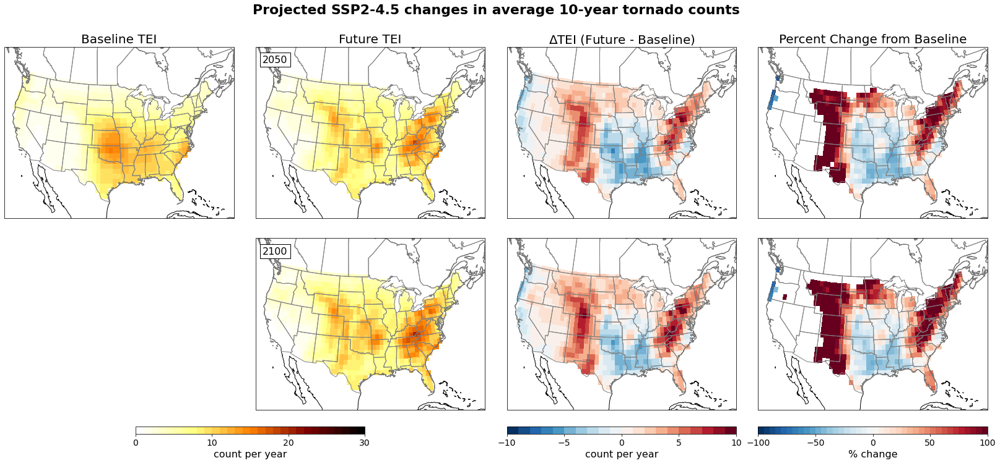

In [200]:
fig = plt.figure(figsize=(24.5,10.5))
st = fig.suptitle('Projected SSP2-4.5 changes in average 10-year tornado counts',weight='bold',fontsize=22)

for iy, year in enumerate(year_out):
    print(year)

    ax1,x,y = Map_CONUS(2,4,iy*4+2,lons,lats)
    c1 = ax1.pcolormesh(x,y,10*TEI_future[iy],cmap=cmap,norm=norm,transform=PC)
    ax1.pcolormesh(x,y,10*TEI_future[iy],cmap=cmap,norm=norm,transform=PC)
    ax1.text(
        x=0.03, y=0.95, 
        s=year, 
        transform=plt.gca().transAxes, 
        fontsize=16, 
        verticalalignment='top', 
        bbox=dict(facecolor='white', edgecolor='black')
    )
    
    ax10,x,y = Map_CONUS(2,4,iy*4+3,lons,lats)
    c10 = ax10.pcolormesh(x,y,10*dTEI[iy],cmap=cmap2,norm=norm2,transform=PC)
    # add_sig_symbols(count[iy], ax10)
    
    ax100,x,y = Map_CONUS(2,4,iy*4+4,lons,lats)
    c100 = ax100.pcolormesh(x,y,dpTEI[iy],cmap=cmap3,norm=norm3,transform=PC)
    
    if iy==0:
        ax,x,y = Map_CONUS(2,4,iy*4+1,lons,lats)
        c = ax.pcolormesh(x,y,10*TEI_hist_baseline,cmap=cmap,norm=norm,transform=PC)
        ax.set_title('Baseline TEI', fontsize=20)
        ax1.set_title('Future TEI', fontsize=20)
        ax10.set_title('$\Delta$TEI (Future - Baseline)', fontsize=20)
        ax100.set_title('Percent Change from Baseline', fontsize=20)

cbaxes = plt.axes([0.17, .06, 0.21, 0.015])
cb = plt.colorbar(c, orientation='horizontal', cax = cbaxes, ticks=np.arange(0,120+10,10))
cb.ax.tick_params(labelsize=14)
cb.ax.set_xlabel('count per year',fontsize=16)

cbaxes = plt.axes([0.51, .06, 0.21, 0.015])
cb = plt.colorbar(c10, orientation='horizontal', cax = cbaxes,ticks=np.arange(-120,120+5,5))
cb.ax.tick_params(labelsize=14)
cb.ax.set_xlabel('count per year',fontsize=16)

cbaxes = plt.axes([0.95-0.21, .06, 0.21, 0.015])
cb = plt.colorbar(c100, orientation='horizontal', cax = cbaxes,ticks=np.arange(-100,100+50,50))
cb.ax.tick_params(labelsize=14)
cb.ax.set_xlabel('% change',fontsize=16)
    
fig.subplots_adjust(wspace=.095, hspace=.05,top=0.9,bottom=0.1, left=0.05,right=0.95)
fig.set_facecolor('white')

plt.savefig('figures/CMIP-NHI/Delta-modified-TEI_PR_SRH-CAPE-CP_decadal-sum_2050-vs-2100_ssp245.png')